# Projet Open Food Facts

### Contexte et Présentation


L’agence Santé publique France souhaite améliorer la base de données Open Food Facts afin de faciliter la saisie des produits. Ce projet vise à développer un système de suggestion pour combler les valeurs manquantes lors de l’enregistrement d’un produit. L’objectif principal est de démontrer la faisabilité de cette approche en nettoyant et en explorant les données du fichier brut.

### Introduction et Objectifs :


### Introduction

Le projet se concentre dans un premier temps sur la préparation et l’analyse des données brutes. L’objectif est de créer un processus automatisé de sélection des variables (features) et de filtrage des enregistrements (lignes) afin d’identifier une cible dont plus de 50 % des valeurs sont manquantes. Ce choix permettra de simplifier la mise en place ultérieure d’un système de suggestion.

### Objectifs Globaux

- Charger et préparer les données brutes sous forme de DataFrame pandas.

- Identifier une cible parmi les variables (une feature avec moins de 50 % de valeurs renseignées) qui servira de référence pour la suite.

- Mettre en place un processus automatisé pour :

  Lister l’ensemble des features (numériques et catégorielles).

  Supprimer les produits ne possédant pas de valeur pour la cible.

  Séparer la cible du reste des données.

  Afficher le taux de remplissage des features.

  Sélectionner les features suffisamment renseignées (plus de 50 % de valeurs présentes).

  Supprimer les enregistrements en double.

---

## 1. Import des Bibliothèques

In [208]:
# Import des bibliothèques principales
import pandas as pd
import numpy as np
import missingno as msno
import matplotlib.pyplot as plt
import seaborn as sns

## 2. Chargement du Fichier CSV


Le fichier CSV se nomme fr.openfoodfacts.org.products.csv. Le séparateur utilisé est la tabulation (\t).

In [209]:
# Chargement du fichier CSV Open Food Facts
datacsv = pd.read_csv(
    'fr.openfoodfacts.org.products.csv',
    sep='\t',
    low_memory=False
)


Nous avons chargé les données brutes dans un DataFrame pour préparer les étapes de nettoyage et d’exploration.

## 3. Exploration basique

Affichage des 8 premières lignes du Dataframe :

In [210]:
# Affichage de quelques lignes pour aperçu
datacsv.head(8)

,code,url,creator,created_t,...,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,...,NaN,NaN,NaN,NaN
1,0000000004530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,...,14.0,14.0,NaN,NaN
2,0000000004559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,...,0.0,0.0,NaN,NaN
3,0000000016087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,...,12.0,12.0,NaN,NaN
4,0000000016094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,...,NaN,NaN,NaN,NaN
5,0000000016100,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055651,...,NaN,NaN,NaN,NaN
6,0000000016117,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055730,...,NaN,NaN,NaN,NaN
7,0000000016124,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055711,...,7.0,7.0,NaN,NaN


### Affichage d'informations générales sur le DataFrame

In [211]:
# Informations générales sur les colonnes et types
datacsv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 162 entries, code to water-hardness_100g
dtypes: float64(106), object(56)
memory usage: 396.5+ MB


In [212]:
# Taille du DataFrame
def datacheck(data):
    shape = data.shape
    print(f"Il y a {shape[0]} lignes et {shape[1]} colonnes\n")
    
datacheck(datacsv)

Il y a 320772 lignes et 162 colonnes



In [213]:
# Statistiques descriptives sur les variables numériques
datacsv.describe()


,no_nutriments,additives_n,ingredients_from_palm_oil_n,ingredients_from_palm_oil,...,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
count,0.0,248939.000000,248939.000000,0.0,...,221210.000000,221210.000000,0.0,0.0
mean,NaN,1.936024,0.019659,NaN,...,9.165535,9.058049,NaN,NaN
std,NaN,2.502019,0.140524,NaN,...,9.055903,9.183589,NaN,NaN
min,NaN,0.000000,0.000000,NaN,...,-15.000000,-15.000000,NaN,NaN
25%,NaN,0.000000,0.000000,NaN,...,1.000000,1.000000,NaN,NaN
50%,NaN,1.000000,0.000000,NaN,...,10.000000,9.000000,NaN,NaN
75%,NaN,3.000000,0.000000,NaN,...,16.000000,16.000000,NaN,NaN
max,NaN,31.000000,2.000000,NaN,...,40.000000,40.000000,NaN,NaN


Nous avons vérifié la structure et l’ampleur des valeurs pour mieux cibler les besoins de nettoyage.

---

#### Visualisation des valeurs manquantes

<Figure size 1200x600 with 0 Axes>

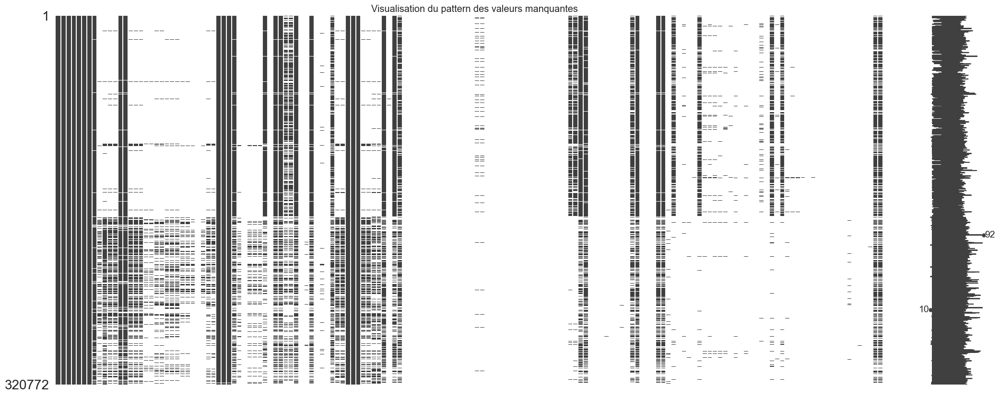

In [214]:
# Matrice de visualisation des NaN
plt.figure(figsize=(12, 6))
msno.matrix(datacsv)
plt.title("Visualisation du pattern des valeurs manquantes")
plt.tight_layout()
plt.show()

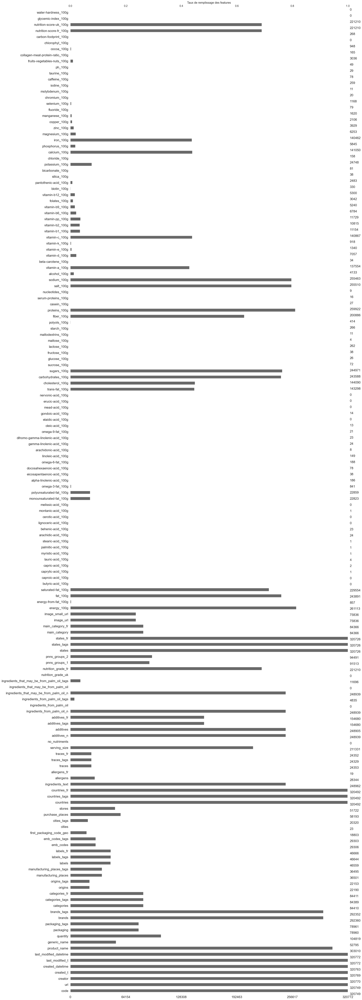

In [215]:
# Barplot du taux de remplissage
plt.figure(figsize=(12, 6))
msno.bar(datacsv)
plt.title("Taux de remplissage des features")
plt.tight_layout()
plt.show()

Nous avons repéré visuellement les colonnes très incomplètes.

---

Nombre de NaN par colonne :

In [216]:
# Compte le nombre de NaN dans chaque colonne
datacsv.isnull().sum()


code                                              23
url                                               23
creator                                            2
created_t                                          3
created_datetime                                   9
last_modified_t                                    0
last_modified_datetime                             0
product_name                                   17762
generic_name                                  267977
quantity                                      215953
packaging                                     241812
packaging_tags                                241811
brands                                         28412
brands_tags                                    28420
categories                                    236362
categories_tags                               236383
categories_fr                                 236361
origins                                       298582
origins_tags                                  

Nous avons listé précisément les colonnes les plus incomplètes.

---

In [217]:
# Identification des colonnes avec une seule valeur
for col in datacsv.columns:
    if datacsv[col].nunique() <= 1:
        print(f"Colonne à valeur unique détectée : {col}")

Colonne à valeur unique détectée : no_nutriments
Colonne à valeur unique détectée : ingredients_from_palm_oil
Colonne à valeur unique détectée : ingredients_that_may_be_from_palm_oil
Colonne à valeur unique détectée : nutrition_grade_uk
Colonne à valeur unique détectée : butyric-acid_100g
Colonne à valeur unique détectée : caproic-acid_100g
Colonne à valeur unique détectée : caprylic-acid_100g
Colonne à valeur unique détectée : myristic-acid_100g
Colonne à valeur unique détectée : palmitic-acid_100g
Colonne à valeur unique détectée : stearic-acid_100g
Colonne à valeur unique détectée : lignoceric-acid_100g
Colonne à valeur unique détectée : cerotic-acid_100g
Colonne à valeur unique détectée : montanic-acid_100g
Colonne à valeur unique détectée : melissic-acid_100g
Colonne à valeur unique détectée : elaidic-acid_100g
Colonne à valeur unique détectée : mead-acid_100g
Colonne à valeur unique détectée : erucic-acid_100g
Colonne à valeur unique détectée : nervonic-acid_100g
Colonne à valeur

Nous avons détecté et listé les colonnes sans variabilité.

---

## 4. Nettoyage et filtrage des features et produits

In [218]:
# Suppression des colonnes entièrement vides
datacsv = datacsv.dropna(axis=1, how='all')

In [219]:
datacsv.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 320772 entries, 0 to 320771
Columns: 146 entries, code to nutrition-score-uk_100g
dtypes: float64(90), object(56)
memory usage: 357.3+ MB


Nous avons supprimé toutes les colonnes totalement vides (146 colonnes restantes).

---

Features intéressantes : 

In [220]:
datacsv["nutrition_grade_fr"].describe()  


count     221210
unique         5
top            d
freq       62763
Name: nutrition_grade_fr, dtype: object

In [221]:
datacsv["nutrition_grade_fr"].unique()  


array([nan, 'd', 'b', 'c', 'a', 'e'], dtype=object)

In [222]:
datacsv["nutrition-score-fr_100g"].describe()  


count    221210.000000
mean          9.165535
std           9.055903
min         -15.000000
25%           1.000000
50%          10.000000
75%          16.000000
max          40.000000
Name: nutrition-score-fr_100g, dtype: float64

In [223]:
datacsv["pnns_groups_1"].describe() 

count       91513
unique         14
top       unknown
freq        22624
Name: pnns_groups_1, dtype: object

In [224]:
datacsv["pnns_groups_1"].unique()  

array([nan, 'unknown', 'Fruits and vegetables', 'Sugary snacks',
       'Cereals and potatoes', 'Composite foods', 'Fish Meat Eggs',
       'Beverages', 'Fat and sauces', 'fruits-and-vegetables',
       'Milk and dairy products', 'Salty snacks', 'sugary-snacks',
       'cereals-and-potatoes', 'salty-snacks'], dtype=object)

In [225]:
datacsv["pnns_groups_2"].describe() 

count       94491
unique         42
top       unknown
freq        22624
Name: pnns_groups_2, dtype: object

In [226]:
datacsv["pnns_groups_2"].unique()  

array([nan, 'unknown', 'Vegetables', 'Biscuits and cakes', 'Bread',
       'Legumes', 'Pizza pies and quiche', 'Meat', 'Sweets',
       'Non-sugared beverages', 'Sweetened beverages',
       'Dressings and sauces', 'One-dish meals', 'vegetables', 'Soups',
       'Chocolate products', 'Alcoholic beverages', 'Fruits', 'Sandwich',
       'Cereals', 'Milk and yogurt', 'Fats', 'Cheese', 'Appetizers',
       'Nuts', 'Breakfast cereals', 'Artificially sweetened beverages',
       'Fruit juices', 'Eggs', 'Fish and seafood', 'Dried fruits',
       'Ice cream', 'Processed meat', 'Potatoes', 'Dairy desserts',
       'Fruit nectars', 'pastries', 'Tripe dishes', 'fruits',
       'Salty and fatty products', 'cereals', 'legumes', 'nuts'],
      dtype=object)

Nous avons exploré rapidement quelques colonnes clés et leurs valeurs uniques.

---

Fonction finale d’automatisation du pipeline de nettoyage (Nettoyage et filtrage)

In [227]:
import pandas as pd
import numpy as np

def pretraitement_dataset(df, cibles, extras, seuil=0.5, exclure=None):
    """
    Automatisations du pipeline de nettoyage du dataset.
    
    Paramètres :
    - df        : DataFrame d'origine.
    - cibles    : liste des colonnes cibles à conserver (nutriscores 1 & 2 : score (a, b, c, d, e) et score (-15 à +40)).
    - extras    : colonnes supplémentaires (ici groupes PNNS 1 & 2 ).
    - seuil     : seuil minimal de remplissage pour conserver une colonne.
    - exclure   : colonnes à retirer (inutile où colonne trop vide à l'analyse).
    
    Retourne :
    - features_df : DataFrame des features nettoyées.
    - targets_df  : DataFrame des colonnes cibles.
    """
    # Retire les colonnes à exclure
    if exclure:
        df = df.drop(columns=exclure)

    # Constructiond e la liste des colonnes à conserver
    keep = []
    for col in df.columns:
        taux = df[col].notnull().mean()
        if taux >= seuil or col in cibles + extras:
            keep.append(col)

    # Filtre les colonnes
    df2 = df[keep].copy()

    # Enlève les lignes selonn les deux cibles
    df2 = df2[
        df2[cibles[0]].notnull() |
        df2[cibles[1]].notnull()
    ].copy()

    # suppression des lignes sans nom de produit
    df2 = df2[df2['product_name'].notnull()].copy()

    # Supprime les doublons
    df2 = df2.drop_duplicates()

    # Sépare targets et features
    targets_df  = df2[cibles]
    features_df = df2.drop(columns=cibles)

    return features_df, targets_df

# Chargement
datacsv = pd.read_csv(
    "fr.openfoodfacts.org.products.csv",
    sep="\t",
    encoding="utf-8",
    low_memory=False
)

# Définition des listes
cibles  = ["nutrition_grade_fr", "nutrition-score-fr_100g"]
extras  = ["pnns_groups_1", "pnns_groups_2"]
exclure = ["code","url","creator","created_t","created_datetime",
           "last_modified_t","last_modified_datetime", "nutrition-score-uk_100g", "ingredients_text", "states", "states_tags", "states_fr", "serving_size", "brands_tags", "countries_tags", "countries" ]

# Appel de la fonction (changer le seuil selon le taux de remplissage voulu (0 à 1))
features, targets = pretraitement_dataset(
    datacsv,
    cibles=cibles,
    extras=extras,
    seuil=0.5,
    exclure=exclure
)

data = pd.concat([features, targets], axis=1)


Nous avons défini une fonction permettant d’automatiser le nettoyage selon nos critères. (en précisiant listes, cibles, exclusions ...) Donc en préparant les listes de colonnes à conserver ou exclure.

In [228]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 215522 entries, 1 to 320768
Data columns (total 20 columns):
 #   Column                                   Non-Null Count   Dtype  
---  ------                                   --------------   -----  
 0   product_name                             215522 non-null  object 
 1   brands                                   213073 non-null  object 
 2   countries_fr                             215469 non-null  object 
 3   additives_n                              191987 non-null  float64
 4   additives                                191967 non-null  object 
 5   ingredients_from_palm_oil_n              191987 non-null  float64
 6   ingredients_that_may_be_from_palm_oil_n  191987 non-null  float64
 7   pnns_groups_1                            60808 non-null   object 
 8   pnns_groups_2                            60914 non-null   object 
 9   energy_100g                              215337 non-null  float64
 10  fat_100g                             

Nous avons appliqué le pipeline et obtenu un DataFrame de 215 522 lignes et 20 colonnes.

---

In [229]:
def datacheck(data):
    shape = data.shape
    print(f"Il y a {shape[0]} lignes et {shape[1]} colonnes\n")
    
datacheck(data)

Il y a 215522 lignes et 20 colonnes



In [230]:
data.describe()

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,...,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
count,191987.000000,191987.000000,191987.000000,2.153370e+05,...,215337.000000,215337.000000,215337.000000,215522.000000
mean,1.991546,0.021231,0.057467,1.196052e+03,...,7.773853,1.656240,0.652063,9.166976
std,2.533787,0.145877,0.275643,7.078404e+03,...,8.120471,139.215801,54.809370,9.050609
min,0.000000,0.000000,0.000000,0.000000e+00,...,-3.570000,0.000000,0.000000,-15.000000
25%,0.000000,0.000000,0.000000,4.530000e+02,...,1.900000,0.100000,0.039370,1.000000
50%,1.000000,0.000000,0.000000,1.193000e+03,...,5.700000,0.650240,0.256000,10.000000
75%,3.000000,0.000000,0.000000,1.715000e+03,...,10.710000,1.361440,0.536000,16.000000
max,31.000000,2.000000,6.000000,3.251373e+06,...,430.000000,64312.800000,25320.000000,40.000000


In [231]:
data.head(8)

,product_name,brands,countries_fr,additives_n,...,salt_100g,sodium_100g,nutrition_grade_fr,nutrition-score-fr_100g
1,Banana Chips Sweetened (Whole),NaN,États-Unis,0.0,...,0.00000,0.000,d,14.0
2,Peanuts,Torn & Glasser,États-Unis,0.0,...,0.63500,0.250,b,0.0
3,Organic Salted Nut Mix,Grizzlies,États-Unis,0.0,...,1.22428,0.482,d,12.0
7,Organic Muesli,Daddy's Muesli,États-Unis,2.0,...,0.13970,0.055,c,7.0
12,Zen Party Mix,Sunridge,États-Unis,1.0,...,1.60782,0.633,d,12.0
15,Cinnamon Nut Granola,Grizzlies,États-Unis,0.0,...,0.02286,0.009,b,0.0
16,Organic Hazelnuts,Grizzlies,États-Unis,0.0,...,0.01016,0.004,b,0.0
19,Organic Oat Groats,Pcc,États-Unis,0.0,...,0.02540,0.010,a,-6.0


Nous avons confirmé la taille et exploré sommairement les données numériques.

---

#### Visualisation des NaN après sélection des cibles


Text(0.5, 1.0, 'Visualisation du pattern des valeurs manquantes après séléction des cibles')

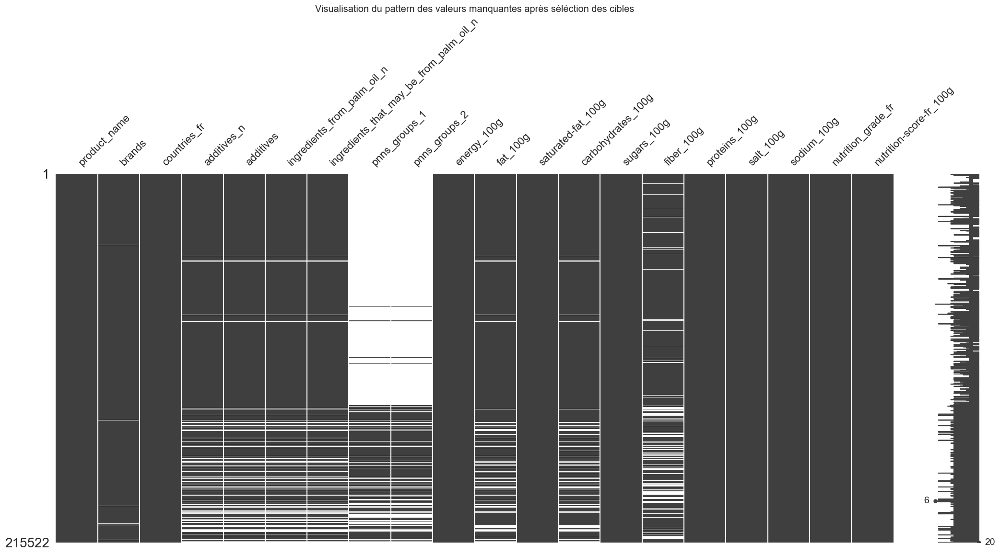

In [232]:
msno.matrix(data)
plt.title("Visualisation du pattern des valeurs manquantes après séléction des cibles")


<Axes: title={'center': 'Taux de remplissage des features après séléction des cibles et nettoyages'}>

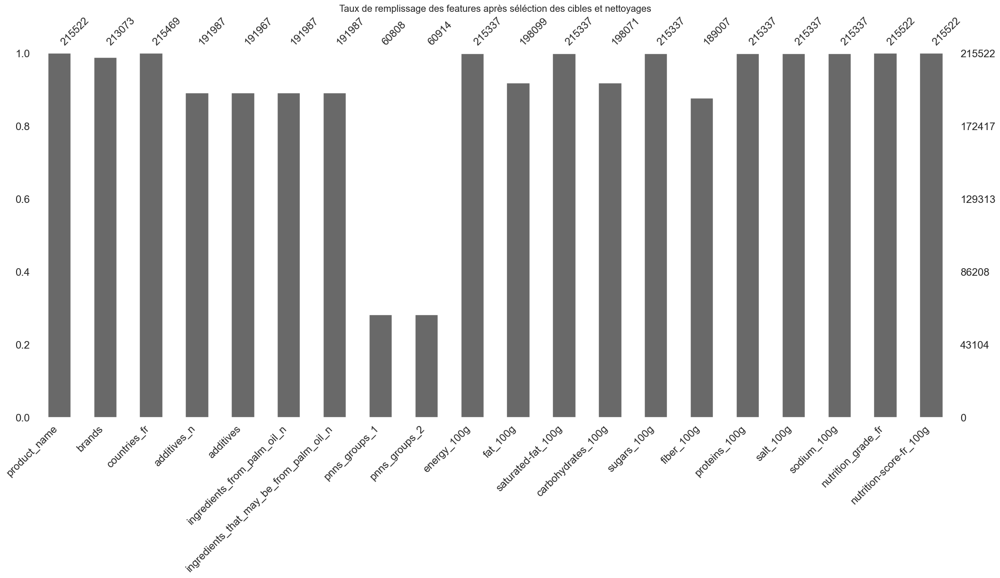

In [233]:
plt.title("Taux de remplissage des features après séléction des cibles et nettoyages")
msno.bar(data)

Nous avons constaté la répartition des NaN post-filtrage.

---

Comptage des NaN par colonne

In [234]:
data.isnull().sum()

product_name                                    0
brands                                       2449
countries_fr                                   53
additives_n                                 23535
additives                                   23555
ingredients_from_palm_oil_n                 23535
ingredients_that_may_be_from_palm_oil_n     23535
pnns_groups_1                              154714
pnns_groups_2                              154608
energy_100g                                   185
fat_100g                                    17423
saturated-fat_100g                            185
carbohydrates_100g                          17451
sugars_100g                                   185
fiber_100g                                  26515
proteins_100g                                 185
salt_100g                                     185
sodium_100g                                   185
nutrition_grade_fr                              0
nutrition-score-fr_100g                         0


Nous avons listé les colonnes encore partiellement vides et leur nombre de NaN.

---

## 5. Identification et traitement des valeurs aberrantes

Première visualisation des différentes valeurs

#### Visualisation initiale des valeurs numériques :

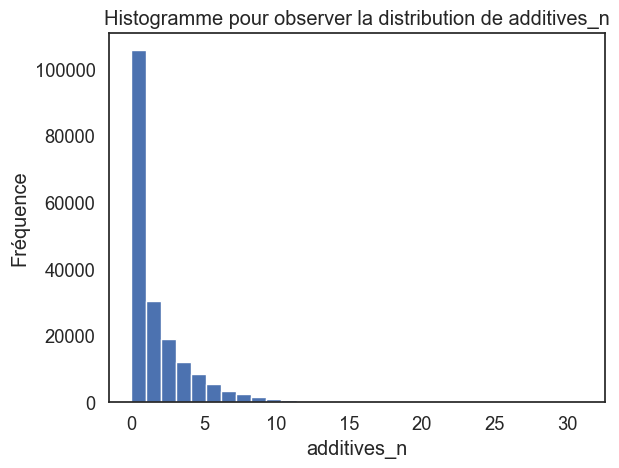

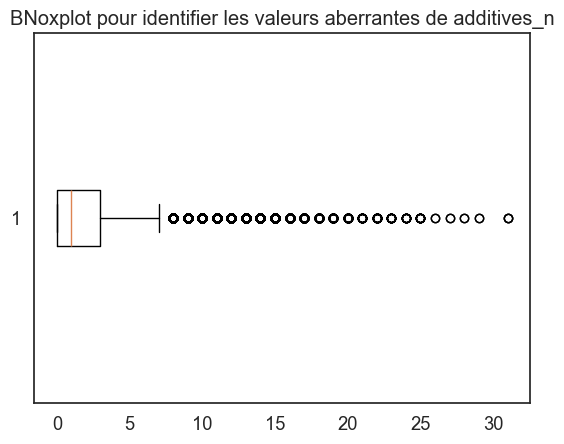

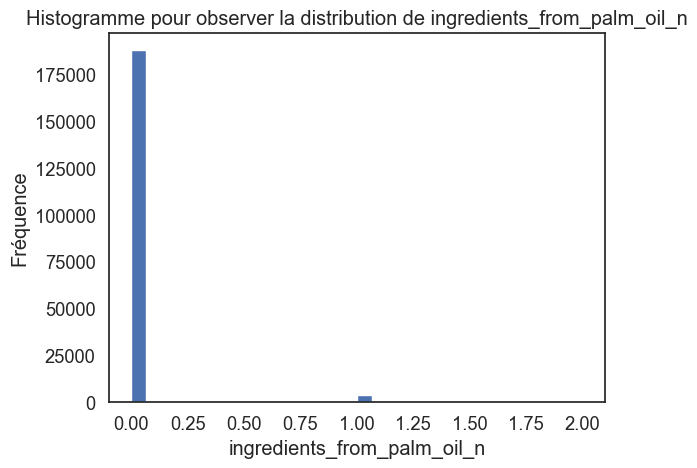

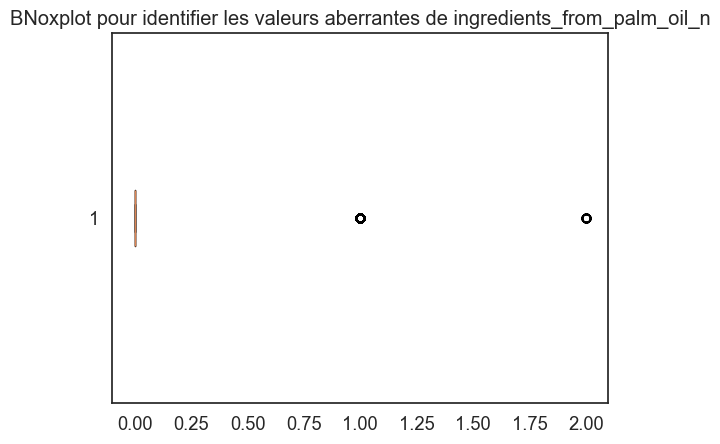

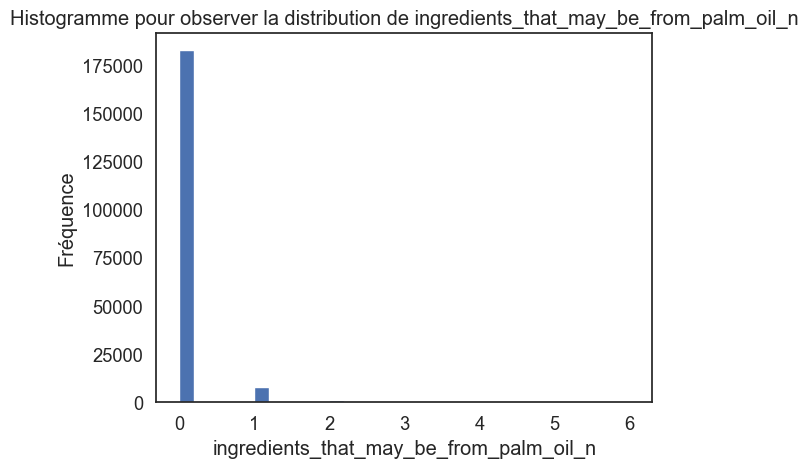

...

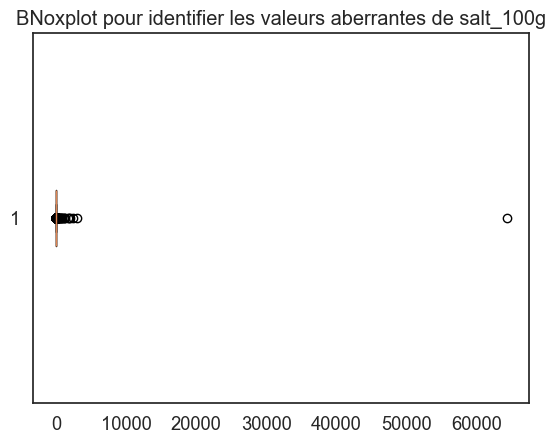

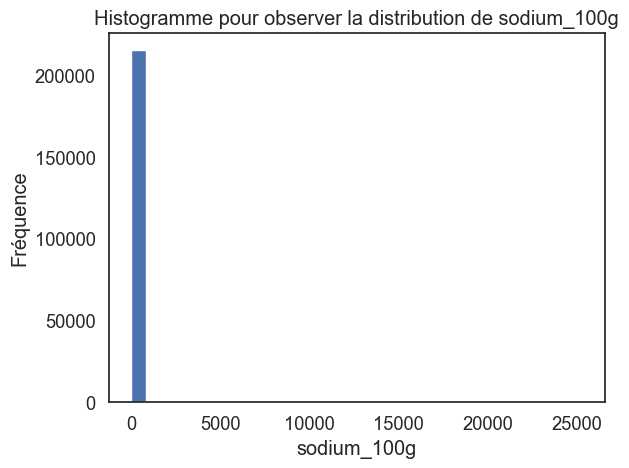

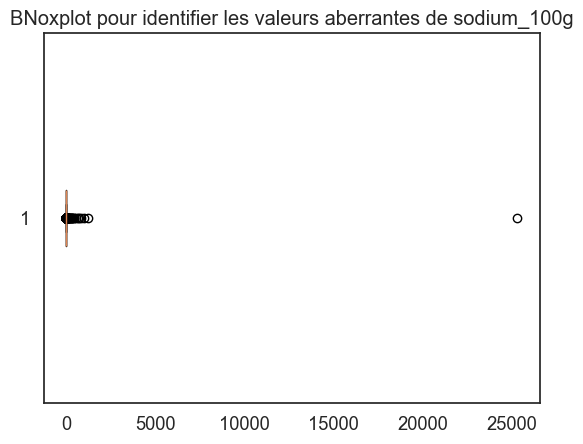

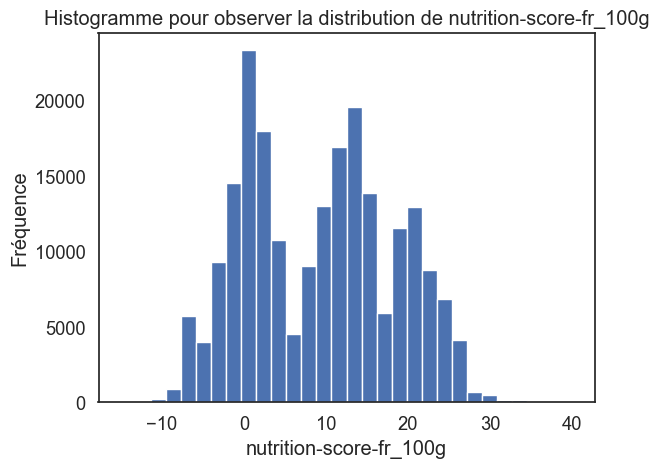

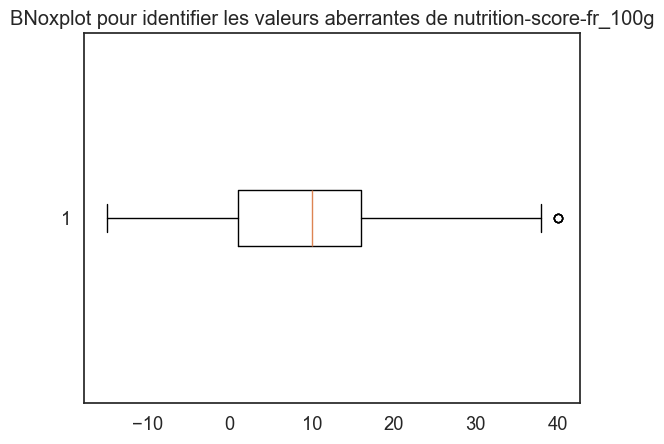

In [235]:
num_cols = data.select_dtypes(include=[np.number]).columns
for col in num_cols:
    # Histogramme
    fig, ax = plt.subplots()
    ax.hist(data[col].dropna(), bins=30)
    ax.set_title(f'Histogramme pour observer la distribution de {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Fréquence')
    plt.show()
    
    # Boxplot
    fig, ax = plt.subplots()
    ax.boxplot(data[col].dropna(), vert=False)
    ax.set_title(f'BNoxplot pour identifier les valeurs aberrantes de {col}')
    plt.show()


Nous avons observé les distributions et repéré les outliers visuellement.

---

#### Visualisation initiale des valeurs non numériques :

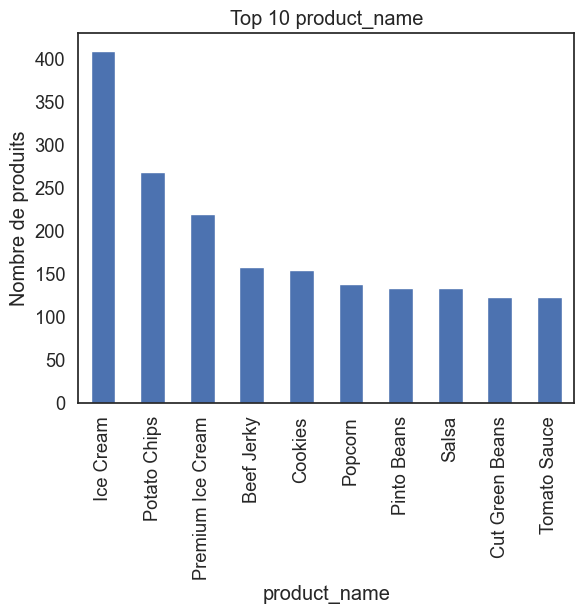

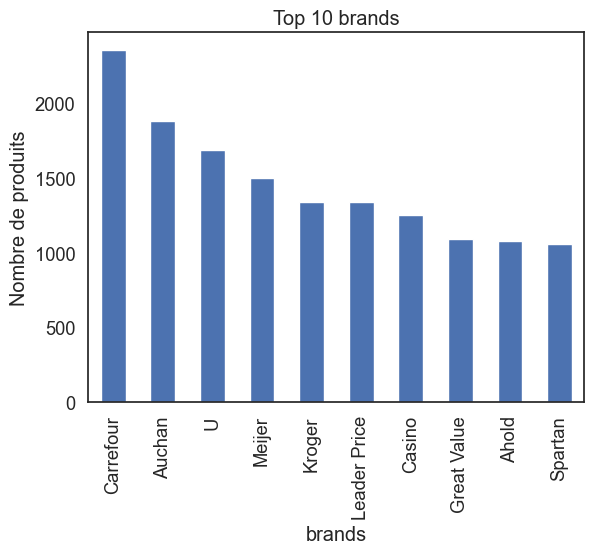

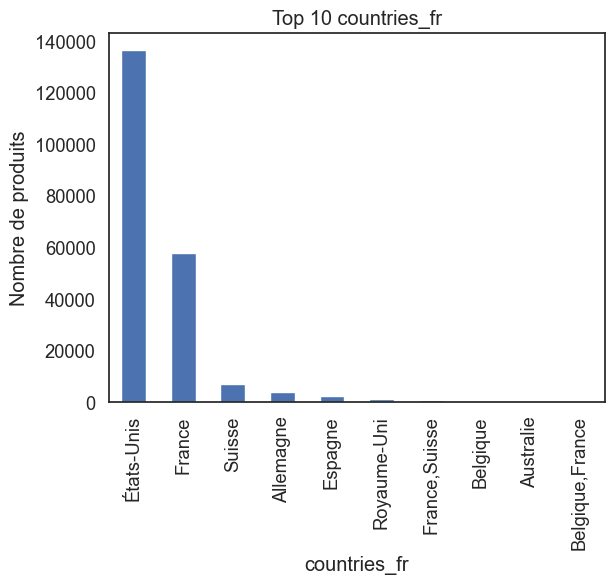

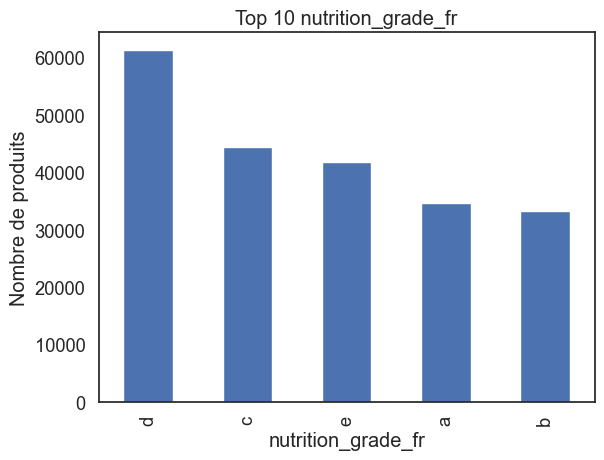

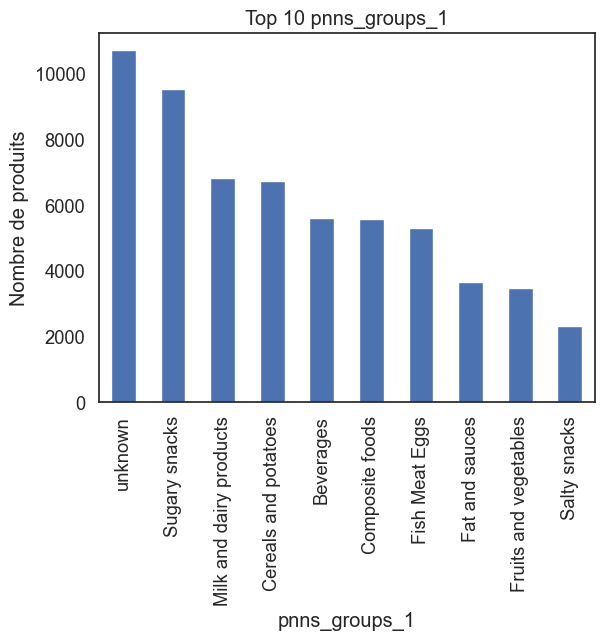

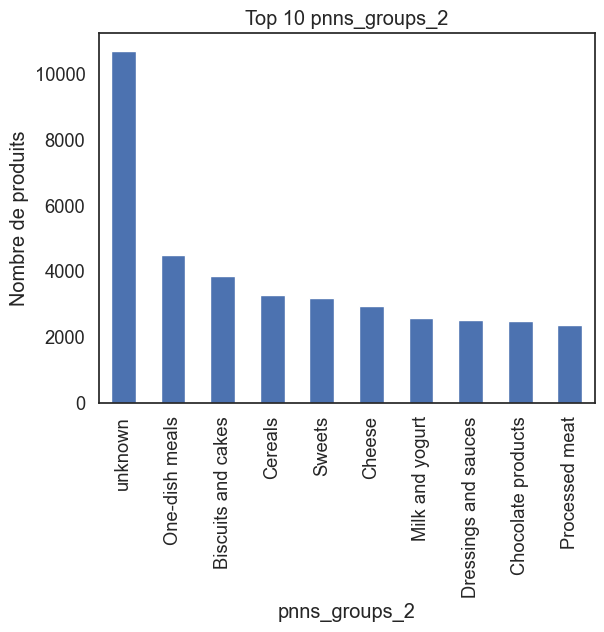

In [236]:
cat_cols = [
    "product_name", "brands", "countries_fr",
    "nutrition_grade_fr", "pnns_groups_1", "pnns_groups_2"
]
for col in cat_cols:
    counts = data[col].value_counts().nlargest(10)
    fig, ax = plt.subplots()
    counts.plot(kind='bar', ax=ax)
    ax.set_title(f'Top 10 {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Nombre de produits')
    plt.show()


Nous avons visualisé les catégories les plus fréquentes pour chaque champ. (sous forme de Top 10)

---

#### Calcul de l’IQR et détermination des bornes :

In [237]:
df_iqr = data.copy()

# IQR 
def get_iqr_summary(df):
    summary = []
    for col in df.select_dtypes(include=[np.number]).columns:
        # IQR
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        low = Q1 - 1.5 * IQR
        high = Q3 + 1.5 * IQR
        
        # Extraction des outliers et comptage
        outliers = df[(df[col] < low) | (df[col] > high)][col]
        
        summary.append({
            'Colonne':   col,
            'Q1':        Q1,
            'Q3':        Q3,
            'IQR':       IQR,
            'borne basse': low,
            'borne haute': high,
            'nb_outliers': outliers.shape[0]
        })
        
    return pd.DataFrame(summary)

# Calcul et affichage
iqr_summary = get_iqr_summary(df_iqr)
display(iqr_summary)



,Colonne,Q1,Q3,IQR,borne basse,borne haute,nb_outliers
0,additives_n,0.00000,3.00000,3.00000,-4.500000,7.500000,7858
1,ingredients_from_palm_oil_n,0.00000,0.00000,0.00000,0.000000,0.000000,4028
2,ingredients_that_may_be_from_palm_oil_n,0.00000,0.00000,0.00000,0.000000,0.000000,9316
3,energy_100g,453.00000,1715.00000,1262.00000,-1440.000000,3608.000000,700
4,fat_100g,0.88000,21.43000,20.55000,-29.945000,52.255000,5221
5,saturated-fat_100g,0.00000,7.14000,7.14000,-10.710000,17.850000,15718
6,carbohydrates_100g,7.05000,59.09000,52.04000,-71.010000,137.150000,3
7,sugars_100g,1.30000,23.08000,21.78000,-31.370000,55.750000,12478
8,fiber_100g,0.00000,3.60000,3.60000,-5.400000,9.000000,13021
9,proteins_100g,1.90000,10.71000,8.81000,-11.315000,23.925000,11172


Nous avons calculé l’IQR et recensé le nombre d’outliers par variable.

#### Visualisation selon l'IQR 

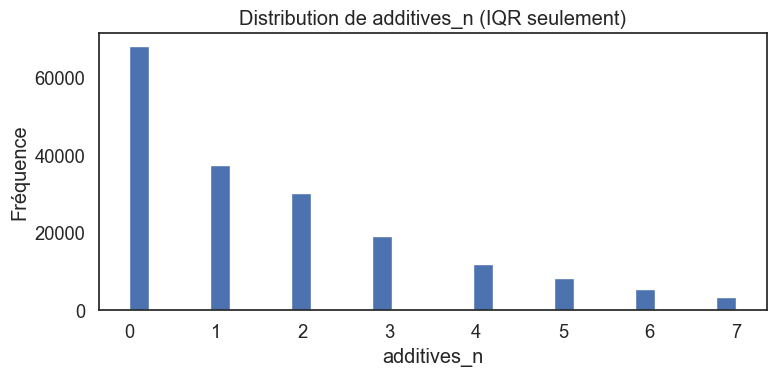

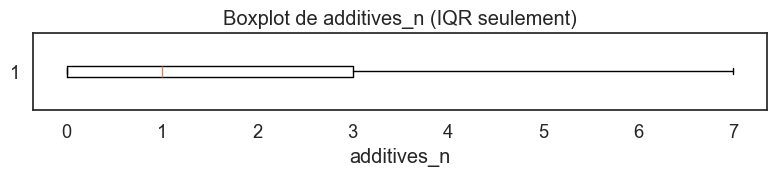

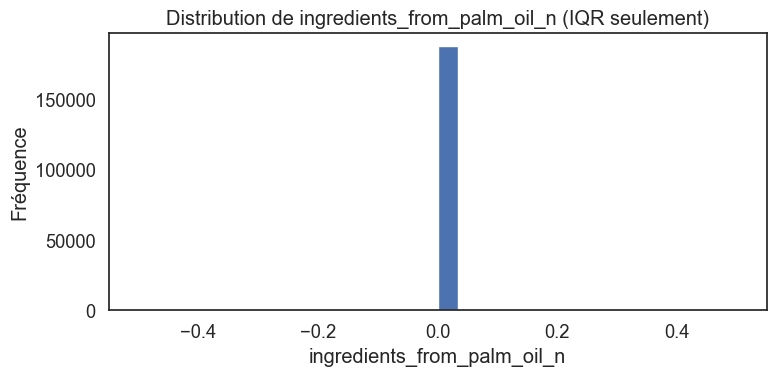

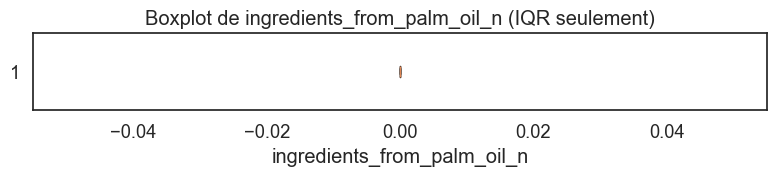

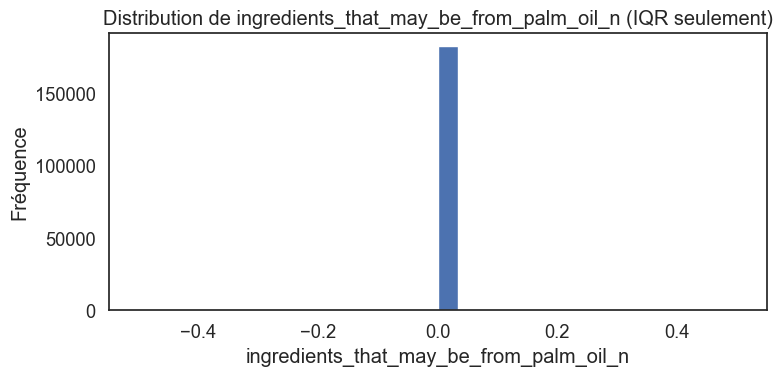

...

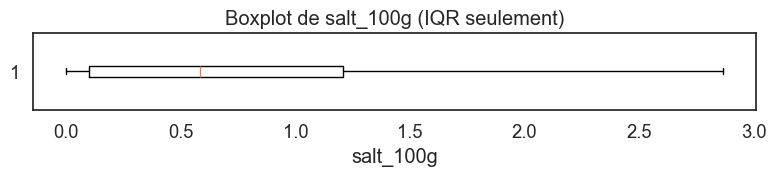

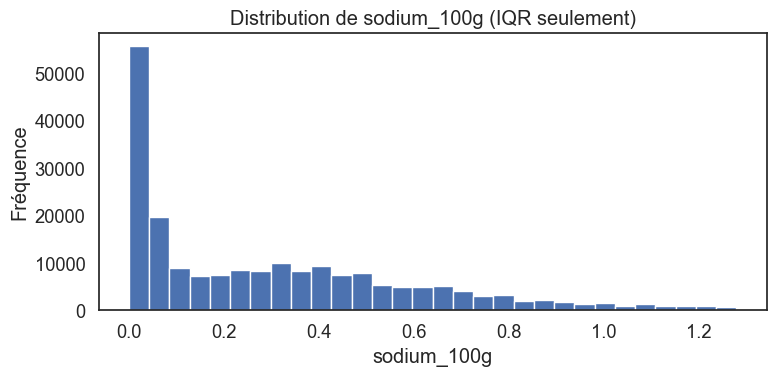

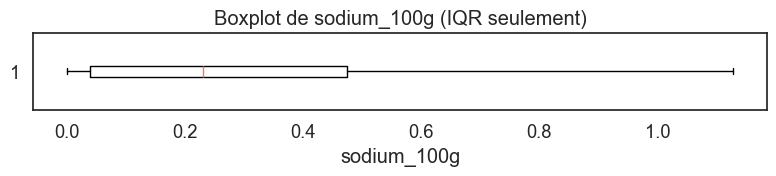

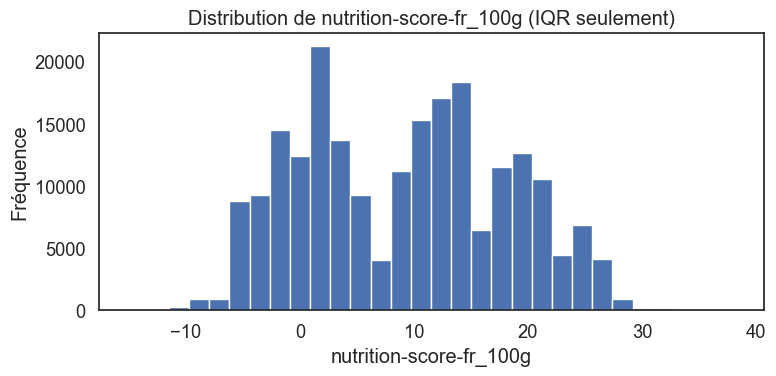

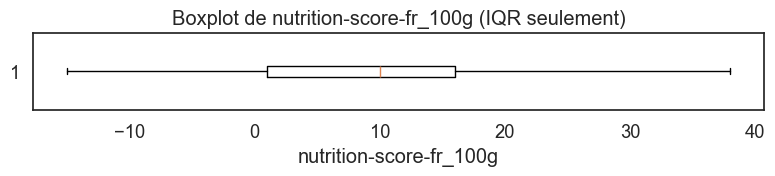

In [238]:
df = data

for col in df.select_dtypes(include=[np.number]).columns:
    serie = df[col].dropna()

    Q1, Q3 = serie.quantile([0.25, 0.75])
    IQR       = Q3 - Q1
    low, high = Q1 - 1.5 * IQR, Q3 + 1.5 * IQR

    # Filtre pour visu selon l'IQR
    serie_iqr = serie[(serie >= low) & (serie <= high)]

    # Histogramme
    plt.figure(figsize=(8, 4))
    plt.hist(serie_iqr, bins=30)
    plt.title(f'Distribution de {col} (IQR seulement)')
    plt.xlabel(col)
    plt.ylabel('Fréquence')
    plt.tight_layout()
    plt.show()

    # Boxplot
    plt.figure(figsize=(8, 2))
    plt.boxplot(serie_iqr, vert=False, showfliers=False)
    plt.title(f'Boxplot de {col} (IQR seulement)')
    plt.xlabel(col)
    plt.tight_layout()
    plt.show()


Nous avons visualisé chaque variable sans les outliers.

---

#### Définition des bornes métiers et traitement des outliers :

### Processus d'identification et traitement des valeurs aberrantes

In [239]:
# Stratégie métier pour chaque variable
custom_bounds = {
    "energy_100g": (0, 3800),
    **{c: (0, 100) for c in data.columns if c.endswith("_100g") and c != "energy_100g"},
    "additives_n": (0, 30),
    "ingredients_from_palm_oil_n": (0, 1),
    "ingredients_that_may_be_from_palm_oil_n": (0, 1),
    "nutrition-score-fr_100g": (-15, 40),
}

# Remplace les outliers par NaN
def treat_outliers(df, bounds, method='nan'):
    df2 = df.copy()
    for col, (low, high) in bounds.items():
        if col in df2.columns:
            if method == 'cap':
                df2[col] = np.where(df2[col] < low, low,
                                    np.where(df2[col] > high, high, df2[col]))
            else:
                mask = (df2[col] < low) | (df2[col] > high)
                df2.loc[mask, col] = np.nan
    return df2

# Application sur le dataset "data" (nom d'origine "datacsv")
data = treat_outliers(data, custom_bounds, method='nan')



Nous avons remplacé les valeurs hors bornes métiers par NaN.

#### Vérification des valeurs après traitement des outliers :

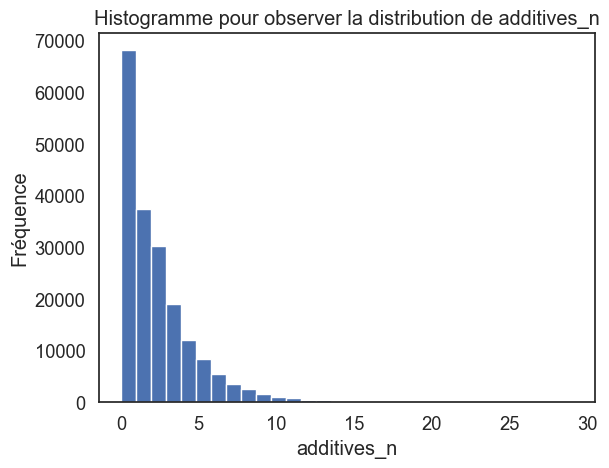

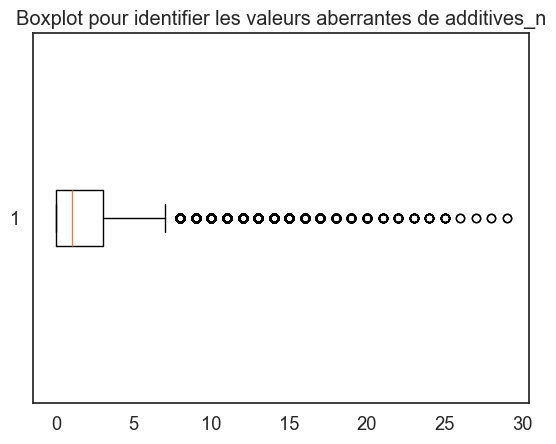

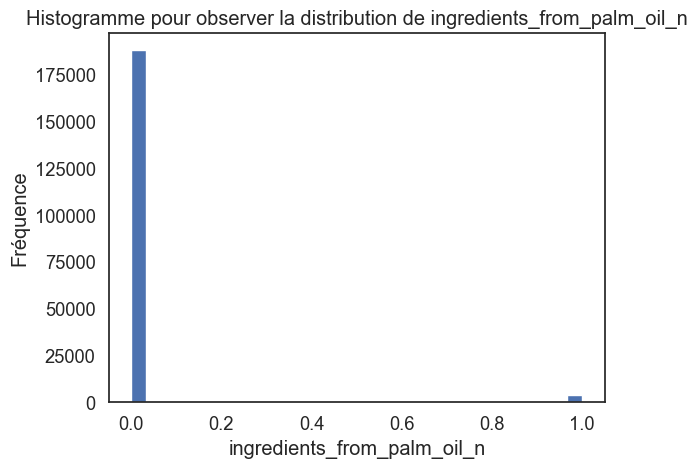

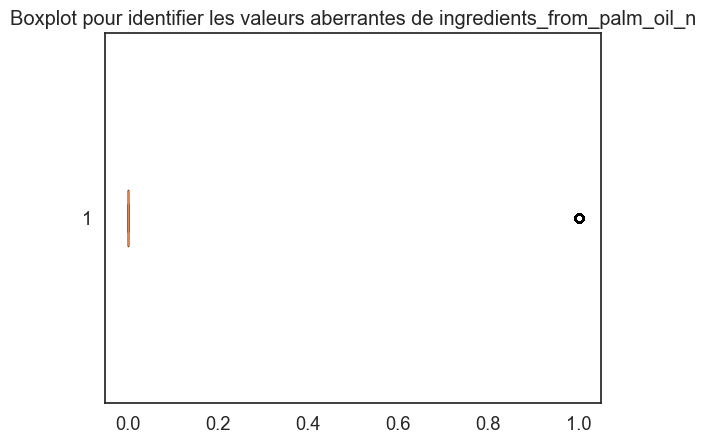

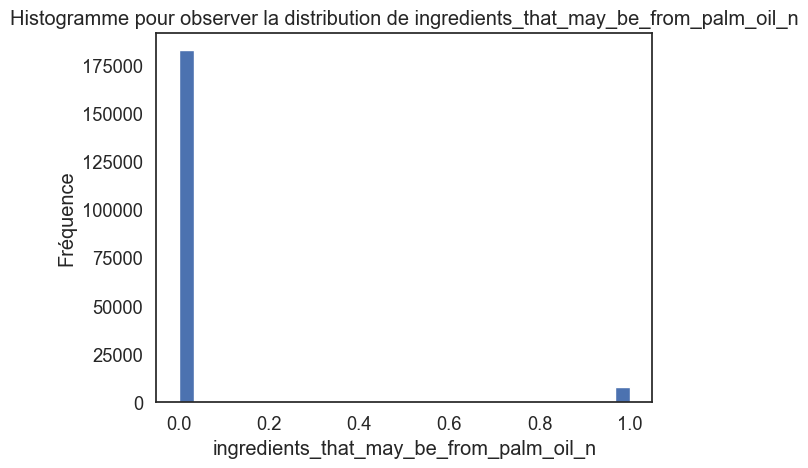

...

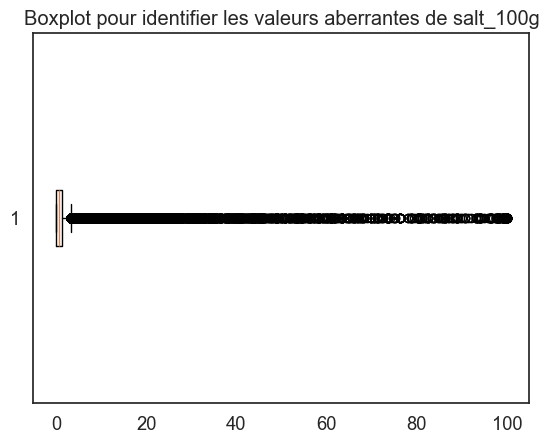

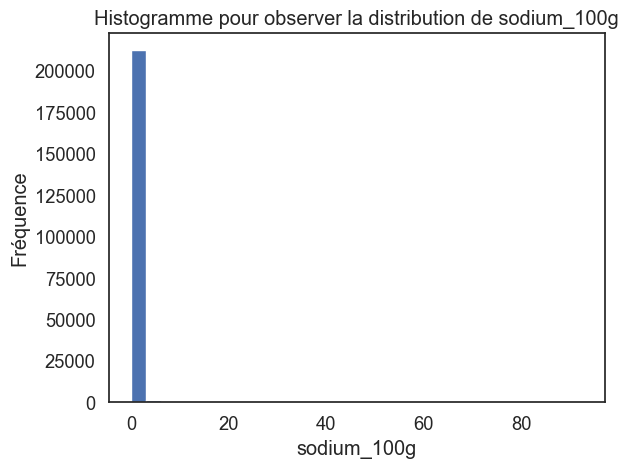

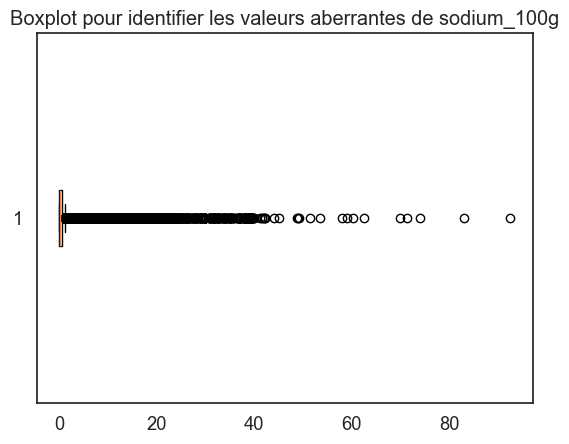

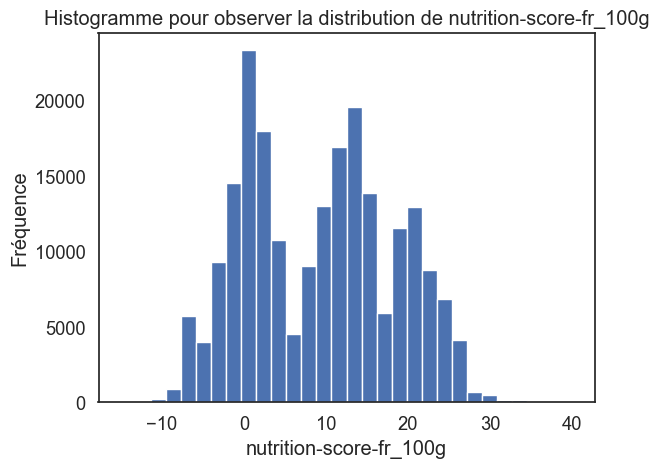

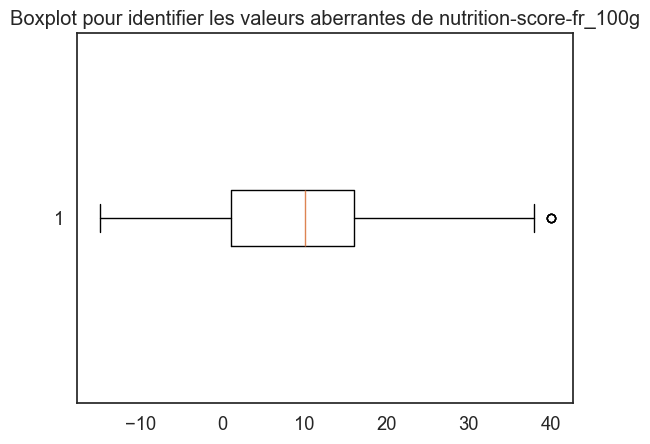

In [240]:
num_cols = data.select_dtypes(include=[np.number]).columns
for col in num_cols:
    # Histogramme
    fig, ax = plt.subplots()
    ax.hist(data[col].dropna(), bins=30)
    ax.set_title(f'Histogramme pour observer la distribution de {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Fréquence')
    plt.show()
    
    # Boxplot
    fig, ax = plt.subplots()
    ax.boxplot(data[col].dropna(), vert=False)
    ax.set_title(f'Boxplot pour identifier les valeurs aberrantes de {col}')
    plt.show()


Nous avons contrôlé visuellement la disparition des outliers.

---

#### Comparaison entre dataset d’origine et dataset après traitement

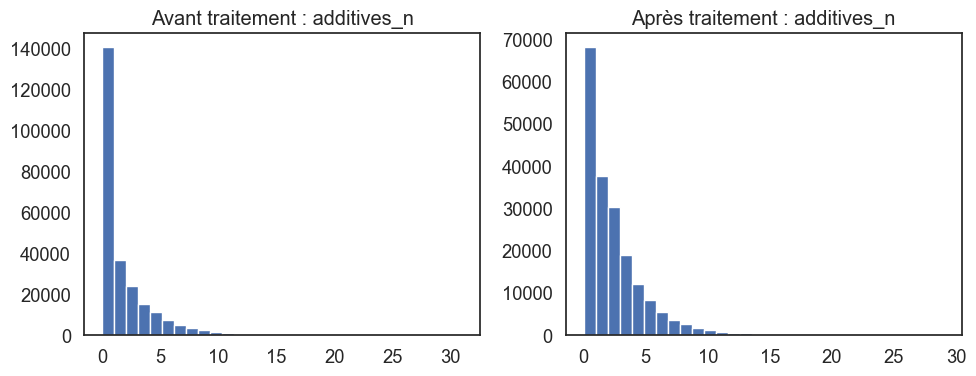

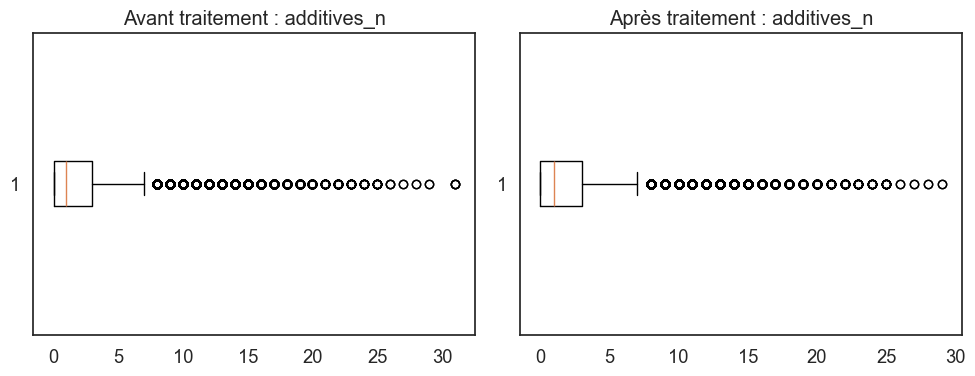

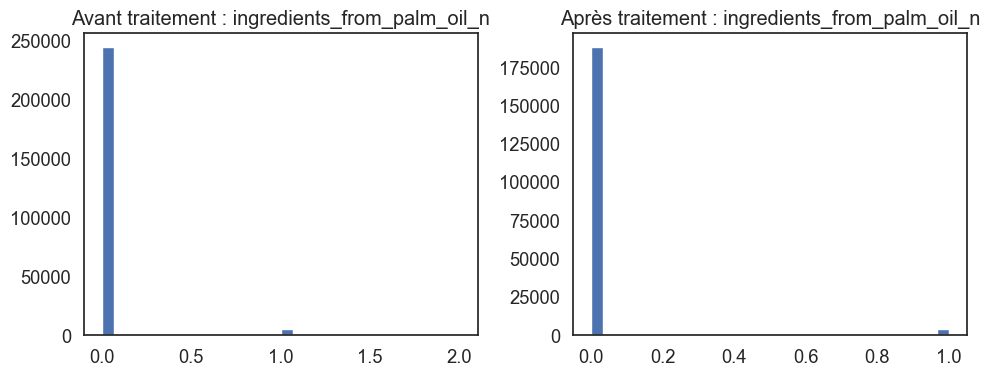

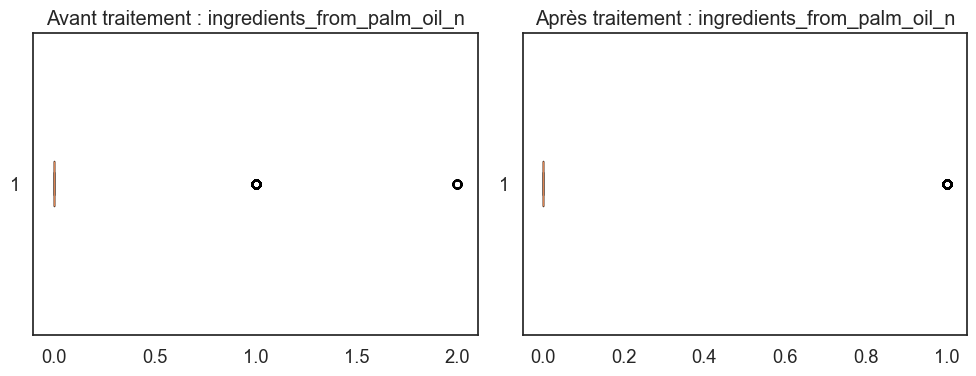

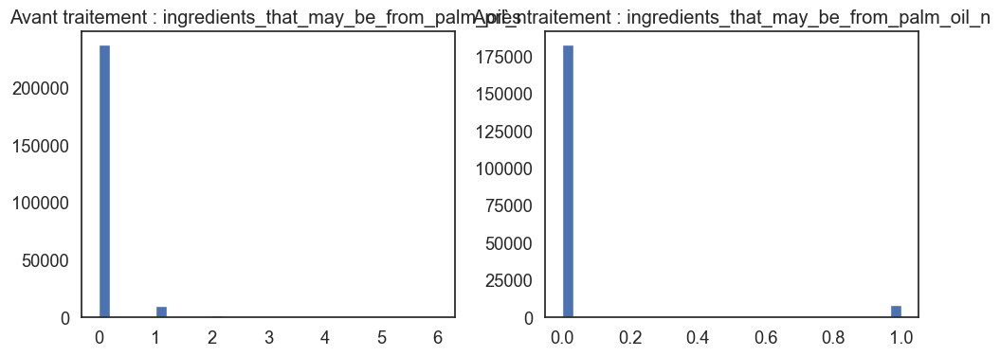

...

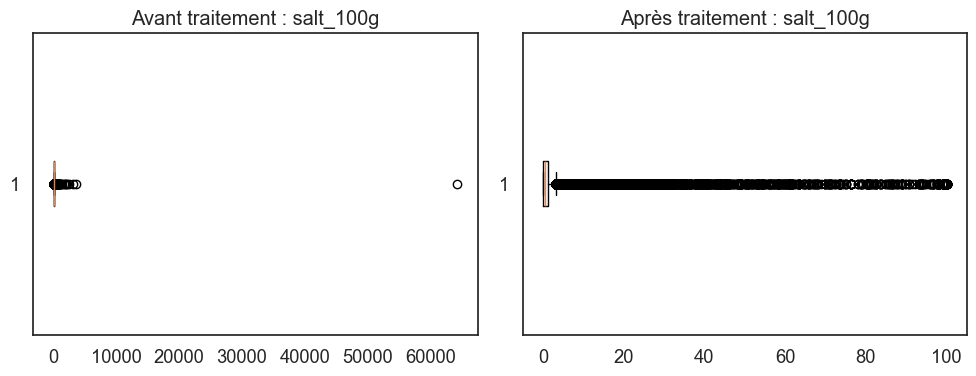

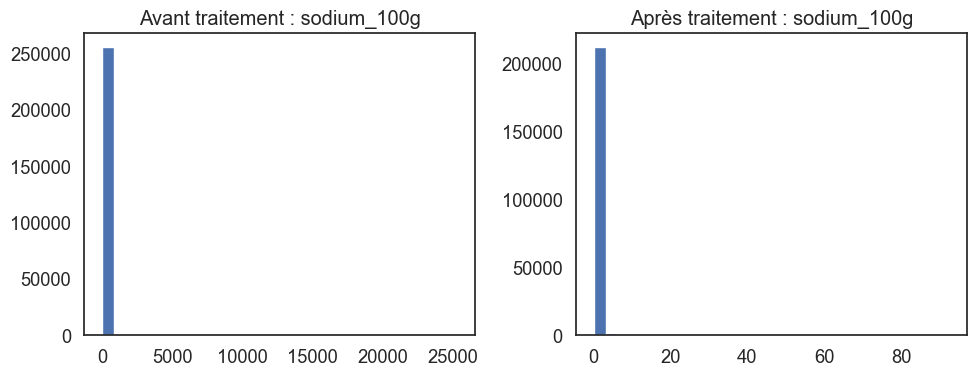

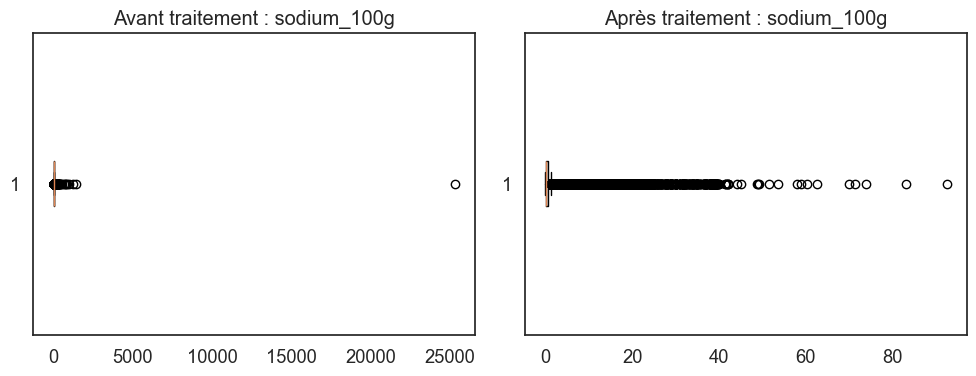

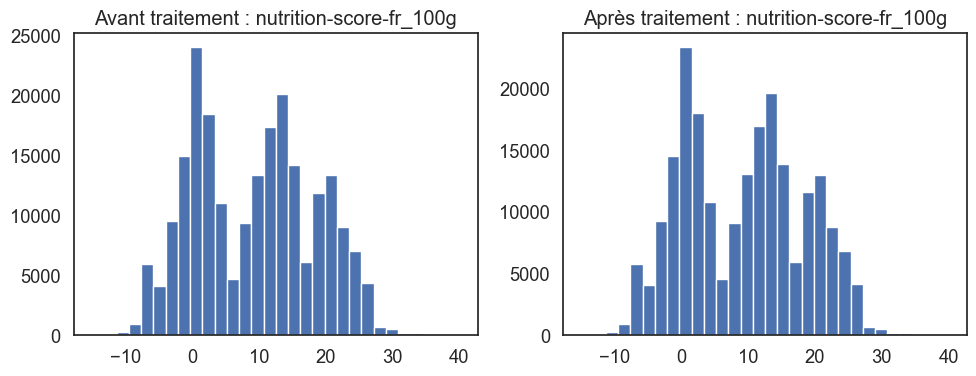

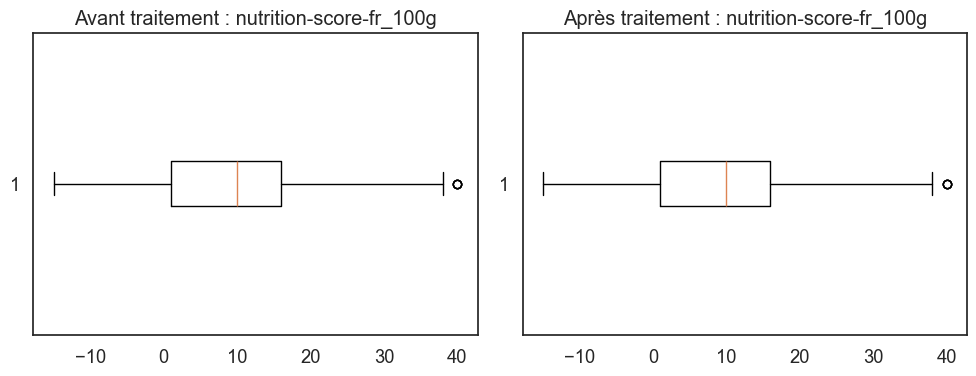

In [241]:
for col in num_cols:
    # Histogrammes
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    ax[0].hist(datacsv[col].dropna(), bins=30)
    ax[0].set_title(f'Avant traitement : {col}')
    ax[1].hist(data[col].dropna(), bins=30)
    ax[1].set_title(f'Après traitement : {col}')
    plt.tight_layout()
    plt.show()

    # Boxplots
    fig, ax = plt.subplots(1, 2, figsize=(10, 4))
    ax[0].boxplot(datacsv[col].dropna(), vert=False)
    ax[0].set_title(f'Avant traitement : {col}')
    ax[1].boxplot(data[col].dropna(), vert=False)
    ax[1].set_title(f'Après traitement : {col}')
    plt.tight_layout()
    plt.show()

Nous avons comparé visuellement avant/après traitement pour chaque variable.

---

## 6. Identification et traitement des valeurs manquantes

Rappel des valeurs manquantes :

<Axes: title={'center': 'Taux de remplissage des features'}>

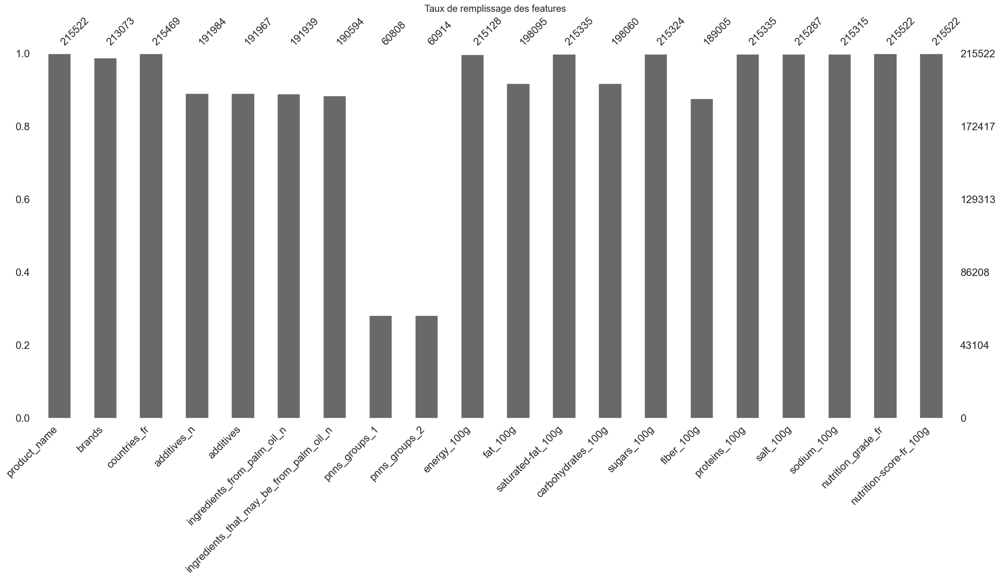

In [242]:
plt.title("Taux de remplissage des features")
msno.bar(data)

Nous avons observé le pourcentage de NaN restant.

Bilan initial des NaN :

In [243]:
print("NaN initiaux :")
print(data.isnull().sum(), "\n")

NaN initiaux :
product_name                                    0
brands                                       2449
countries_fr                                   53
additives_n                                 23538
additives                                   23555
ingredients_from_palm_oil_n                 23583
ingredients_that_may_be_from_palm_oil_n     24928
pnns_groups_1                              154714
pnns_groups_2                              154608
energy_100g                                   394
fat_100g                                    17427
saturated-fat_100g                            187
carbohydrates_100g                          17462
sugars_100g                                   198
fiber_100g                                  26517
proteins_100g                                 187
salt_100g                                     235
sodium_100g                                   207
nutrition_grade_fr                              0
nutrition-score-fr_100g            

Nous avons listé le nombre de NaN par colonne après traitement des outliers.

---

Matrice de Corrélation Générale :

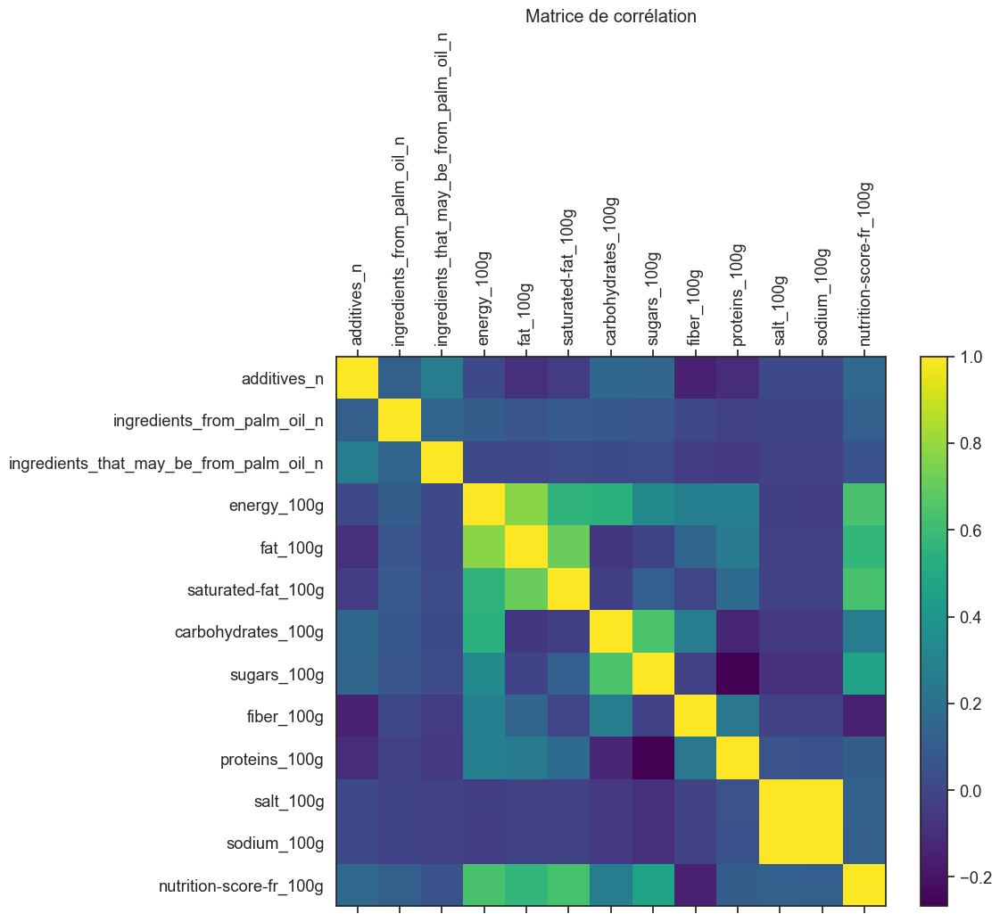

In [244]:
num_cols = data.select_dtypes(include=[np.number]).columns
corr = data[num_cols].corr()
fig, ax = plt.subplots(figsize=(10,8))
cax = ax.matshow(corr, cmap='viridis')
plt.xticks(range(len(num_cols)), num_cols, rotation=90)
plt.yticks(range(len(num_cols)), num_cols)
fig.colorbar(cax)
plt.title("Matrice de corrélation")
plt.show()  

Nous avons examiné les corrélations générales entre variables numériques.

Matrice de Corrélation avec annotation :

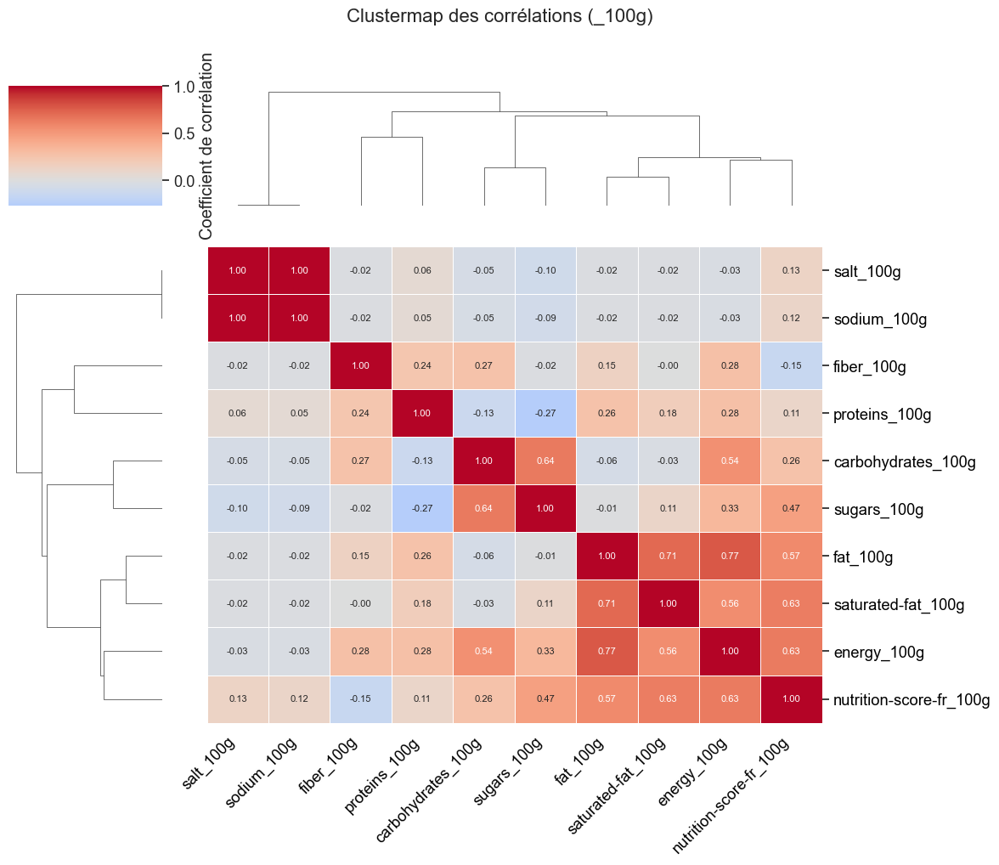

In [245]:
# Seulement _100g (numériques)
df = data.filter(regex='_100g$').select_dtypes(include='number')
corr = df.corr()

sns.set_theme(style='white')
sns.set_context("notebook", font_scale=1.2)

g = sns.clustermap(
    corr,
    method='average',
    cmap='coolwarm',
    center=0,
    linewidths=0.5,
    figsize=(12, 10),
    cbar_kws={'shrink': 0.5, 'label': 'Coefficient de corrélation'},
    annot=True,               
    fmt=".2f",                
    annot_kws={'size': 8}    
)

# Labels
plt.setp(g.ax_heatmap.get_xticklabels(),
         rotation=45, ha='right', color='black')
plt.setp(g.ax_heatmap.get_yticklabels(),
         rotation=0, color='black')

g.fig.suptitle("Clustermap des corrélations (_100g)", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


Nous avons mis en évidence les relations fortes entre les colonnes “_100g”.

---

Traitement des valeurs manquantes : (imputation)

In [246]:
import numpy as np
import pandas as pd
import warnings
from sklearn.impute import KNNImputer
from sklearn.exceptions import ConvergenceWarning
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Préparation "pour les 100g" hors nutri-score
vars_100g = [c for c in data.columns if c.endswith("_100g")]
vars_100g.remove("nutrition-score-fr_100g")

# imputation par la médiane globale
data_med = data.copy()
for col in vars_100g:
    med = data_med[col].median()
    data_med[col] = data_med[col].fillna(med)


# imputation multivariée par KNN
data_knn = data.copy()
knn = KNNImputer(n_neighbors=5)
# Juste les vars_100g
data_knn[vars_100g] = knn.fit_transform(data_knn[vars_100g])

# ITERATIVE IMPUTER (Régression multiple itérative)
min_vals = [custom_bounds[col][0] for col in vars_100g]
max_vals = [custom_bounds[col][1] for col in vars_100g]

warnings.filterwarnings("ignore", category=ConvergenceWarning)
data_iter = data.copy()
iter_imp = IterativeImputer(
    random_state=0,
    max_iter=20,
    tol=1e-4,
    min_value=min_vals,
    max_value=max_vals
)
data_iter[vars_100g] = iter_imp.fit_transform(data_iter[vars_100g])


Nous avons testé trois méthodes d’imputation (Imputation par la médiane, Knn imputer et Iterative Imputer) qui comblent tous les NaN des différentes colonnes.

---

Bilan des NaN avant et après imputation :

In [247]:
# Bilan initial des NaN
print("NaN initiaux pour les vars_100g :")
print(data[vars_100g].isnull().sum(), "\n")

# Bilan après médiane
print("NaN restants après médiane :")
print(data_med[vars_100g].isnull().sum(), "\n")
# Nous vérifions l'efficacité de l'imputation par la médiane.

# Bilan après KNN
print("NaN restants après KNN :")
print(data_knn[vars_100g].isnull().sum(), "\n")
# Nous vérifions l'efficacité de l'imputation par KNN.

# Bilan après IterativeImputer
print("NaN restants après l'IterativeImputer :")
print(data_iter[vars_100g].isnull().sum())

NaN initiaux pour les vars_100g :
energy_100g             394
fat_100g              17427
saturated-fat_100g      187
carbohydrates_100g    17462
sugars_100g             198
fiber_100g            26517
proteins_100g           187
salt_100g               235
sodium_100g             207
dtype: int64 

NaN restants après médiane :
energy_100g           0
fat_100g              0
saturated-fat_100g    0
carbohydrates_100g    0
sugars_100g           0
fiber_100g            0
proteins_100g         0
salt_100g             0
sodium_100g           0
dtype: int64 

NaN restants après KNN :
energy_100g           0
fat_100g              0
saturated-fat_100g    0
carbohydrates_100g    0
sugars_100g           0
fiber_100g            0
proteins_100g         0
salt_100g             0
sodium_100g           0
dtype: int64 

NaN restants après l'IterativeImputer :
energy_100g           0
fat_100g              0
saturated-fat_100g    0
carbohydrates_100g    0
sugars_100g           0
fiber_100g            0

Nous avons vérifié que toutes les valeurs manquantes ont été comblées pour chaque méthode.

---

#### Visualisation du taux de NaN après chaque méthode :

Bilan après médiane :

<Axes: >

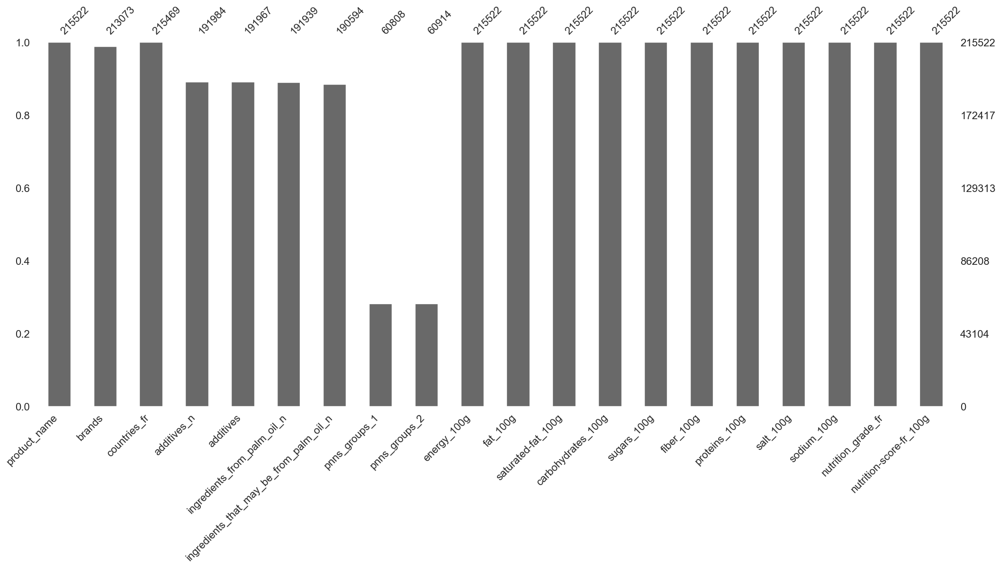

In [248]:
msno.bar(data_med)

Bilan après KNN :

<Axes: >

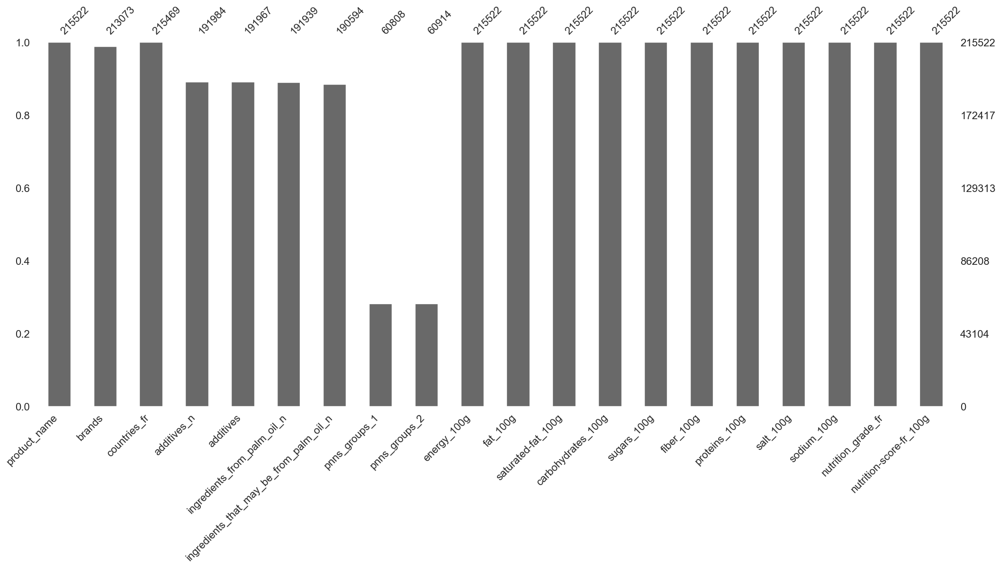

In [249]:
msno.bar(data_knn)

Bilan après IterativeImputer :

<Axes: >

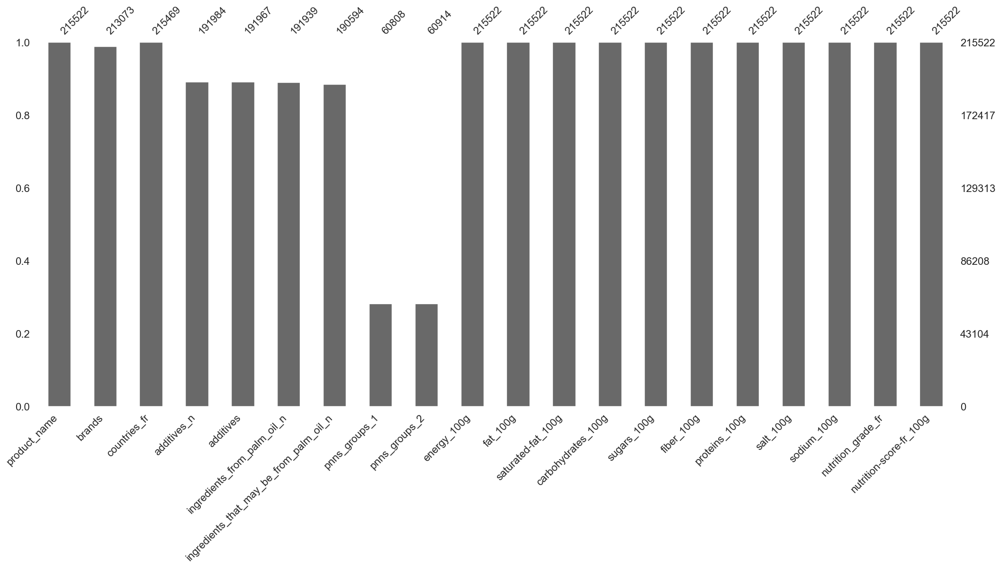

In [250]:
msno.bar(data_iter)

Nous avons visualisé la disparition des NaN dans chaque cas.

---

Comparaison statistiques avant/après imputation

In [251]:
import pandas as pd

# Describe pour chaque version
desc_orig = data[vars_100g].describe().T
desc_med  = data_med[vars_100g].describe().T
desc_knn  = data_knn[vars_100g].describe().T
desc_iter = data_iter[vars_100g].describe().T

# Ajout méthode
desc_orig['method'] = 'original'
desc_med ['method'] = 'median'
desc_knn ['method'] = 'knn'
desc_iter['method'] = 'iterative'

# Concaténation tout en un
full_desc = pd.concat([desc_orig, desc_med, desc_knn, desc_iter], axis=0)
full_desc = full_desc.reset_index().rename(columns={'index':'feature'})
full_desc = full_desc.set_index(['feature','method'])

# Affichage
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 8)
display(full_desc)


,,count,mean,std,min,25%,50%,75%,max
feature,method,,,,,,,,
energy_100g,original,215128.0,1174.838338,757.086159,0.0,452.00000,1191.00000,1711.000000,3776.0
fat_100g,original,198095.0,13.324550,16.030263,0.0,0.88000,7.14000,21.430000,100.0
saturated-fat_100g,original,215335.0,4.960127,7.553577,0.0,0.00000,1.79000,7.140000,100.0
carbohydrates_100g,original,198060.0,33.280471,28.298889,0.0,7.04000,24.24000,59.020000,100.0
sugars_100g,original,215324.0,14.993829,19.793753,0.0,1.30000,5.00000,23.080000,100.0
fiber_100g,original,189005.0,2.797551,4.470589,0.0,0.00000,1.50000,3.600000,100.0
proteins_100g,original,215335.0,7.771945,8.069335,0.0,1.90000,5.70000,10.710000,100.0
salt_100g,original,215287.0,1.242439,3.958742,0.0,0.10000,0.65024,1.361440,100.0
sodium_100g,original,215315.0,0.495873,1.674184,0.0,0.03937,0.25600,0.536000,92.5


Nous avons comparé les moyennes, médianes et étendues avant et après chaque imputation.

---

#### Histogrammes comparés pour chaque colonne :

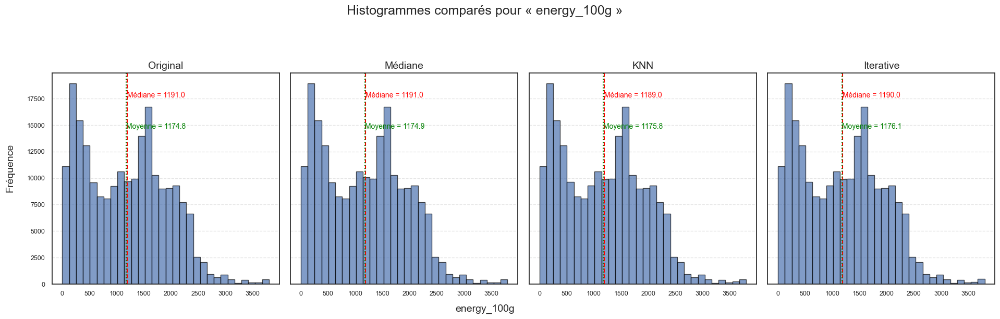

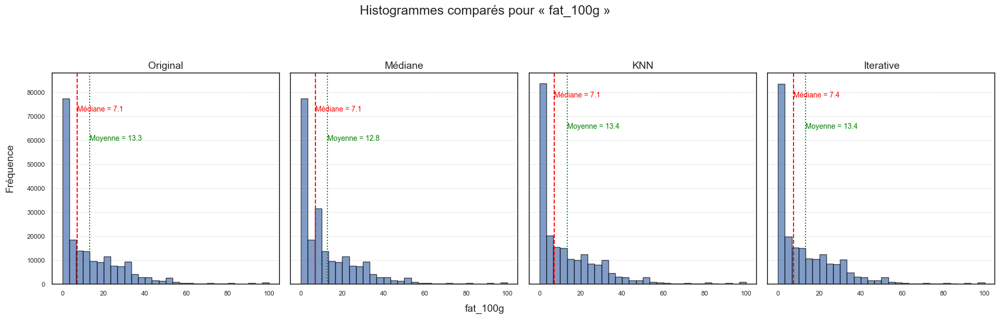

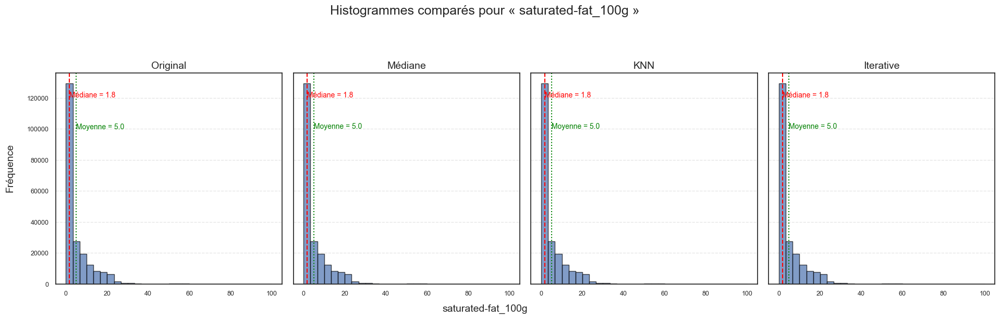

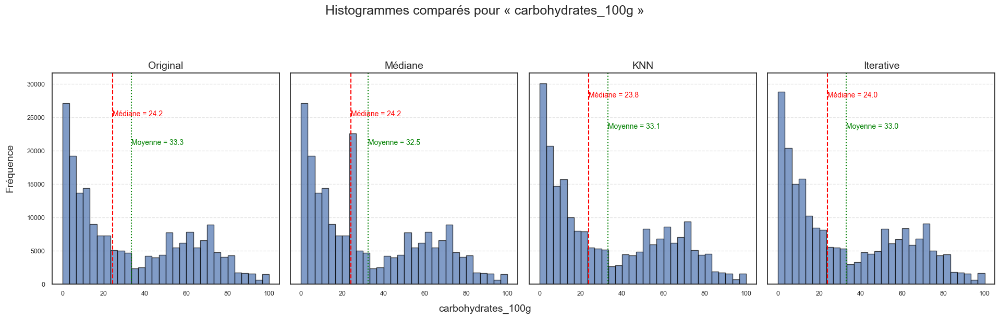

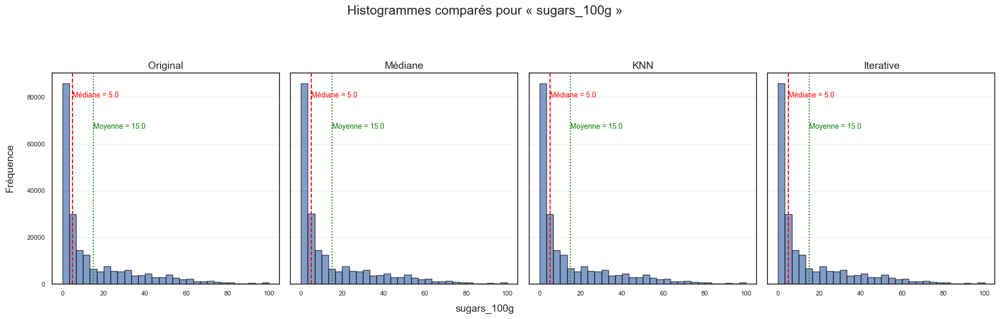

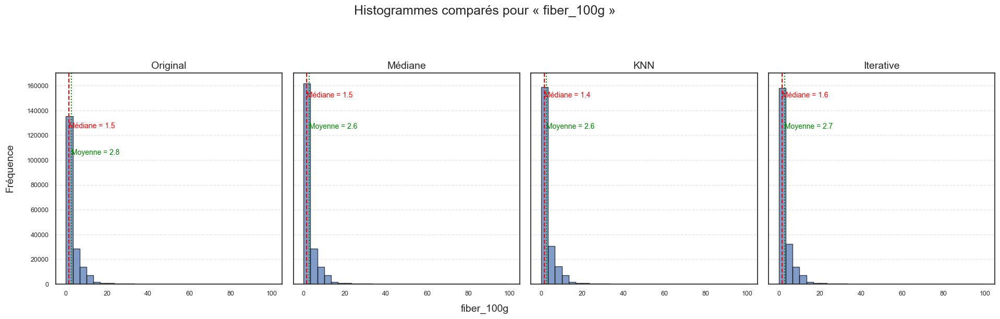

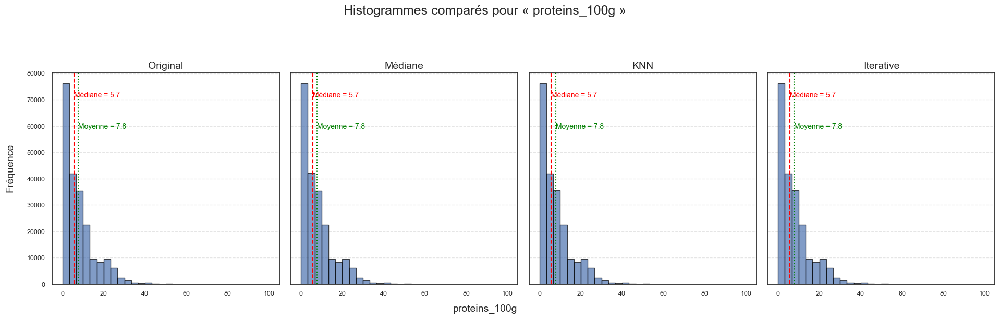

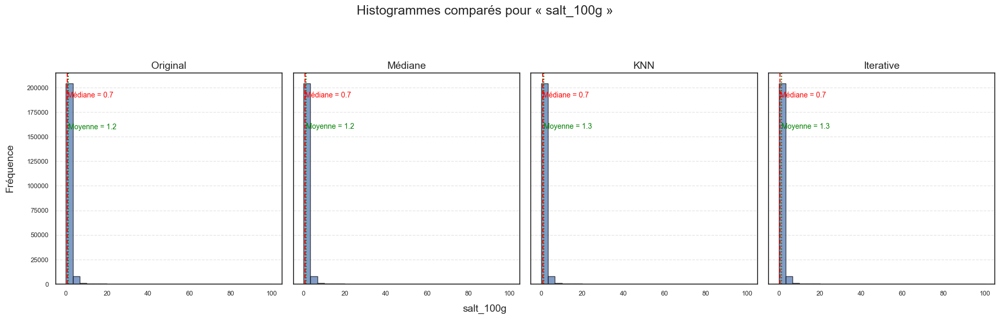

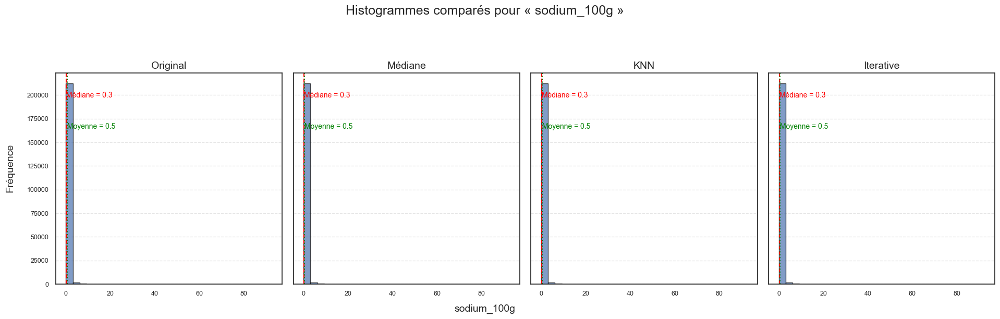

In [252]:
import matplotlib.pyplot as plt
import numpy as np

methods_data = {
    'Original':   data,
    'Médiane':    data_med,
    'KNN':        data_knn,
    'Iterative':  data_iter
}

n_bins = 30
for col in vars_100g:
    # Détermine l'étendue commune
    min_val = min(df[col].min() for df in methods_data.values())
    max_val = max(df[col].max() for df in methods_data.values())
    common_range = (min_val, max_val)

    fig, axes = plt.subplots(1, 4, figsize=(20, 6), sharey=True)
    fig.suptitle(f"Histogrammes comparés pour « {col} »", fontsize=18, y=1.02)

    for ax, (name, df_variant) in zip(axes, methods_data.items()):
        data_series = df_variant[col].dropna()
        counts, bins, patches = ax.hist(
            data_series,
            bins=n_bins,
            range=common_range,
            edgecolor='black',
            alpha=0.7
        )

        # Trace de la médiane
        med = data_series.median()
        ax.axvline(med, color='red', linestyle='--', linewidth=1.5)
        ax.text(
            med,
            ax.get_ylim()[1] * 0.9,
            f"Médiane = {med:.1f}",
            color='red',
            ha='left',
            va='center_baseline',
            fontsize=10
        )

        # Tracede la moyenne
        mean = data_series.mean()
        ax.axvline(mean, color='green', linestyle=':', linewidth=1.5)
        ax.text(
            mean,
            ax.get_ylim()[1] * 0.75,
            f"Moyenne = {mean:.1f}",
            color='green',
            ha='left',
            va='center_baseline',
            fontsize=10
        )

        
        ax.set_title(name, fontsize=14)
        ax.grid(axis='y', linestyle='--', alpha=0.5)

        # Unique labels sur l'axe
        ax.set_xlabel('')
        ax.set_ylabel('')
        ax.tick_params(axis='both', which='major', labelsize=9)

    # Unique labels sur l'axe 2
    fig.text(0.5, 0.04, col, ha='center', fontsize=14)
    fig.text(0.04, 0.5, 'Fréquence', va='center', rotation='vertical', fontsize=14)

    plt.tight_layout(rect=[0.05, 0.05, 1, 0.95])
    plt.show()


Nous avons comparé les distributions avant et après imputation pour chaque variable “_100g”. (Avec détails de la médiane et de la moyenne pour chaque méthode !)

---

#### Boxplots comparés pour chaque colonne :

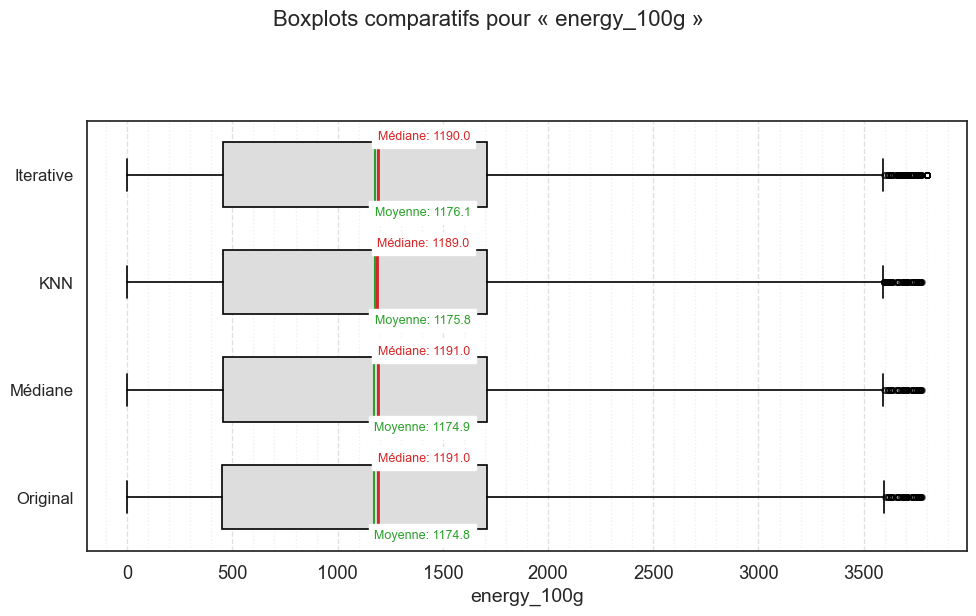

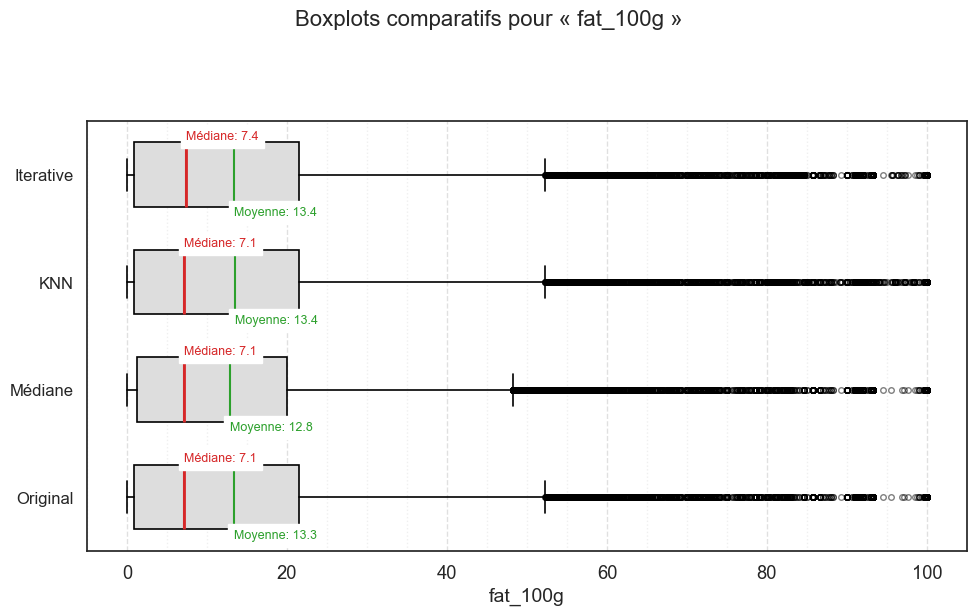

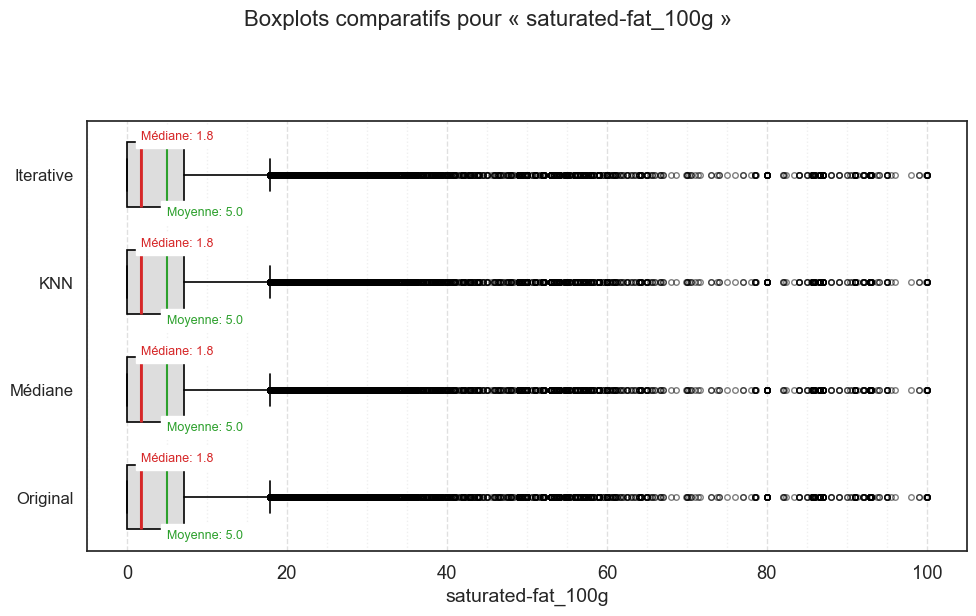

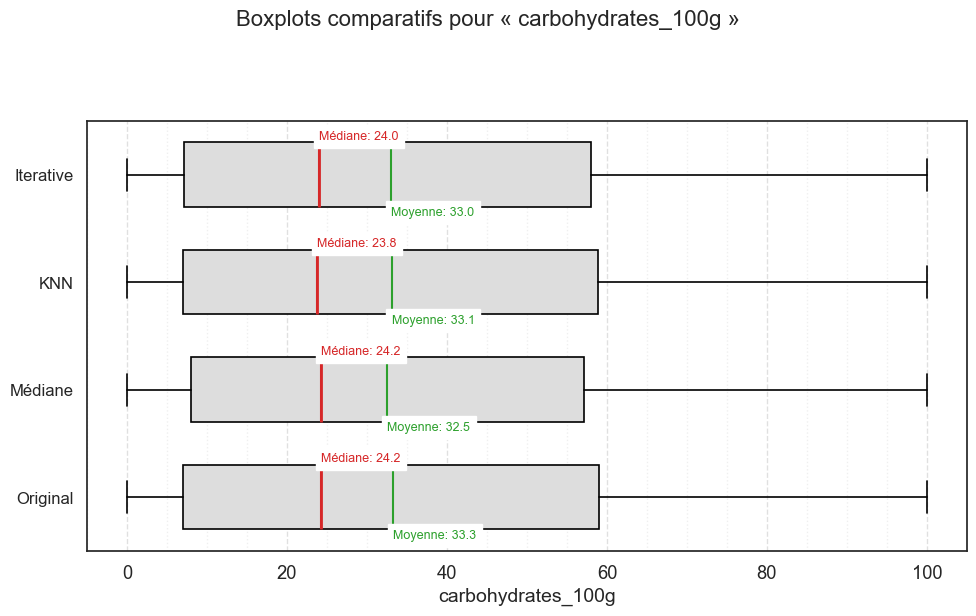

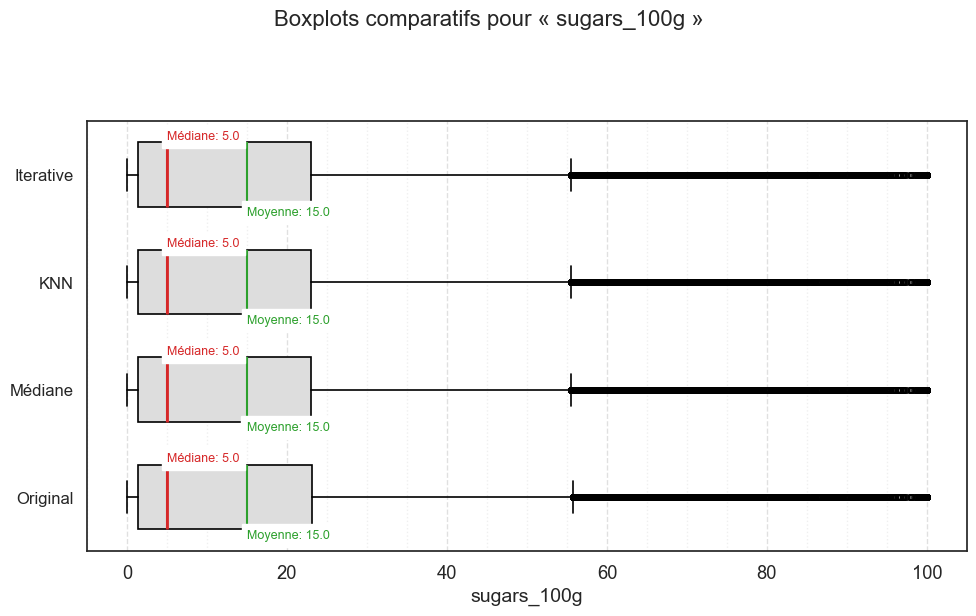

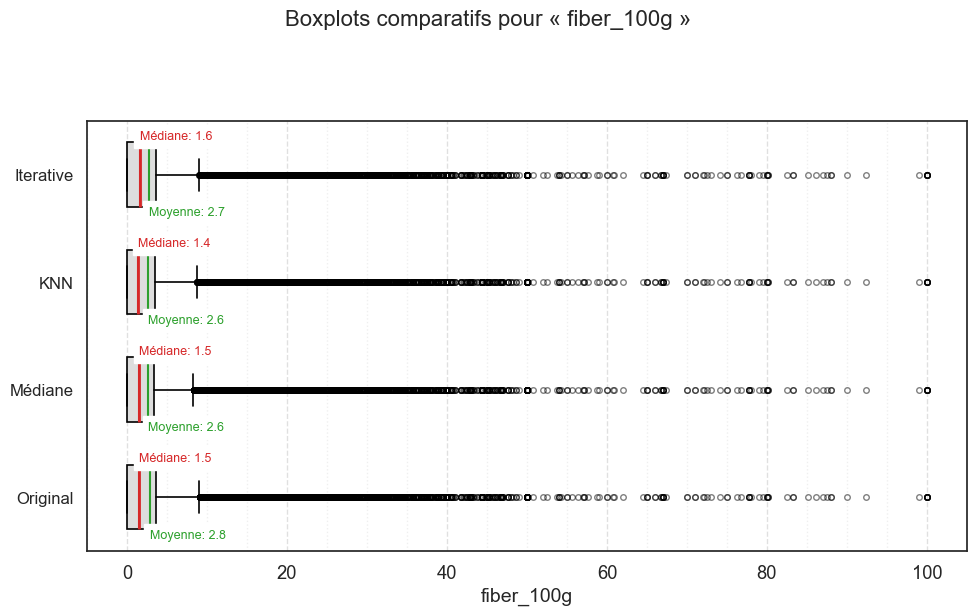

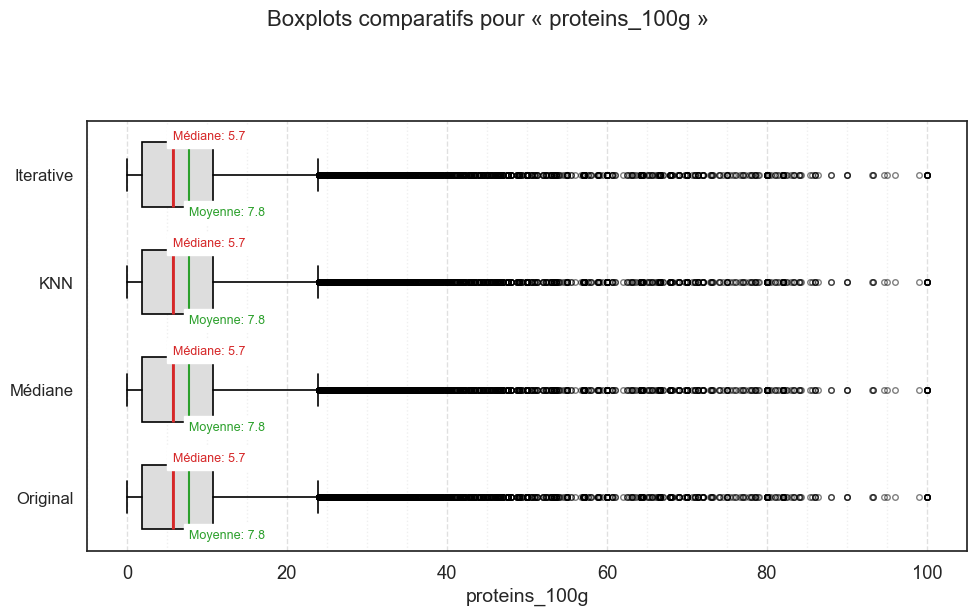

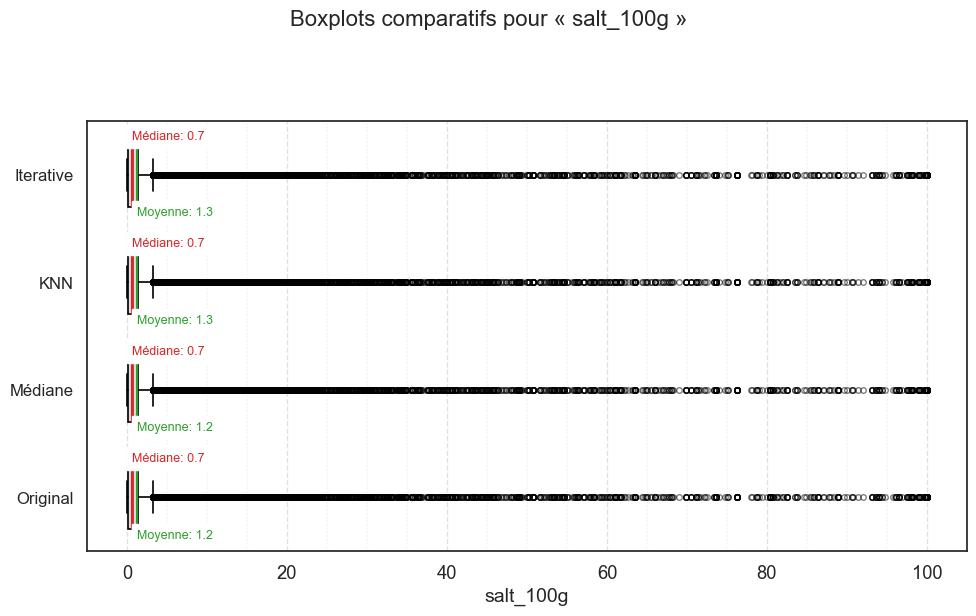

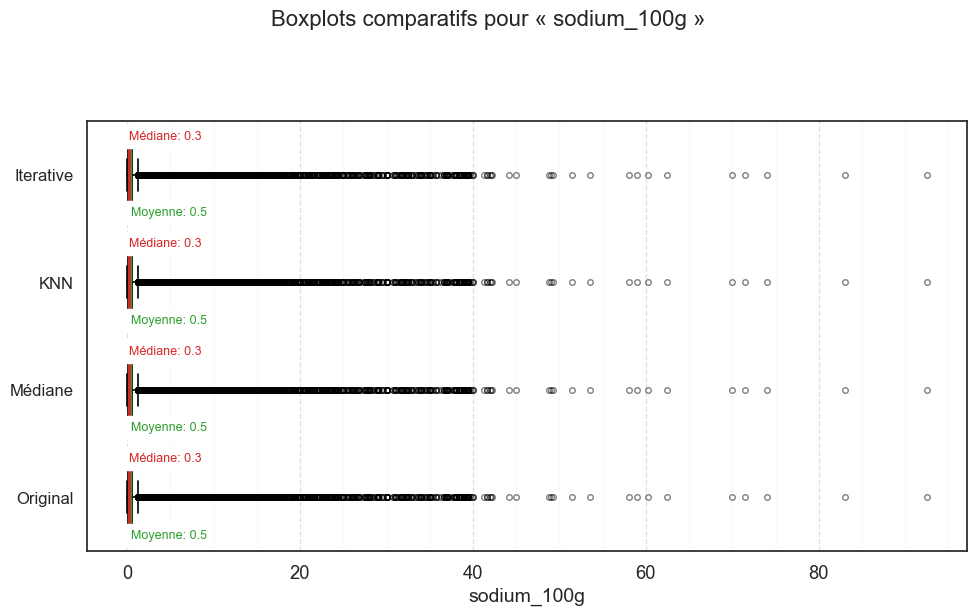

In [253]:
import matplotlib.pyplot as plt
import numpy as np

# Clones des DataFrames existants
methods_data = {
    'Original':   data,
    'Médiane':    data_med,
    'KNN':        data_knn,
    'Iterative':  data_iter
}

# Juste les variables "_100g" (hors nutri-score)
vars_100g = [c for c in data.columns if c.endswith("_100g")]
vars_100g.remove("nutrition-score-fr_100g")

# LEs 4 boxplots superposés
for col in vars_100g:
    fig, ax = plt.subplots(figsize=(10, 6))
    fig.suptitle(f"Boxplots comparatifs pour « {col} »", fontsize=16, y=1.03)

    # Quadrillage
    ax.minorticks_on()
    ax.grid(which='major', axis='x', linestyle='--', alpha=0.6)
    ax.grid(which='minor', axis='x', linestyle=':', alpha=0.3)

    # Positions verticales
    noms      = list(methods_data.keys())
    positions = np.arange(len(noms)) + 1

    for pos, name in zip(positions, noms):
        series = methods_data[name][col].dropna()

        # Boxplot horizontal
        ax.boxplot(
            series,
            vert=False,
            positions=[pos],
            widths=0.6,
            patch_artist=True,
            boxprops   ={'facecolor': '#dddddd', 'edgecolor': 'black', 'linewidth': 1.2},
            whiskerprops={'color': 'black',   'linewidth': 1.2},
            capprops   ={'color': 'black',   'linewidth': 1.2},
            medianprops={'color': '#d62728', 'linewidth': 2},
            showmeans  = False,   
            flierprops={'marker': 'o', 'markersize': 4, 'alpha': 0.5}
        )

        # Calcul  médiane & moyenne
        med  = series.median()
        mean = series.mean()

        # Traits verticaux médiane & moyenne
        ax.vlines(med,  pos-0.3, pos+0.3, color='#d62728', linestyle='-', linewidth=1.5)
        ax.vlines(mean, pos-0.3, pos+0.3, color='#2ca02c', linestyle='-', linewidth=1.5)

        # Étiquettes médiane & moyenne
        ax.text(
            med, pos+0.3,
            f"Médiane: {med:.1f}",
            ha='left', va='bottom',
            color='#d62728', fontsize=9,
            backgroundcolor='white'
        )
        ax.text(
            mean, pos-0.3,
            f"Moyenne: {mean:.1f}",
            ha='left', va='top',
            color='#2ca02c', fontsize=9,
            backgroundcolor='white'
        )

    ax.set_yticks(positions)
    ax.set_yticklabels(noms, fontsize=12)
    ax.set_xlabel(col, fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


Nous avons comparé la dispersion des données avant/après imputation avec des boxplots. (Avec détails de la médiane et de la moyenne pour chaque méthode !)

---

#### Densités comparées (zoom 1–99 %) pour chaque colonne “_100g” :

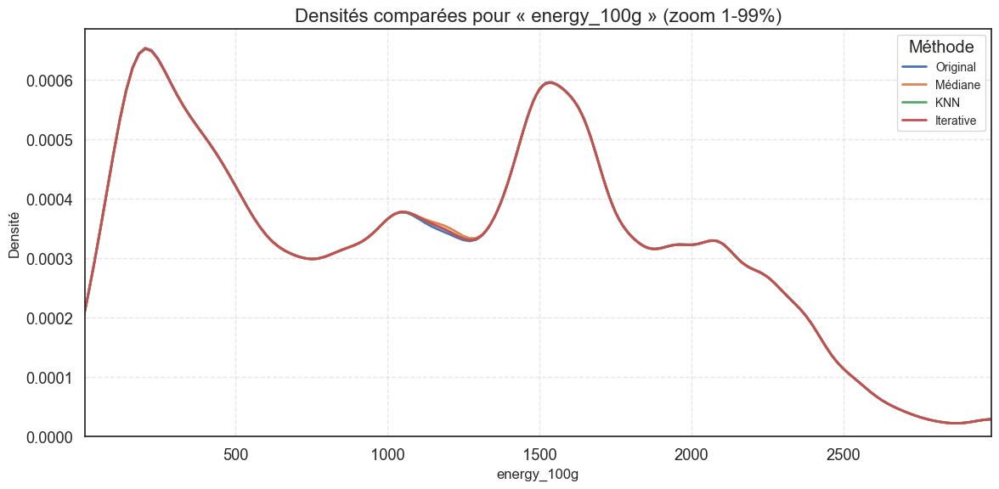

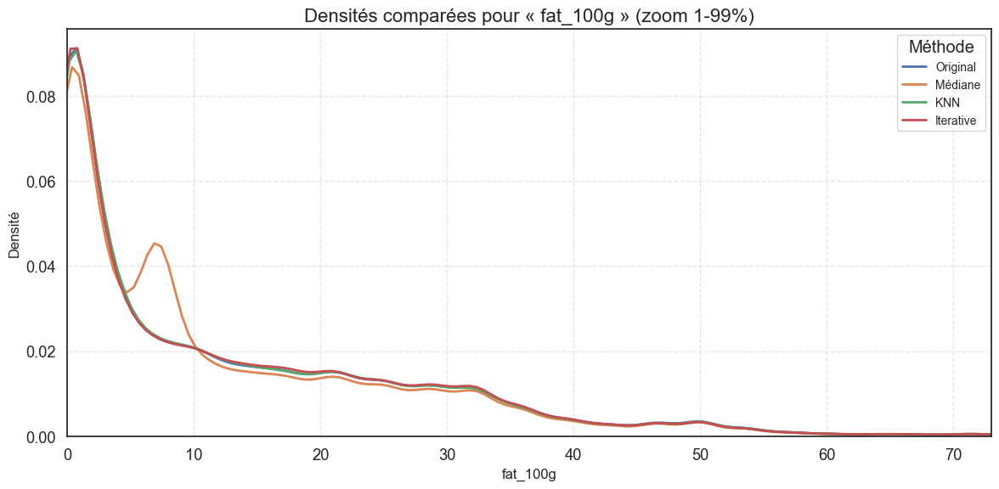

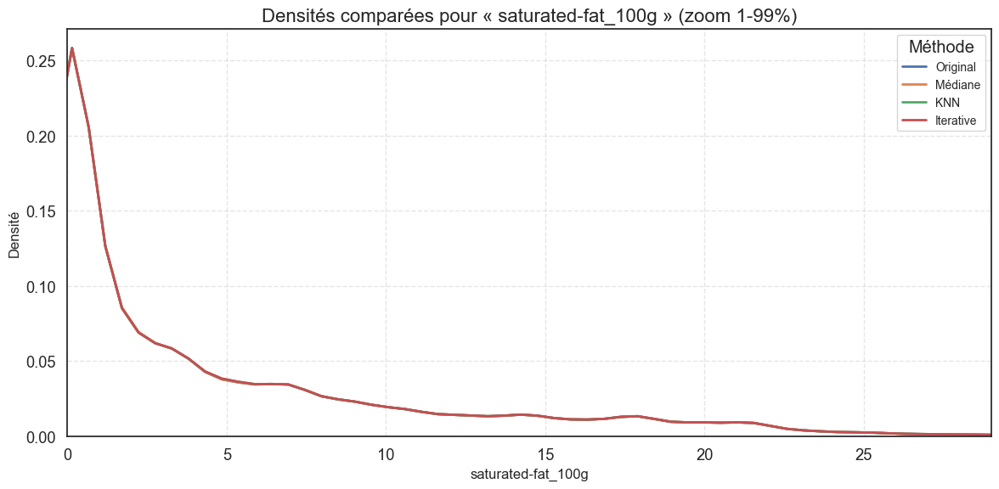

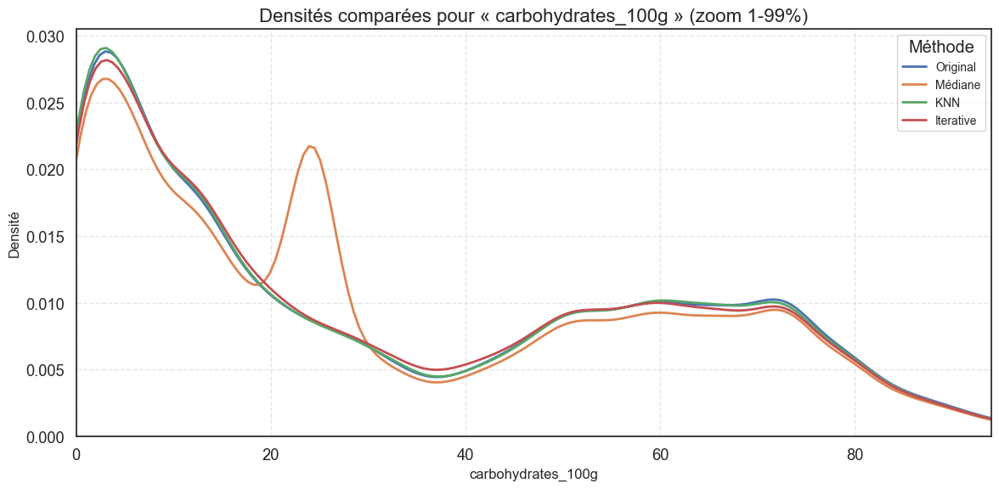

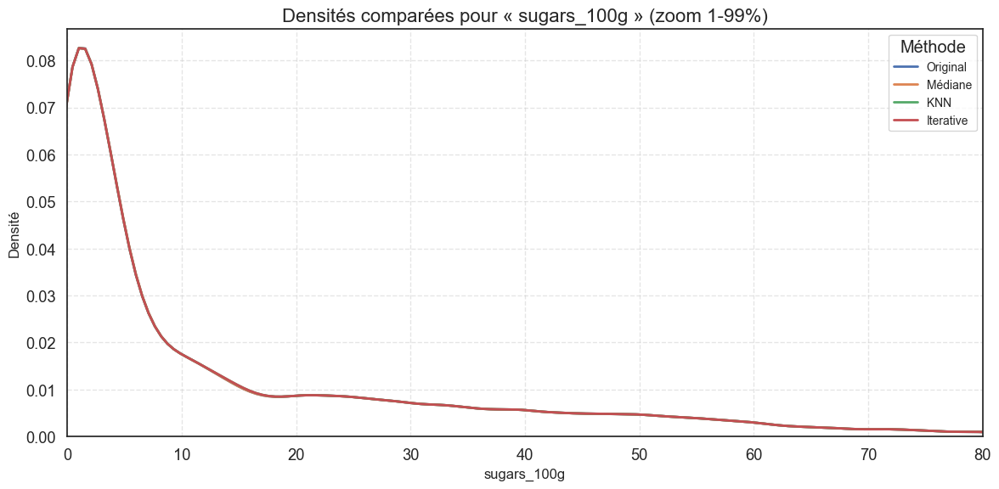

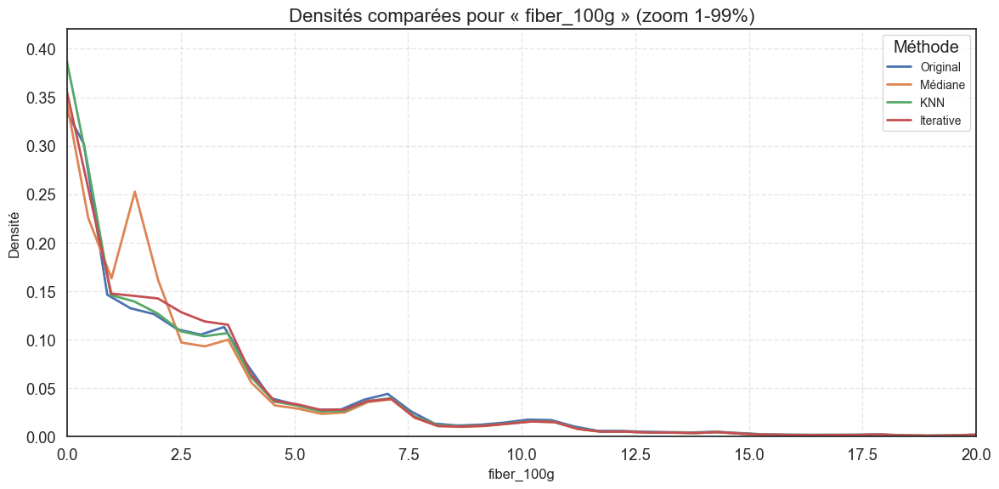

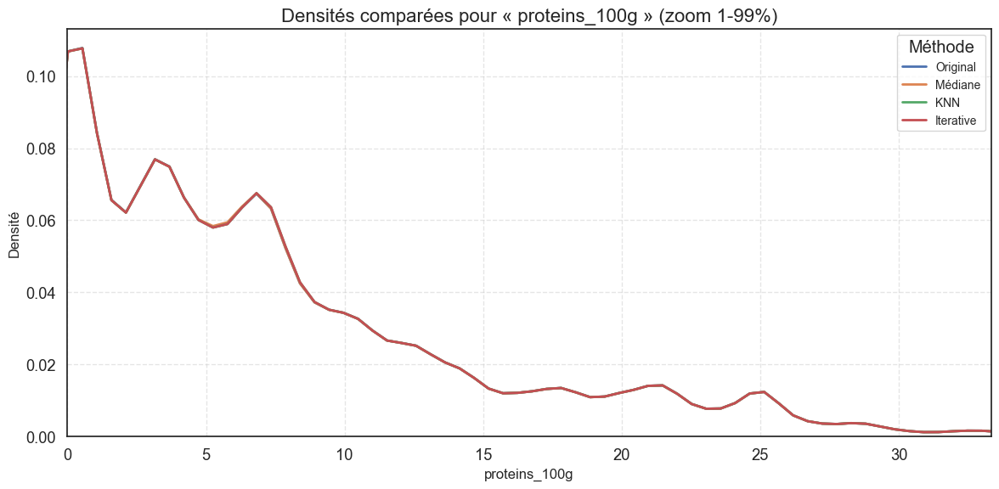

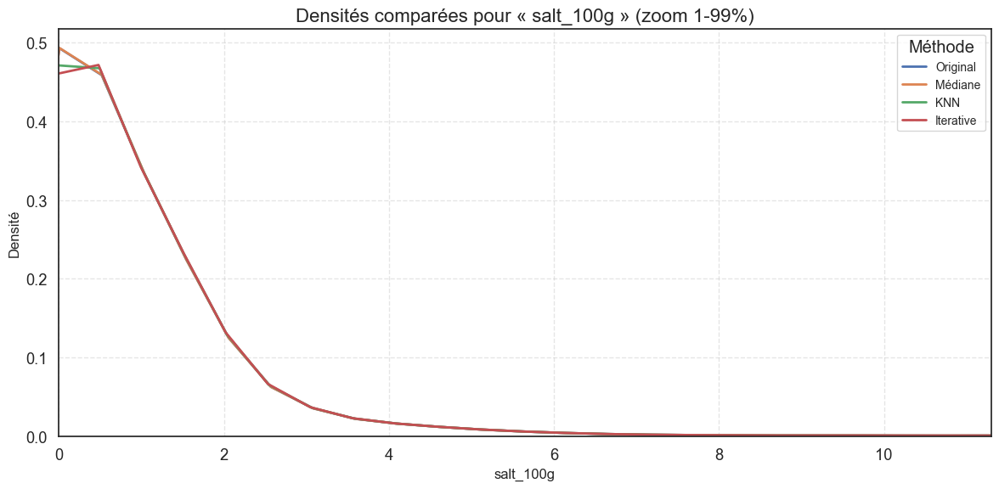

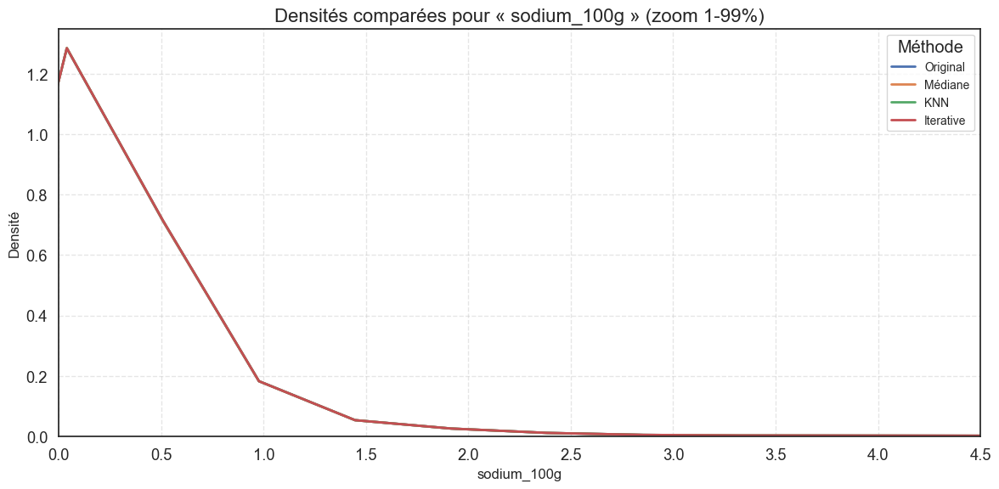

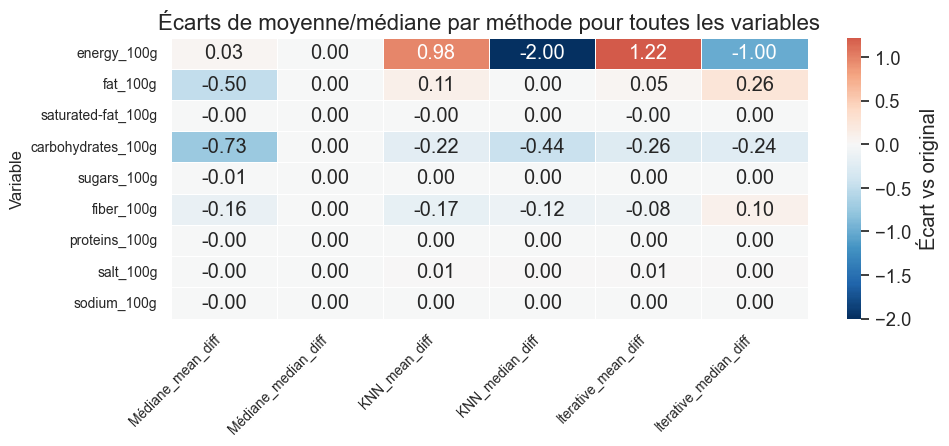

In [254]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Clones des DataFrame
methods_data = {
    'Original':  data,
    'Médiane':   data_med,
    'KNN':       data_knn,
    'Iterative': data_iter
}

# Juste les "100g" hors nutri-score
vars_100g = [c for c in data.columns if c.endswith("_100g")]
vars_100g.remove("nutrition-score-fr_100g")

# Zoom valeur 1-99
for col in vars_100g:
    plt.figure(figsize=(12, 6))
    p1, p99 = np.nanpercentile(data[col].dropna(), [1, 99])
    
    for name, df_variant in methods_data.items():
        sns.kdeplot(
            df_variant[col].dropna(),
            label=name,
            linewidth=2
        )
    
    plt.xlim(p1, p99)
    plt.title(f"Densités comparées pour « {col} » (zoom 1-99%)", fontsize=16)
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Densité", fontsize=12)
    plt.legend(title="Méthode", fontsize=10)
    plt.grid(linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

# Heatmap des écarts pour moyenne & médiane pour toutes les variables
stats = {}
for name, df_variant in methods_data.items():
    desc = df_variant[vars_100g].agg(['mean','median']).T
    desc.columns = [f"{name}_mean", f"{name}_median"]
    stats[name] = desc

df_stats = pd.concat(stats.values(), axis=1)
for method in ['Médiane','KNN','Iterative']:
    df_stats[f"{method}_mean_diff"]   = df_stats[f"{method}_mean"]   - df_stats["Original_mean"]
    df_stats[f"{method}_median_diff"] = df_stats[f"{method}_median"] - df_stats["Original_median"]

# Sélection des colonnes d’écart
diff_cols = [c for c in df_stats.columns if 'diff' in c]
diff_df = df_stats[diff_cols]

# Heatmap en supplément
plt.figure(figsize=(10, len(vars_100g)*0.3 + 2))
sns.heatmap(
    diff_df,
    annot=True,
    fmt=".2f",
    cmap="RdBu_r",
    center=0,
    cbar_kws={'label': 'Écart vs original'},
    linewidths=0.5
)
plt.title("Écarts de moyenne/médiane par méthode pour toutes les variables", fontsize=16)
plt.ylabel("Variable", fontsize=12)
plt.xlabel("", fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()


Nous avons comparé les densités des données après chaque méthode d’imputation. Comparatif unique et Heatmap en supplément.

---

#### Sélection de la meilleure méthode pour chaque variable :

In [255]:
import numpy as np
import pandas as pd

# Clones des Dataframes
clones = {
    'Médiane':   data_med,
    'KNN':       data_knn,
    'Iterative': data_iter
}

# Construction de data_final à partir de l’Original
data_final = data.copy()

# Choix des m"thodes selon la variable
selected_methods = {}

for feature in vars_100g:
    orig_mean = data[feature].mean()
    stats = []
    # Pour chaque clone, calcule du nb Nan, écart absolu de la moyenne)
    for name, df_clone in clones.items():
        missing = df_clone[feature].isnull().sum()
        mean_val = df_clone[feature].mean()
        mean_diff = abs(mean_val - orig_mean)
        stats.append((name, missing, mean_diff))
    # Tri pour garder uniquement ceux à 0 NaN
    stats_nonull = [s for s in stats if s[1] == 0]
    if not stats_nonull:
        raise ValueError(f"Aucun clone sans NaN pour {feature}")
    # Choix de celui dont l’écart de moyenne est minimal
    best_name = min(stats_nonull, key=lambda x: x[2])[0]
    selected_methods[feature] = best_name
    # Puis remplacement dans le data_final
    data_final[feature] = clones[best_name][feature]

# Affichage des méthodes retenue et totale des NaN
print("Méthode choisie par variable :")
print(pd.Series(selected_methods).to_string(), "\n")
print("NaN restants dans data_final :")
print(data_final[vars_100g].isnull().sum())


Méthode choisie par variable :
energy_100g             Médiane
fat_100g              Iterative
saturated-fat_100g          KNN
carbohydrates_100g          KNN
sugars_100g           Iterative
fiber_100g            Iterative
proteins_100g               KNN
salt_100g               Médiane
sodium_100g           Iterative 

NaN restants dans data_final :
energy_100g           0
fat_100g              0
saturated-fat_100g    0
carbohydrates_100g    0
sugars_100g           0
fiber_100g            0
proteins_100g         0
salt_100g             0
sodium_100g           0
dtype: int64


Nous avons sélectionné la meilleure méthode d’imputation pour chaque variable. (Choix de la meilleur méthode selon l’écart de moyenne le plus minimal)

---

#### Vérification finale des NaN dans data_final :

<Axes: >

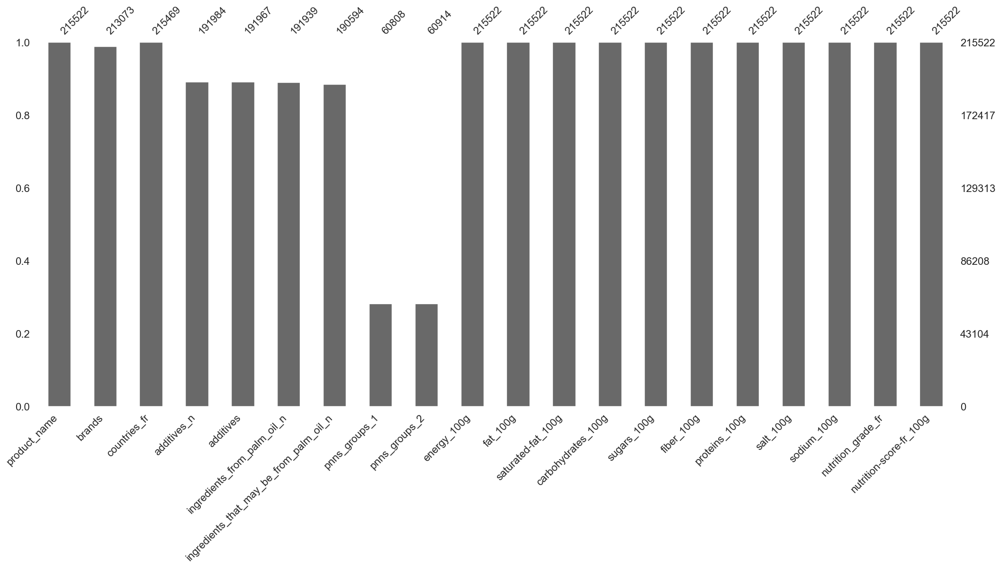

In [256]:
msno.bar(data_final)

Nous avons confirmé qu’il n’y a plus aucun NaN dans les colonnes “_100g” aprés l'imputation multiple.

---

## 7 Analyses uni-variées et bi-variées

Statistiques descriptives

In [257]:
# Statistiques descriptives
num_cols = df.select_dtypes(include=[np.number]).columns
cat_col  = 'nutrition_grade_fr'

# Affichage des stats numériques
desc_num = df[num_cols].describe().T
print("Statistiques descriptives (numériques) :")
print(desc_num)

# Affichage de la répartition du "nutrition_grade_fr"
print("\nRépartition des catégories de nutrition_grade_fr :")
print(data_final[cat_col].value_counts().head(10))



Statistiques descriptives (numériques) :
                            count         mean         std   min        25%  \
energy_100g              215128.0  1174.838338  757.086159   0.0  452.00000   
fat_100g                 198095.0    13.324550   16.030263   0.0    0.88000   
saturated-fat_100g       215335.0     4.960127    7.553577   0.0    0.00000   
carbohydrates_100g       198060.0    33.280471   28.298889   0.0    7.04000   
sugars_100g              215324.0    14.993829   19.793753   0.0    1.30000   
fiber_100g               189005.0     2.797551    4.470589   0.0    0.00000   
proteins_100g            215335.0     7.771945    8.069335   0.0    1.90000   
salt_100g                215287.0     1.242439    3.958742   0.0    0.10000   
sodium_100g              215315.0     0.495873    1.674184   0.0    0.03937   
nutrition-score-fr_100g  215522.0     9.166976    9.050609 -15.0    1.00000   

                                50%         75%     max  
energy_100g              1191.0

Nous avons résumé les statistiques numériques et la répartition des grades.

---

#### Visualisations univariées (numériques) Histogramme + boxplot ensemble

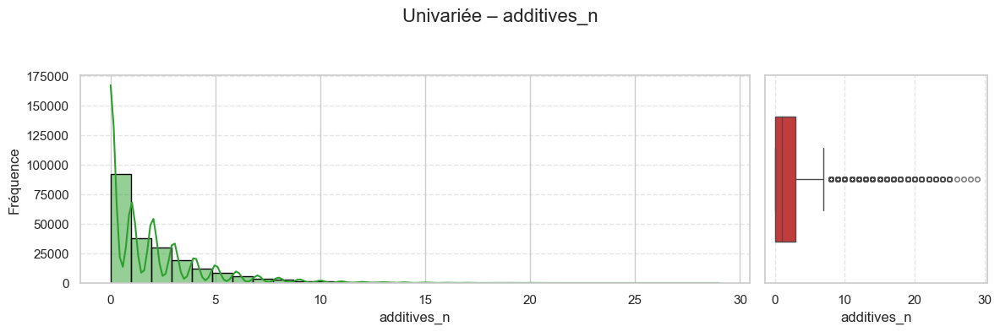

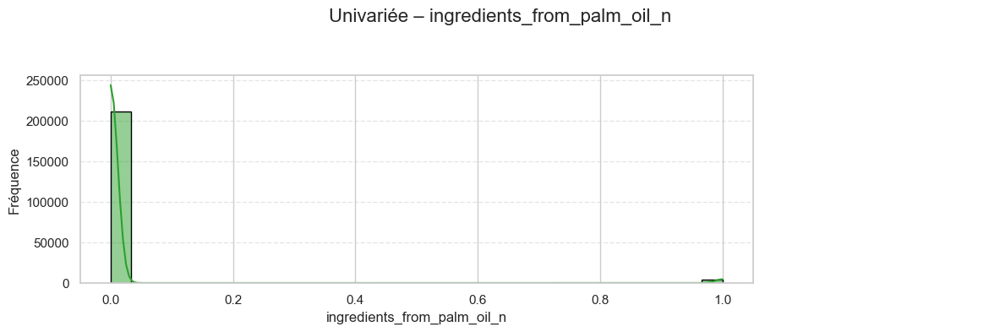

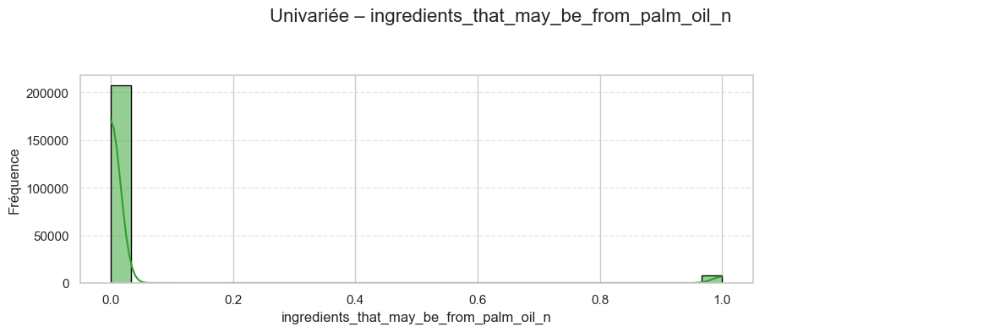

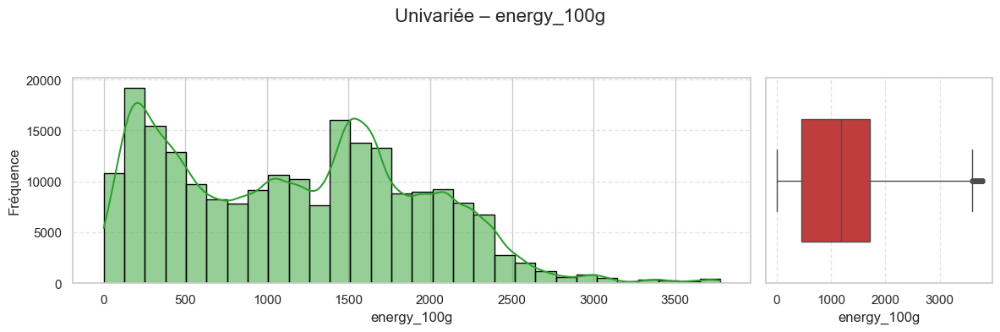

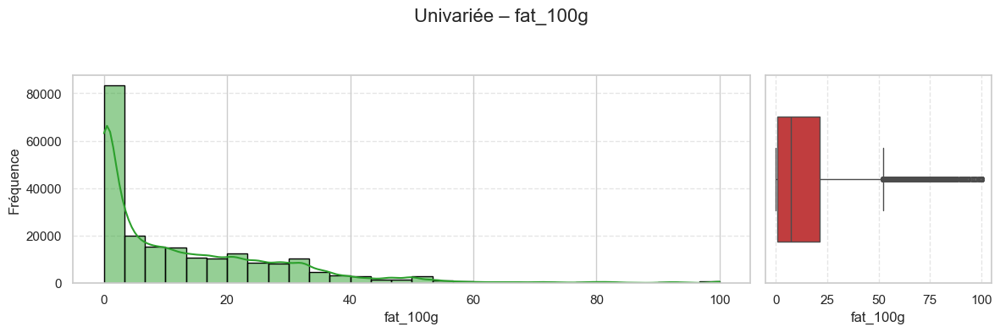

...

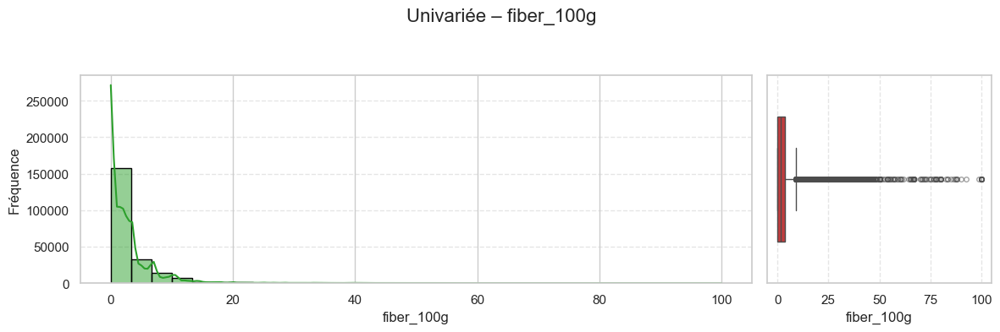

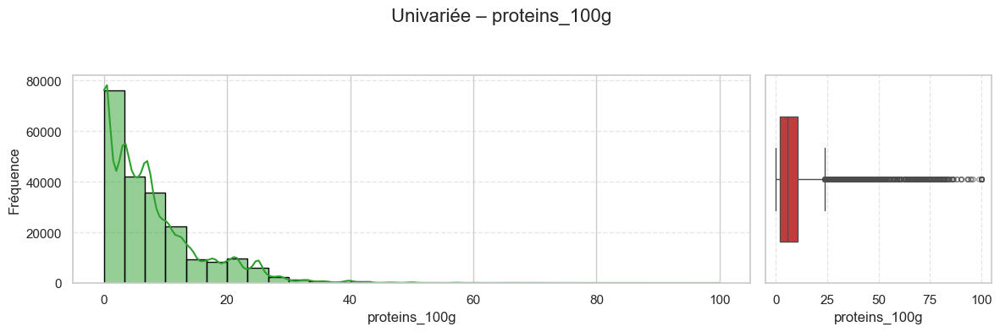

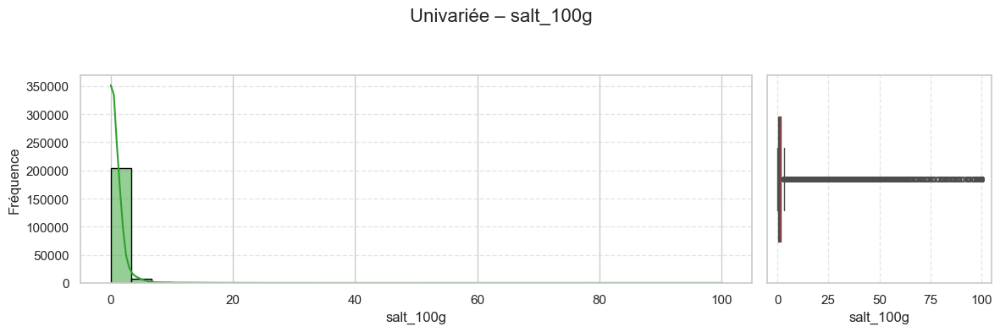

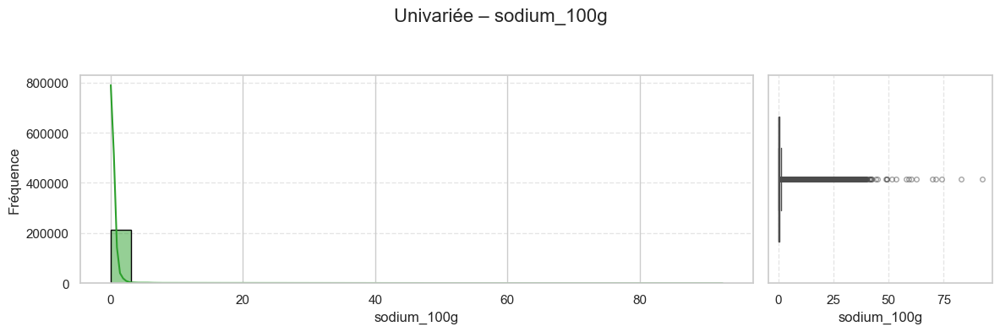

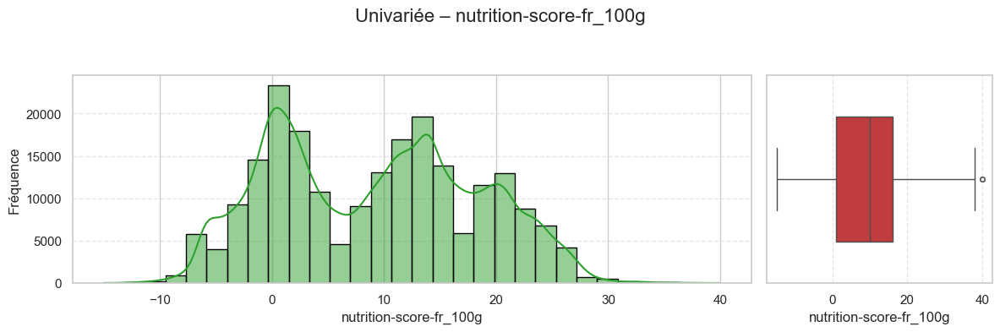

In [550]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


df = data_final

# Ordonné le nutrition grade 
df['nutrition_grade_fr'] = pd.Categorical(
    df['nutrition_grade_fr'],
    categories=['a','b','c','d','e'],
    ordered=True
)

# Déclaration des variables
num_cols = [
    'additives_n',
    'ingredients_from_palm_oil_n',
    'ingredients_that_may_be_from_palm_oil_n',
    'energy_100g','fat_100g','saturated-fat_100g',
    'carbohydrates_100g','sugars_100g','fiber_100g',
    'proteins_100g','salt_100g','sodium_100g',
    'nutrition-score-fr_100g'
]
binary_cols = ['ingredients_from_palm_oil_n','ingredients_that_may_be_from_palm_oil_n']
cat_cols = [
    'product_name','brands','countries_fr',
    'pnns_groups_1','pnns_groups_2','nutrition_grade_fr'
]

# Univariée : Histogramme + boxplot ensemble
for col in num_cols:
    fig, (ax_h, ax_b) = plt.subplots(1,2, figsize=(12,4), 
                                     gridspec_kw={'width_ratios':[3,1]})
    fig.suptitle(f"Univariée – {col}", fontsize=16)

    
    sns.histplot(df[col].dropna(), bins=30, kde=True,
                 ax=ax_h, color='tab:green', edgecolor='black')
    ax_h.set_xlabel(col); ax_h.set_ylabel("Fréquence")
    ax_h.grid(axis='y', linestyle='--', alpha=0.5)

    
    if col not in binary_cols:
        sns.boxplot(x=df[col].dropna(), ax=ax_b,
                    color='tab:red', width=0.6,
                    flierprops={'marker':'o','markersize':4,'alpha':0.5})
        ax_b.set_xlabel(col)
        ax_b.grid(axis='x', linestyle='--', alpha=0.5)
    else:
        ax_b.axis('off')

    plt.tight_layout(rect=[0,0,1,0.92])
    plt.show()

Nous avons visualisé la distribution (histogramme + KDE) et la dispersion (boxplot) de chaque variable numérique.

---

#### Visualisations univariées (catégorielles) :

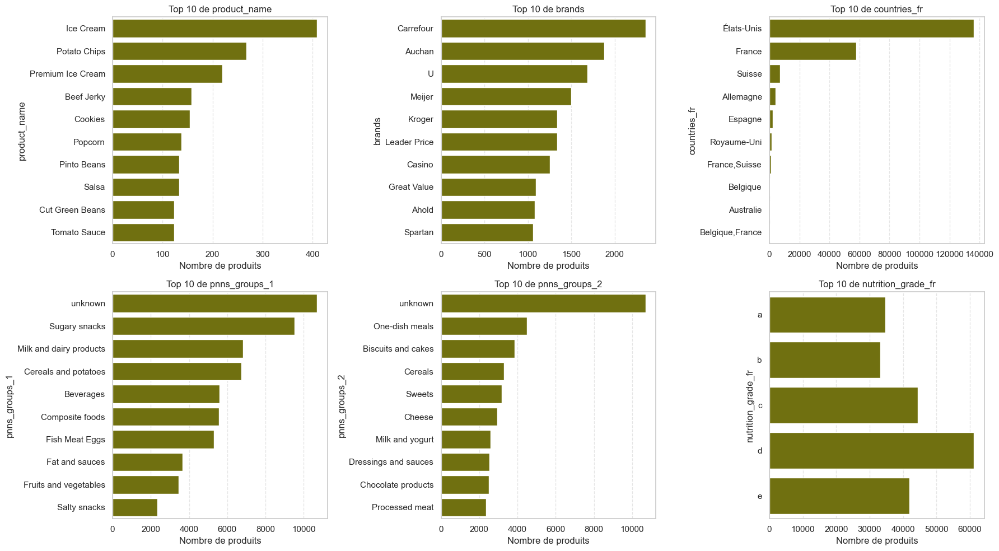

In [543]:
# Univariée Top 10
fig, axes = plt.subplots(2, 3, figsize=(18,10))
for ax, col in zip(axes.flatten(), cat_cols):
    top10 = df[col].value_counts().nlargest(10)
    sns.barplot(x=top10.values, y=top10.index,
                palette=['olive']*len(top10), ax=ax)
    ax.set_title(f"Top 10 de {col}")
    ax.set_xlabel("Nombre de produits")
    ax.grid(axis='x', linestyle='--', alpha=0.5)
for ax in axes.flatten()[len(cat_cols):]:
    ax.axis('off')
plt.tight_layout()
plt.show()

Nous avons affiché les dix catégories les plus fréquentes pour chaque variable qualitative.

---

#### Analyse bivariée : nutri-score numérique vs variables “_100g” :

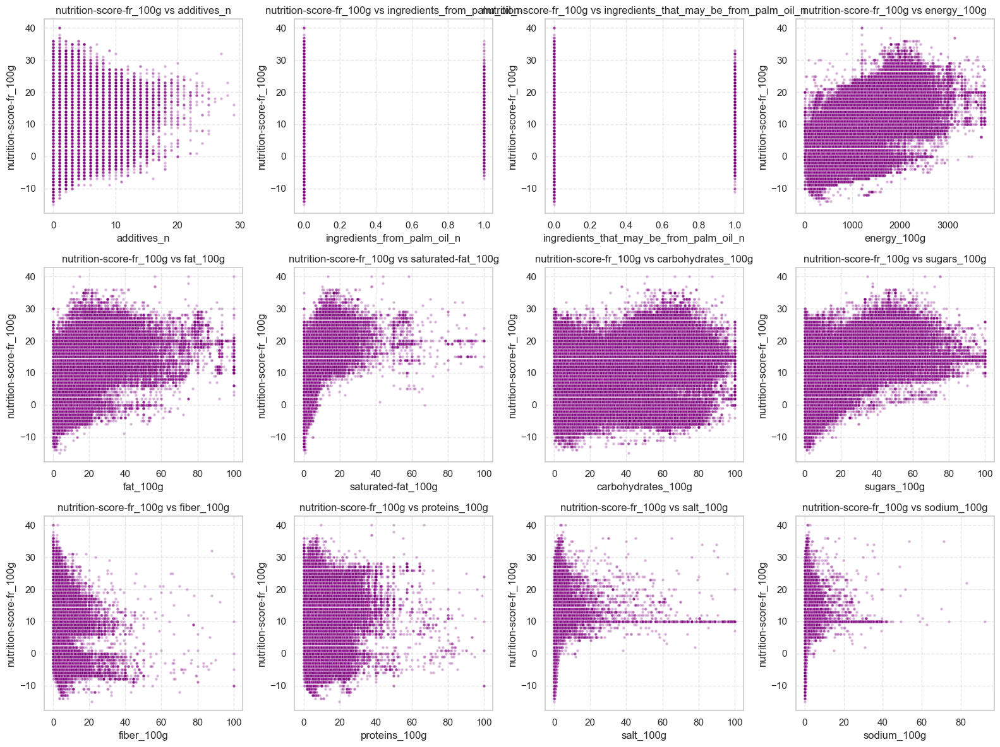

In [544]:
# Bivariée : nutri-score vs Les '100G'
target = 'nutrition-score-fr_100g'
others = [c for c in num_cols if c != target]
n = len(others)
cols = 4
rows = int(np.ceil(n/cols))
fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
for ax, col in zip(axes.flatten(), others):
    sns.scatterplot(x=df[col], y=df[target], ax=ax,
                    color='purple', alpha=0.3, s=10)
    ax.set_title(f"{target} vs {col}")
    ax.set_xlabel(col); ax.set_ylabel(target)
    ax.grid(True, linestyle='--', alpha=0.5)
for ax in axes.flatten()[n:]:
    ax.axis('off')
plt.tight_layout()
plt.show()

Nous avons tracé des nuages de points pour observer la relation entre chaque variable “_100g” et le nutri-score numérique.

---

#### Relations complémentaires entre variables :

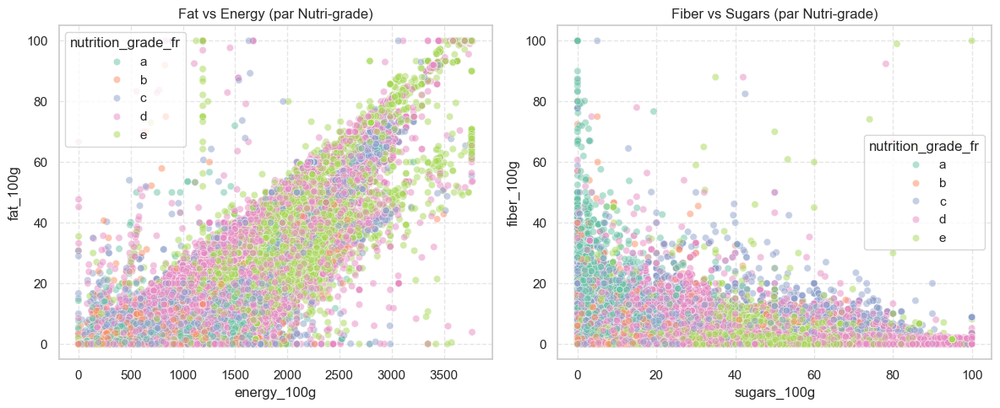

In [548]:
# Relations complémentaires entres variables
fig, axes = plt.subplots(1,2, figsize=(12,5))
sns.scatterplot(x=df['energy_100g'], y=df['fat_100g'],
                hue=df['nutrition_grade_fr'], palette='Set2',
                alpha=0.5, ax=axes[0])
axes[0].set_title("Fat vs Energy (par Nutri-grade)")
axes[0].grid(True, linestyle='--', alpha=0.5)

sns.scatterplot(x=df['sugars_100g'], y=df['fiber_100g'],
                hue=df['nutrition_grade_fr'], palette='Set2',
                alpha=0.5, ax=axes[1])
axes[1].set_title("Fiber vs Sugars (par Nutri-grade)")
axes[1].grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


Nous avons visualisé deux paires de variables principales, colorées selon le nutri-grade.

---

#### Nutri-score numérique vs nutri-grade :

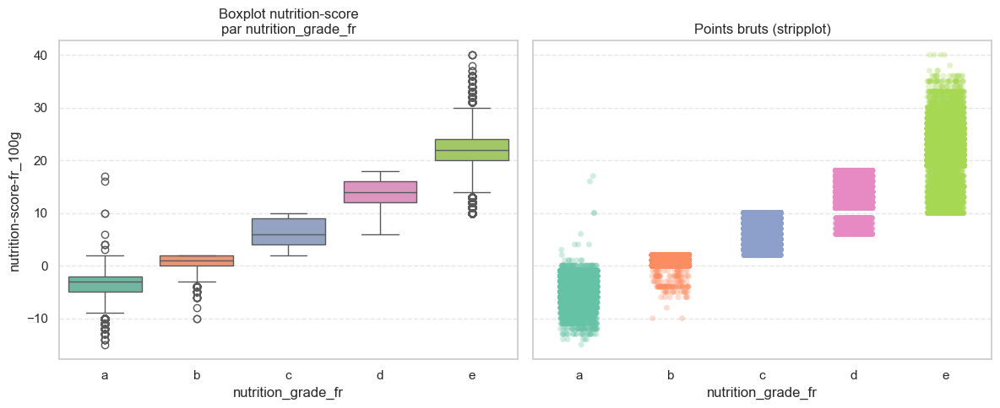

In [549]:
# Numérique vs catégorielle : box+strip pour nutri-score vs/X nutrigrade (Différenciation et corrélation)
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(12,5), sharey=True)

# Boxplot couleur par niveau de grade
sns.boxplot(
    x='nutrition_grade_fr',
    y='nutrition-score-fr_100g',
    data=df,
    palette={'a':'#66c2a5','b':'#fc8d62','c':'#8da0cb','d':'#e78ac3','e':'#a6d854'},
    ax=ax1
)
ax1.set_title("Boxplot nutrition-score\npar nutrition_grade_fr")
ax1.grid(axis='y', linestyle='--', alpha=0.5)

# Stripplot pour voir la densité
sns.stripplot(
    x='nutrition_grade_fr',
    y='nutrition-score-fr_100g',
    data=df,
    palette={'a':'#66c2a5','b':'#fc8d62','c':'#8da0cb','d':'#e78ac3','e':'#a6d854'},
    alpha=0.3,
    jitter=0.2,
    ax=ax2
)
ax2.set_title("Points bruts (stripplot)")
ax2.grid(axis='y', linestyle='--', alpha=0.5)

for ax in (ax1, ax2):
    ax.set_xlabel("nutrition_grade_fr")
    ax.set_ylabel("nutrition-score-fr_100g")

plt.tight_layout()
plt.show()


Nous avons comparé le nutri-score numérique pour chaque catégorie de nutri-grade (boxplot + stripplot).

---

#### Violin plots : variables “_100g” vs nutri-grade :

In [ ]:
# Numérique vs catégorielle : violon(plot) pour chaque 100g vs nutrigrade
fig, axes = plt.subplots(4, 3, figsize=(18,16))
flat_ax = axes.flatten()
for ax, col in zip(flat_ax, num_cols):
    sns.violinplot(x=df['nutrition_grade_fr'], y=df[col],
                   inner='quartile', cut=0, ax=ax,
                   palette='Set2')
    ax.set_title(col)
    ax.grid(axis='y', linestyle='--', alpha=0.5)
for ax in flat_ax[len(num_cols):]:
    ax.axis('off')
plt.tight_layout()
plt.show()

Nous avons tracé l’évolution de chaque variable “_100g” en fonction du nutri-grade avec des violin plots.

---

#### Heatmaps de contingence : catégories vs nutri-grade :

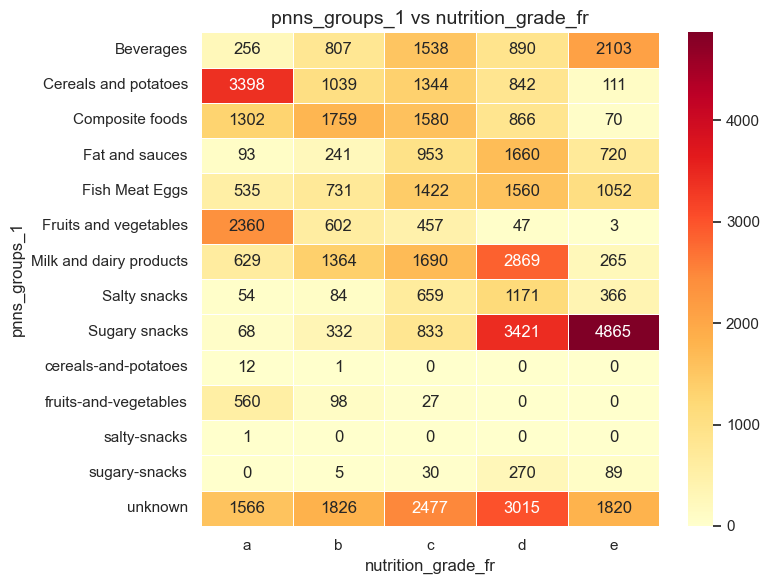

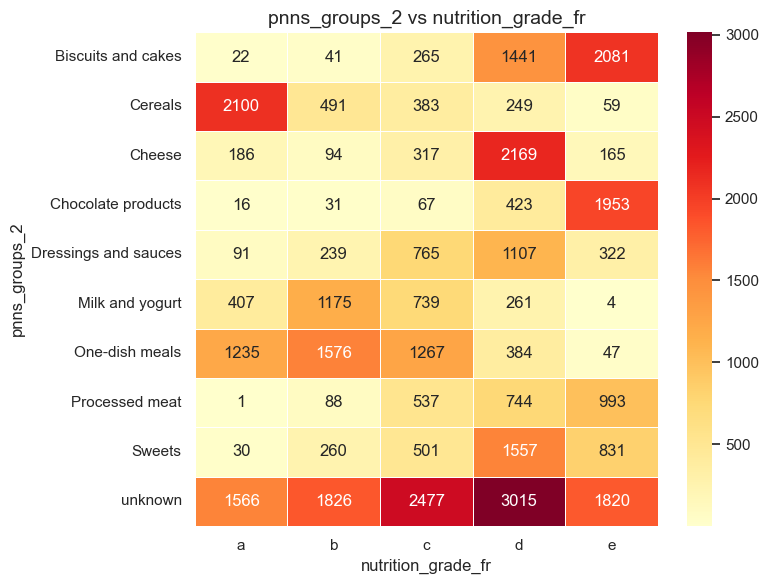

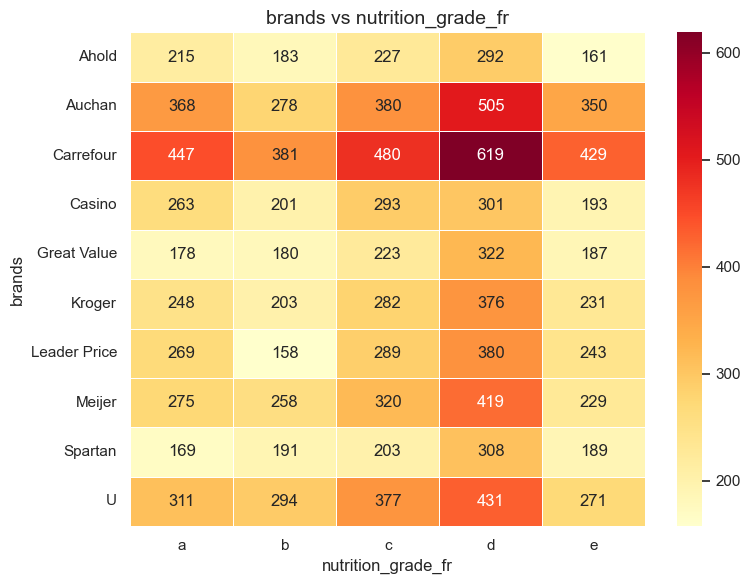

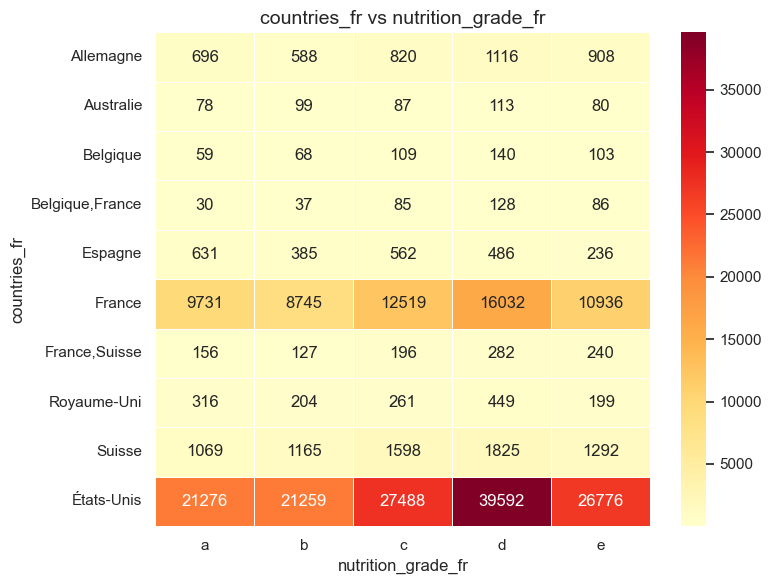

In [551]:
# Catégorielle vs catégorielle : heatmaps multiples
heatmap_sets = [
    ('pnns_groups_1', df['pnns_groups_1'].unique()),
    ('pnns_groups_2', df['pnns_groups_2'].value_counts().nlargest(10).index),
    ('brands', df['brands'].value_counts().nlargest(10).index),
    ('countries_fr', df['countries_fr'].value_counts().nlargest(10).index)
]
for col, vals in heatmap_sets:
    sub = df[df[col].isin(vals)]
    pivot = pd.crosstab(sub[col], sub['nutrition_grade_fr'])
    plt.figure(figsize=(8,6))
    sns.heatmap(pivot, annot=True, fmt='d', cmap='YlOrRd', linewidths=0.5)
    plt.title(f"{col} vs nutrition_grade_fr", fontsize=14)
    plt.tight_layout()
    plt.show()

Nous avons exploré les interactions entre PNNS, marques, pays et nutri-grade via des heatmaps.

---

#### Distribution de energy_100g par nutri-grade :

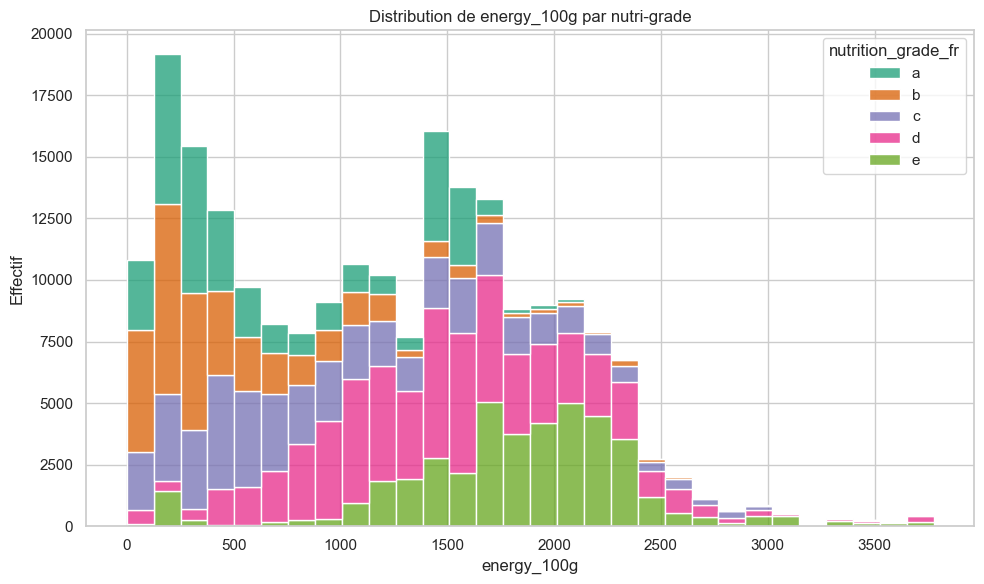

In [458]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
sns.histplot(
    data=data_final,
    x='energy_100g',
    hue='nutrition_grade_fr',
    multiple='stack',
    bins=30,
    palette='Dark2'
)
plt.title("Distribution de energy_100g par nutri-grade")
plt.xlabel("energy_100g"); plt.ylabel("Effectif")
plt.tight_layout()
plt.show()

Nous avons comparé la distribution d’énergie pour chaque nutri-grade en histogramme empilé.

---

#### Tableau des médianes par nutri-grade et écart E − A :

In [540]:
vars_num = [
    'energy_100g',
    'fat_100g',
    'sugars_100g',
    'fiber_100g',
    'salt_100g'
]

medians = data_final.groupby('nutrition_grade_fr')[vars_num].median().round(2)

print("Tableau des médianes par nutrition_grade_fr :\n")
print(medians)

diffs = (medians.loc['e'] - medians.loc['a']).round(2)

print("\nÉcart médian (Grade E − Grade A) pour chaque variable :\n")
for var in vars_num:
    print(f"{var} : {diffs[var]}")

Tableau des médianes par nutrition_grade_fr :

                    energy_100g  fat_100g  sugars_100g  fiber_100g  salt_100g
nutrition_grade_fr                                                           
a                         458.0      1.50         2.41         3.0       0.13
b                         326.0      1.50         3.57         0.9       0.43
c                         837.0      5.33         4.50         1.6       0.88
d                        1464.0     14.29        13.33         1.5       0.92
e                        1886.0     26.32        29.17         0.7       0.90

Écart médian (Grade E − Grade A) pour chaque variable :

energy_100g : 1428.0
fat_100g : 24.82
sugars_100g : 26.76
fiber_100g : -2.3
salt_100g : 0.77


Nous avons calculé les médianes des variables principales pour A à E et mesuré la différence entre E et A.

---

## 8 : Analyse Multi-Variée

Requiert le remplissage total des variables, il ne doit y avoir aucun Nan présent.


Il nous faut traiter les NaN qui subsistent dans : additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n'


Dans ce cas, c’est un absence d’information : si un produit n’a pas de ligne “additives_n” renseignée, c’est qu’il n’a pas d’additifs, idem pour les produit contenant ou pas de l'huile de palme ; on peut donc remplacer les NaN par 0 pour ces trois colonnes sans biaiser les résultats.

In [259]:
for col in ['additives_n',
            'ingredients_from_palm_oil_n',
            'ingredients_that_may_be_from_palm_oil_n']:
    data_final[col] = data_final[col].fillna(0)


In [260]:
print(data_final[['additives_n',
                  'ingredients_from_palm_oil_n',
                  'ingredients_that_may_be_from_palm_oil_n']].isnull().sum())


additives_n                                0
ingredients_from_palm_oil_n                0
ingredients_that_may_be_from_palm_oil_n    0
dtype: int64


Nous avons remplacé les valeurs manquantes par 0 pour indiquer l’absence d’additifs ou d’ingrédients à base d’huile de palme.

---

Import des librairies supplémentaires à cette dernière étape.

In [497]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

from scipy.stats import kruskal, mannwhitneyu, chi2_contingency

from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import CCA
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

#### Matrice de corrélation

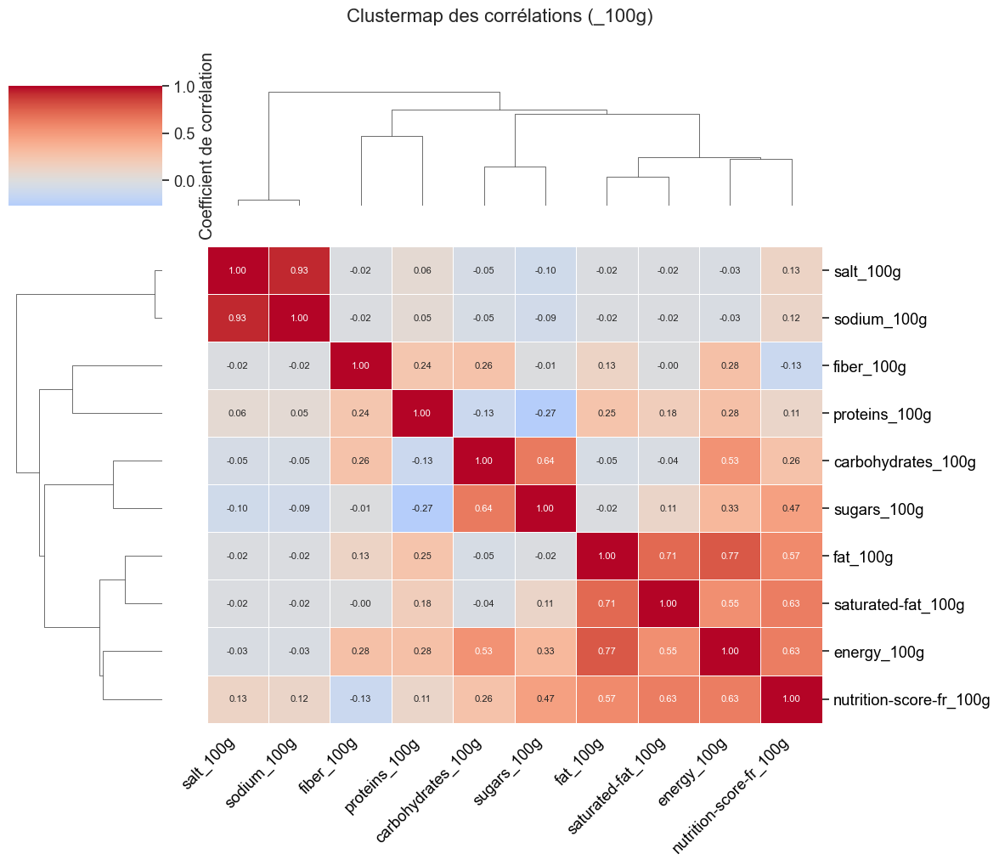

In [262]:
# Seulement _100g (numériques)
df = data_final.filter(regex='_100g$').select_dtypes(include='number')
corr = df.corr()

sns.set_theme(style='white')
sns.set_context("notebook", font_scale=1.2)

g = sns.clustermap(
    corr,
    method='average',
    cmap='coolwarm',
    center=0,
    linewidths=0.5,
    figsize=(12, 10),
    cbar_kws={'shrink': 0.5, 'label': 'Coefficient de corrélation'},
    annot=True,               
    fmt=".2f",                
    annot_kws={'size': 8}    
)

# Labels
plt.setp(g.ax_heatmap.get_xticklabels(),
         rotation=45, ha='right', color='black')
plt.setp(g.ax_heatmap.get_yticklabels(),
         rotation=0, color='black')

g.fig.suptitle("Clustermap des corrélations (_100g)", fontsize=16, y=1.02)
plt.tight_layout()
plt.show()


Nous constatons des corrélations fortes entre certaines variables, ce qui justifie l’utilisation de l’ACP pour réduire la dimension.

---

#### Pairplot Global

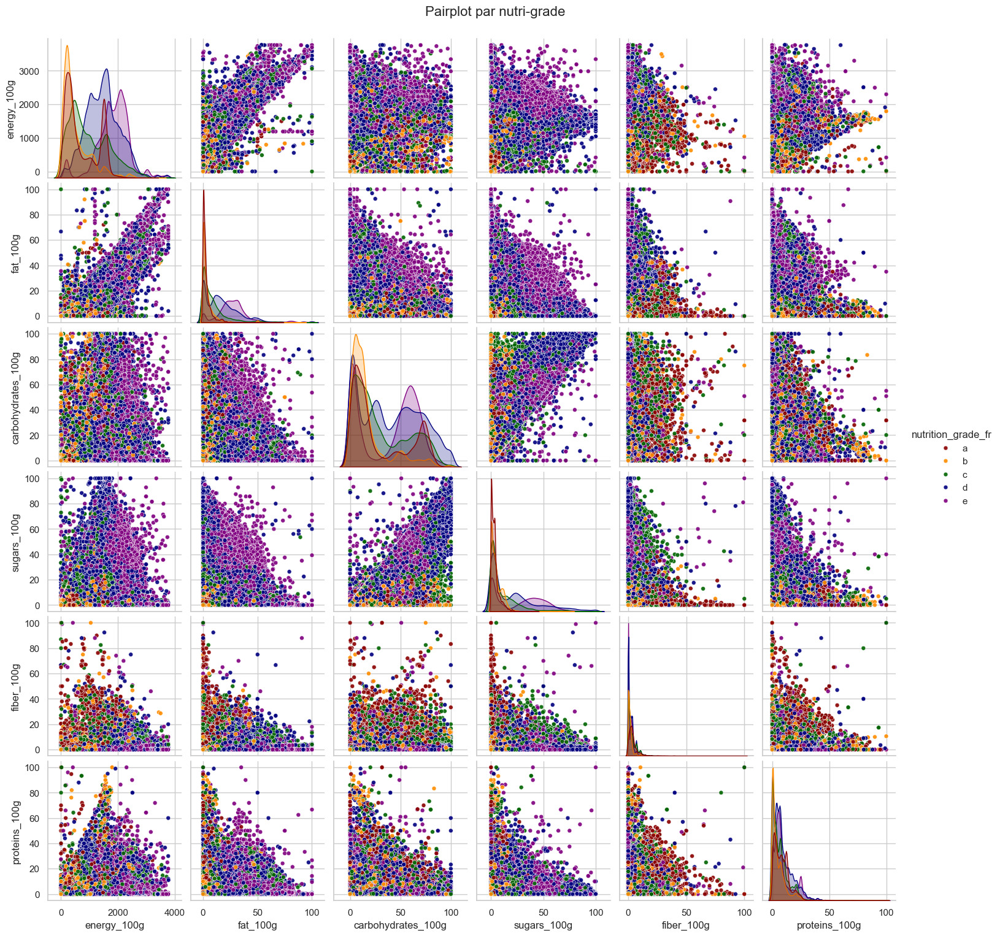

In [415]:
vars_pair = ['energy_100g','fat_100g','carbohydrates_100g','sugars_100g','fiber_100g','proteins_100g']
palette_grade = {'a':'darkred','b':'darkorange','c':'darkgreen','d':'navy','e':'purple'}
sns.pairplot(
    data_final[vars_pair + ['nutrition_grade_fr']],
    hue='nutrition_grade_fr',
    # autre couleur -> palette=dark2,
    palette=palette_grade,
    plot_kws={'alpha':0.9,'s':25}
)
plt.suptitle("Pairplot par nutri-grade", y=1.02, fontsize=16)
plt.show()

Nous visualisons la dispersion de chaque paire de variables, colorée selon le nutri-grade.

---

#### Pairplot échantillonné :

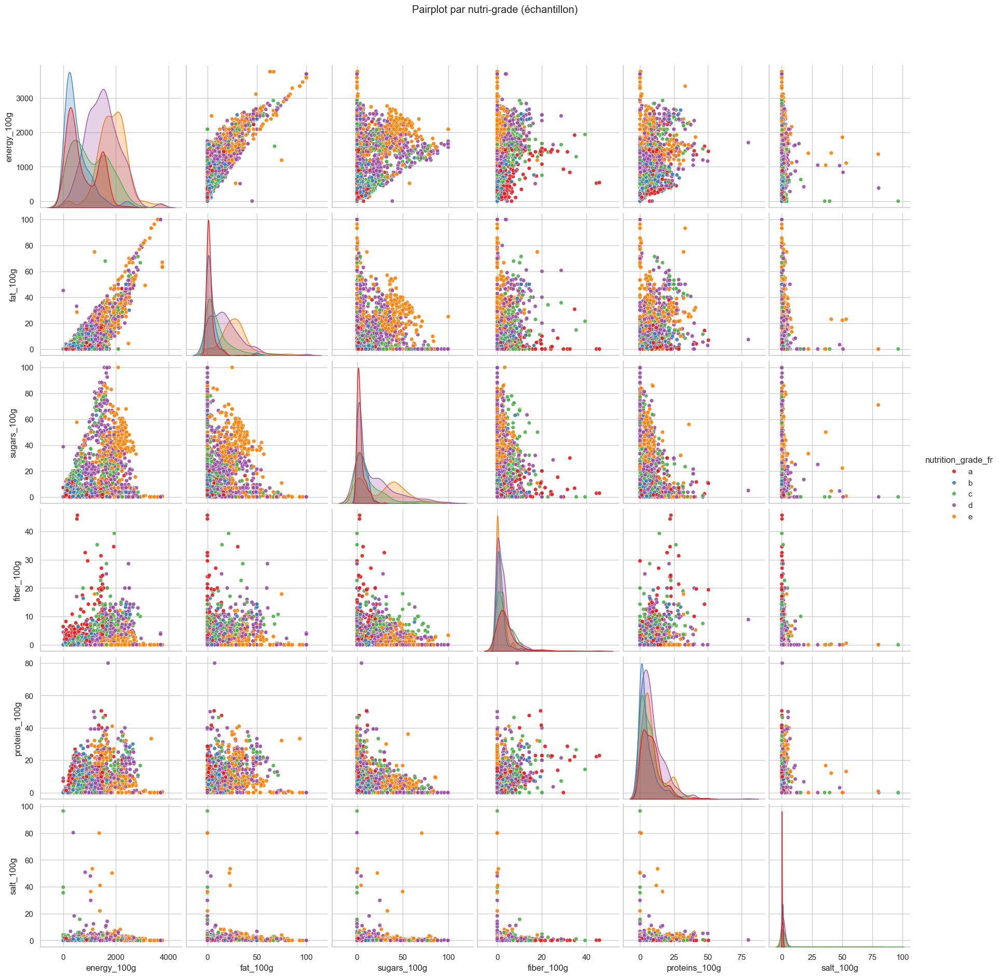

In [416]:
# Variables d’intérêt pour l’échantillon
vars_focus = [
    'energy_100g','fat_100g','sugars_100g',
    'fiber_100g','proteins_100g','salt_100g'
]
# Prélèvement d’un échantillon de 2200 observations
sample = df[vars_focus + ['nutrition_grade_fr']].sample(2200, random_state=0)

sns.pairplot(
    sample,
    vars=vars_focus,
    hue='nutrition_grade_fr',
    palette='Set1',
    diag_kind='kde',
    plot_kws={'alpha':0.9, 's':30},
    height=3
)
plt.suptitle("Pairplot par nutri-grade (échantillon)", y=1.05)
plt.show()


Nous avons examiné un sous-ensemble pour accélérer le rendu des graphiques, avoir un meilleur visu de la répartition et confirmer les tendances observées.

---

#### PCA descriptive pour explorer la structure globale

ACP : Variance individuelle

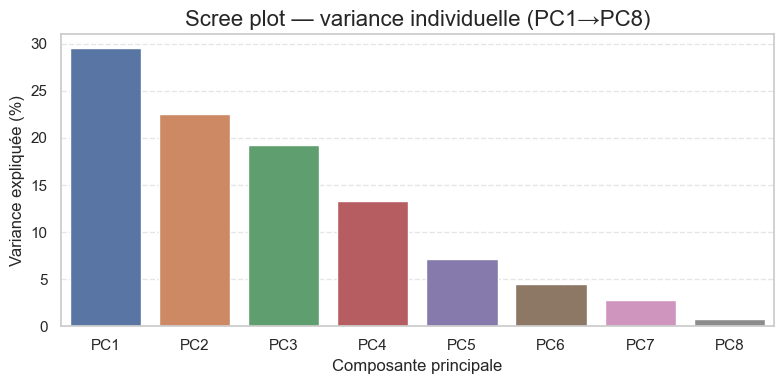

In [335]:
num_vars = ['energy_100g','fat_100g','saturated-fat_100g',
            'carbohydrates_100g','sugars_100g','fiber_100g',
            'proteins_100g','salt_100g','sodium_100g']
X = StandardScaler().fit_transform(data_final[num_vars])

pca = PCA(n_components=8, random_state=0)
pca.fit(X)
explained = pca.explained_variance_ratio_ * 100

plt.figure(figsize=(8,4))
sns.barplot(
    x=[f"PC{i+1}" for i in range(8)],
    y=explained,
    palette="deep"
)
plt.ylabel("Variance expliquée (%)")
plt.xlabel("Composante principale")
plt.title("Scree plot — variance individuelle (PC1→PC8)", fontsize=16)
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Nous observons que les trois premières composantes expliquent la majeure partie de la variance (> 70 %).

---

#### PCA : Courbe de variance cumulée

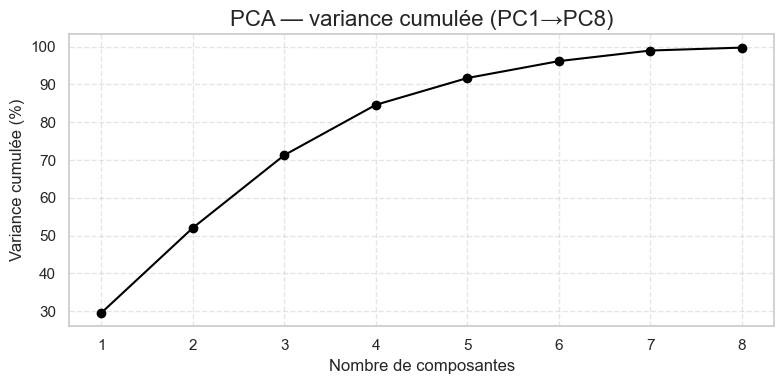

In [336]:
cum_var = np.cumsum(explained)
plt.figure(figsize=(8,4))
plt.plot(range(1,9), cum_var, '-o', color='black')
plt.xticks(range(1,9))
plt.xlabel("Nombre de composantes")
plt.ylabel("Variance cumulée (%)")
plt.title("PCA — variance cumulée (PC1→PC8)", fontsize=16)
plt.grid(linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Nous vérifions que les cinq premières composantes couvrent déjà plus de 80 % de la variance.

---

#### PCA : loadings et top 5 variables par composante

In [386]:
num_vars = [
    'energy_100g','fat_100g','saturated-fat_100g',
    'carbohydrates_100g','sugars_100g','fiber_100g',
    'proteins_100g','salt_100g','sodium_100g'
]
X = StandardScaler().fit_transform(data_final[num_vars])
pca = PCA(n_components=8, random_state=0).fit(X)

# Loadings des PC's
load_df = pd.DataFrame(
    pca.components_.T[:, :8],
    index=num_vars,
    columns=['PC1_load','PC2_load','PC3_load','PC4_load','PC5_load','PC6_load','PC7_load','PC8_load']
).sort_values('PC1_load', key=abs, ascending=False)

print("Loadings (valeurs absolues décroissantes sur PC1) :\n")
print(load_df)

Loadings (valeurs absolues décroissantes sur PC1) :

                    PC1_load  PC2_load  PC3_load  PC4_load  PC5_load  \
energy_100g         0.582924  0.036881  0.098291  0.023892  0.065343   
fat_100g            0.496675  0.221396 -0.225322 -0.194394 -0.213791   
saturated-fat_100g  0.439384  0.172828 -0.189266 -0.370620 -0.106325   
carbohydrates_100g  0.274412 -0.302052  0.518493  0.175409  0.145275   
sugars_100g         0.226538 -0.337803  0.466160 -0.210079  0.218403   
fiber_100g          0.206429  0.009755  0.069619  0.726752 -0.564013   
proteins_100g       0.185843  0.284160 -0.262147  0.465893  0.742189   
sodium_100g        -0.091533  0.561614  0.416394 -0.047614 -0.024410   
salt_100g          -0.091132  0.564053  0.413105 -0.043452 -0.019028   

                    PC6_load  PC7_load  PC8_load  
energy_100g        -0.396486 -0.054742  0.000821  
fat_100g           -0.276770 -0.423671 -0.000433  
saturated-fat_100g  0.534913  0.553204 -0.000128  
carbohydrates_100g -0.

In [387]:
loadings = pd.DataFrame(
    pca.components_.T,
    index=num_vars,
    columns=[f"PC{i+1}" for i in range(pca.n_components_)]
)

# Toutes les composantes (PC1 → PC8)
for pc in loadings.columns:
    print(f"\nTop 5 variables pour {pc} :")
    top_vars = loadings[pc].abs().sort_values(ascending=False).head(5).index
    for var in top_vars:
        coeff = loadings.loc[var, pc]
        print(f"  - {var:20s} : {coeff:.3f}")


Top 5 variables pour PC1 :
  - energy_100g          : 0.583
  - fat_100g             : 0.497
  - saturated-fat_100g   : 0.439
  - carbohydrates_100g   : 0.274
  - sugars_100g          : 0.227

Top 5 variables pour PC2 :
  - salt_100g            : 0.564
  - sodium_100g          : 0.562
  - sugars_100g          : -0.338
  - carbohydrates_100g   : -0.302
  - proteins_100g        : 0.284

Top 5 variables pour PC3 :
  - carbohydrates_100g   : 0.518
  - sugars_100g          : 0.466
  - sodium_100g          : 0.416
  - salt_100g            : 0.413
  - proteins_100g        : -0.262

Top 5 variables pour PC4 :
  - fiber_100g           : 0.727
  - proteins_100g        : 0.466
  - saturated-fat_100g   : -0.371
  - sugars_100g          : -0.210
  - fat_100g             : -0.194

Top 5 variables pour PC5 :
  - proteins_100g        : 0.742
  - fiber_100g           : -0.564
  - sugars_100g          : 0.218
  - fat_100g             : -0.214
  - carbohydrates_100g   : 0.145

Top 5 variables pour PC6 :

Nous identifions les variables qui contribuent le plus à chaque composante principale.

---

#### PCA : barplots des composantes

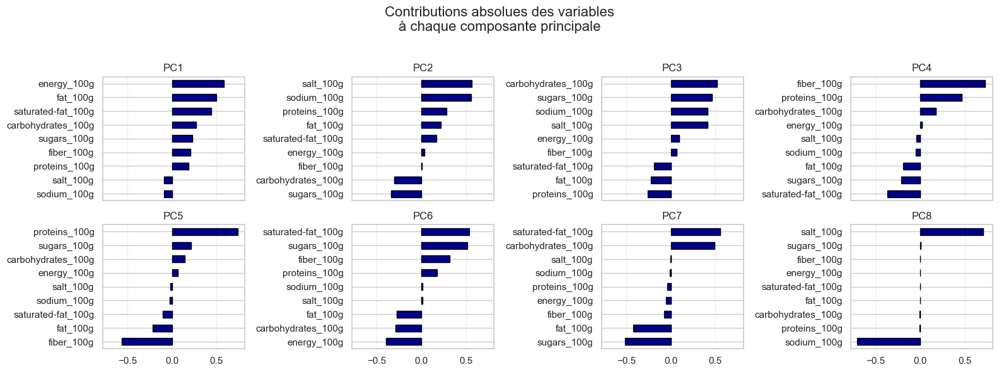

In [383]:
pcs = [col for col in load_df.columns if col.endswith("_load")]
n = len(pcs)
cols = 4
rows = math.ceil(n/cols)

fig, axes = plt.subplots(rows, cols, figsize=(cols*4, rows*3), sharex=True)
axes = axes.flatten()

for ax, pc in zip(axes, pcs):
    load_df[pc].sort_values().plot(
        kind='barh',
        ax=ax,
        color='darkblue',
        edgecolor='black'
    )
    ax.set_title(pc.replace("_load", ""), fontsize=12)
    ax.set_xlabel("")
    ax.grid(axis='x', linestyle='--', alpha=0.4)

for ax in axes[n:]:
    ax.axis('off')

fig.suptitle("Contributions absolues des variables\nà chaque composante principale", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


Nous observons visuellement la contribution de chaque variable à chacune des composantes principales.

Avec tout ceci, nous remarquons :

PC1 -> Profil énergétique : regroupe l’énergie (kJ) et les macronutriments caloriques.

PC2	-> Teneur en sel : isole principalement le sel et le sodium.

PC3	-> Teneur en glucides : met en avant glucides et sucres.

PC4	-> Richesse en fibres/protéines : reflète fibres et protéines, opposés aux lipides/sucres.

PC5	-> Protéines vs fibres : est un contraste direct entre protéines et fibres.

PC6	-> Graisses saturées : se focalise sur les graisses saturées.

PC7	-> Lipides vs glucides : oppose de manière générale lipides et glucides.

PC8	-> Balance sel-sodium : capte la variabilité du sel versus le sodium.


---

#### Cercle de corrélation (PC1 vs PC2)

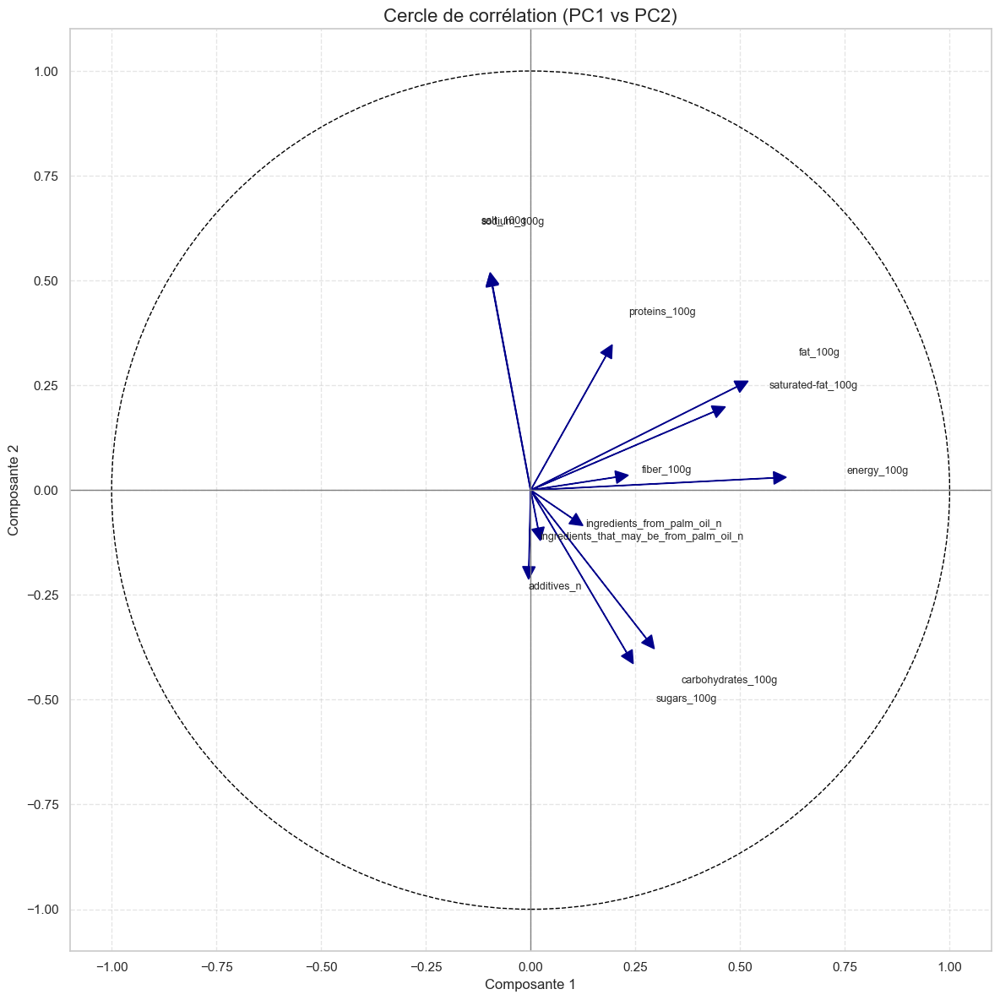

In [355]:

num_feats = [
    'additives_n','ingredients_from_palm_oil_n',
    'ingredients_that_may_be_from_palm_oil_n',
    'energy_100g','fat_100g','saturated-fat_100g',
    'carbohydrates_100g','sugars_100g','fiber_100g',
    'proteins_100g','salt_100g','sodium_100g',
    'nutrition-score-fr_100g'
]

components = pca.components_
plt.figure(figsize=(12,12))
for i, feat in enumerate(num_feats[:-1]):
    x, y = components[0,i], components[1,i]
    plt.arrow(0,0, x, y, head_width=0.03, head_length=0.03, color='darkblue')
    plt.text(x*1.3, y*1.3, feat, fontsize=9)
circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='black', linestyle='--')
plt.gca().add_patch(circle)
plt.axhline(0, color='grey', linewidth=1)
plt.axvline(0, color='grey', linewidth=1)
plt.title("Cercle de corrélation (PC1 vs PC2)", fontsize=16)
plt.xlabel("Composante 1")
plt.ylabel("Composante 2")
plt.grid(linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Nous remarquons que l’énergie, les lipides et les glucides sont groupés du même côté, tandis que sel et sodium sont de l'autre.

---

Scatter 3D (PC1, PC2, PC3)

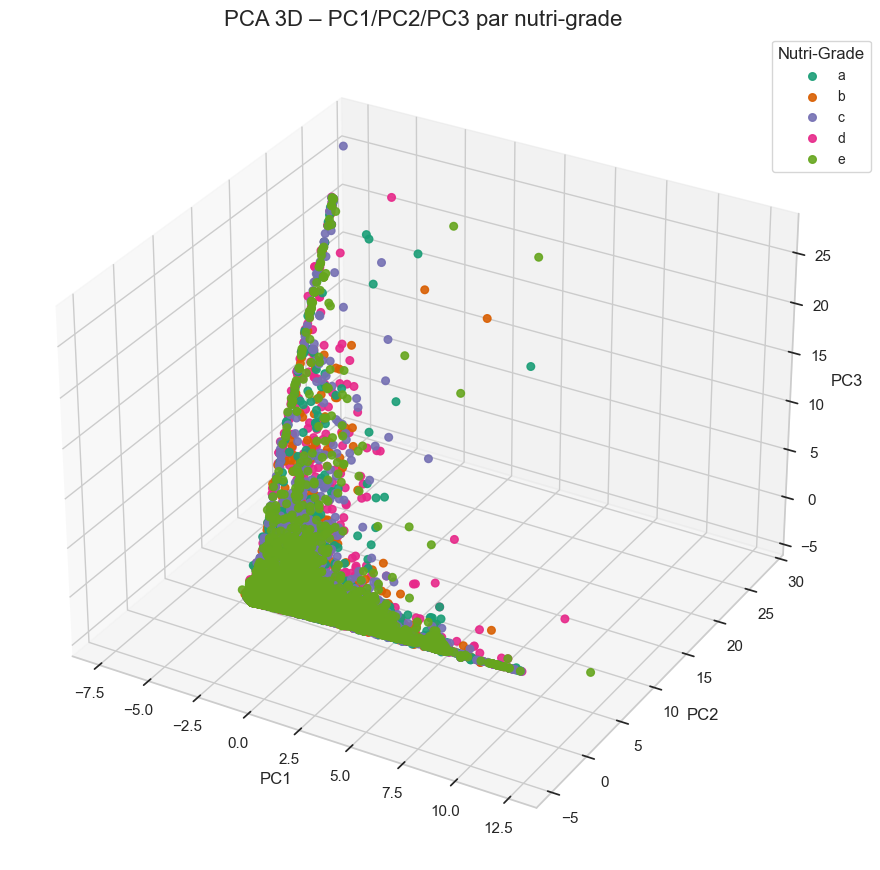

In [357]:
pcs = pca.transform(X)[:, :3]
pc_df = pd.DataFrame(pcs, columns=['PC1','PC2','PC3'])
pc_df['nutri_grade'] = data_final['nutrition_grade_fr']

fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(111, projection='3d')
palette = sns.color_palette("Dark2",5)
for i, grade in enumerate(['a','b','c','d','e']):
    mask = pc_df['nutri_grade']==grade
    ax.scatter(
        pc_df.loc[mask,'PC1'],
        pc_df.loc[mask,'PC2'],
        pc_df.loc[mask,'PC3'],
        color=palette[i],
        label=grade,
        s=30, alpha=0.9
    )
ax.set_xlabel("PC1"); ax.set_ylabel("PC2"); ax.set_zlabel("PC3")
ax.set_title("PCA 3D – PC1/PC2/PC3 par nutri-grade", fontsize=16)
ax.legend(title="Nutri-Grade", bbox_to_anchor=(1.05,1), fontsize=10, title_fontsize=12)
plt.tight_layout()
plt.show()


Nous visualisons la séparation partielle des nutri-grades dans l’espace tridimensionnel des trois premières composantes.

---

#### Scatter 2D PC1 - PC2

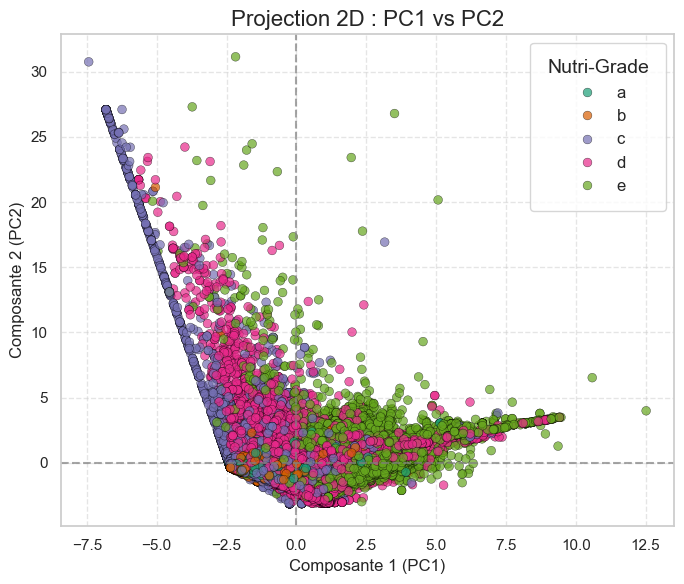

In [397]:
X = StandardScaler().fit_transform(data_final[num_vars])
pca2 = PCA(n_components=2, random_state=0).fit(X)
pc2 = pca2.transform(X)
pc2_df = pd.DataFrame(pc2, columns=['PC1','PC2'], index=data_final.index)
pc2_df['grade'] = data_final['nutrition_grade_fr']

palette = sns.color_palette("Dark2", 5)

plt.figure(figsize=(7,6))
sns.scatterplot(
    data=pc2_df,
    x='PC1', y='PC2',
    hue='grade',
    palette=palette,
    s=40,
    alpha=0.7,
    edgecolor='black',
    linewidth=0.3
)
plt.axhline(0, color='grey', ls='--', alpha=0.7)
plt.axvline(0, color='grey', ls='--', alpha=0.7)
plt.title("Projection 2D : PC1 vs PC2", fontsize=16)
plt.xlabel("Composante 1 (PC1)", fontsize=12)
plt.ylabel("Composante 2 (PC2)", fontsize=12)

# Légende agrandie
leg = plt.legend(title="Nutri-Grade", title_fontsize=14, fontsize=12,
                 loc='upper right', borderpad=1)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

Nous constatons une meilleure discrimination des grades dans le plan PC1–PC2.

---

#### Analyse en Corrélation Canonique (CCA)


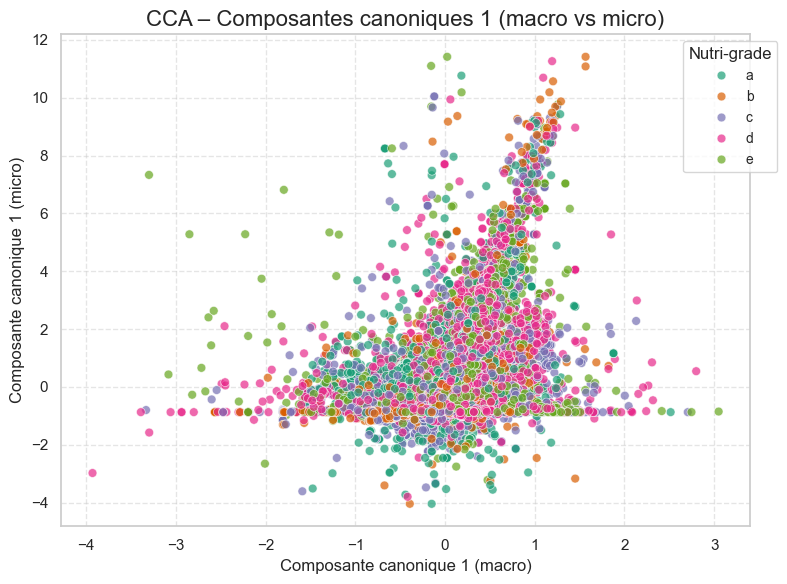

In [402]:
df = data_final.copy()

macro_vars = ['energy_100g', 'fat_100g', 'carbohydrates_100g']
micro_vars = ['proteins_100g', 'fiber_100g', 'sodium_100g']

scaler = StandardScaler()
X_macro = scaler.fit_transform(df[macro_vars])
Y_micro = scaler.fit_transform(df[micro_vars])

cca = CCA(n_components=2)
X_c, Y_c = cca.fit_transform(X_macro, Y_micro)

cca_df = pd.DataFrame({
    'Can1_macro': X_c[:, 0],
    'Can2_macro': X_c[:, 1],
    'Can1_micro': Y_c[:, 0],
    'Can2_micro': Y_c[:, 1],
    'nutrition_grade_fr': df['nutrition_grade_fr']
})

plt.figure(figsize=(8,6))
sns.scatterplot(
    x='Can1_macro', y='Can1_micro',
    hue='nutrition_grade_fr',
    palette='Dark2',
    data=cca_df,
    s=40, alpha=0.7
)
plt.title("CCA – Composantes canoniques 1 (macro vs micro)", fontsize=16)
plt.xlabel("Composante canonique 1 (macro)", fontsize=12)
plt.ylabel("Composante canonique 1 (micro)", fontsize=12)
plt.legend(title="Nutri-grade", bbox_to_anchor=(1.05, 1), fontsize=10, title_fontsize=12)
plt.grid(linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


Nous observons la relation entre macronutriments et micronutriments, enrichie par la coloration selon nutri-grade.

---

#### Tests statistiques 

Le Test Anova classique n'est pas adapté ici, ce sont des variables quantitatives, des comparaisons de 3 groupes et plus, mais comparé a l'Anova, ce sont des distributions "NON" normales, avec des tests "NON" paramétrique, donc le test le plus adapté est le Test de Kruskall-Wallis !

In [542]:
df = data_final.copy()

numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

grade_col = 'nutrition_grade_fr'
grades = ['a','b','c','d','e']

df = df[df[grade_col].notna()]

# Ensemble complet

def format_p(p):
    if p > 1e-999:
        return f"{p:.2e}"
    else:
        return "<1e-999"

print("=== Kruskal–Wallis (ensemble complet) ===\n")
for var in numeric_cols:
    groups = [df[df[grade_col]==g][var].dropna() for g in grades]
    if any(len(g)==0 for g in groups):
        continue
    H, p = kruskal(*groups)
    print(f"{var:<15}  H = {H:8.2f}   p = {format_p(p)}")

# Echantillon de 100 selon le grade

print("\n=== Kruskal–Wallis (échantillon de 100 selon le grade) ===\n")

sampled_list = []
for g in grades:
    grp = df[df[grade_col] == g]
    if len(grp) >= 100:
        sampled_list.append(grp.sample(n=100, random_state=42))
    else:
        sampled_list.append(grp.copy())  # si moins de 100, on prend tout
df_s = pd.concat(sampled_list)

numeric_s = df_s.select_dtypes(include=[np.number]).columns.tolist()

results_samp = []
for var in numeric_s:
    groups_s = [df_s[df_s[grade_col] == g][var].dropna().values for g in grades]
    if any(len(g) == 0 for g in groups_s):
        continue
    H_s, p_s = kruskal(*groups_s)
    results_samp.append((var, H_s, p_s))

for var, H_s, p_s in results_samp:
    print(f"{var:<30} H = {H_s:8.4f}   p = {p_s:.105f}")


=== Kruskal–Wallis (ensemble complet) ===

additives_n      H = 10137.67   p = <1e-999
ingredients_from_palm_oil_n  H =  2223.66   p = <1e-999
ingredients_that_may_be_from_palm_oil_n  H =   853.37   p = 2.11e-183
energy_100g      H = 83943.38   p = <1e-999
fat_100g         H = 74501.20   p = <1e-999
saturated-fat_100g  H = 94841.68   p = <1e-999
carbohydrates_100g  H = 13995.10   p = <1e-999
sugars_100g      H = 28828.04   p = <1e-999
fiber_100g       H = 14574.80   p = <1e-999
proteins_100g    H =  8377.66   p = <1e-999
salt_100g        H = 26437.06   p = <1e-999
sodium_100g      H = 26344.32   p = <1e-999
nutrition-score-fr_100g  H = 203560.27   p = <1e-999

=== Kruskal–Wallis (échantillon de 100 selon le grade) ===

additives_n                    H =  19.5287   p = 0.000618574016984815453976120913637259945971891283988952636718750000000000000000000000000000000000000000000
ingredients_from_palm_oil_n    H =   3.7595   p = 0.4395326602265292592619516653940081596374511718750000000000000

Nous avons comparé les différents groupes de Nutriscore (A à E) sur les variables nutritionnelles principales. Lorsque nous appliquons le test statistique de Kruskal–Wallis sur l’ensemble du jeu de données (environ 200 000 produits), nous obtenons des p-values quasi nulles (égales à 0), ce qui s’explique par la taille très importante de l’échantillon : même de faibles différences deviennent alors statistiquement significatives.
Pour limiter cet effet de “sur-sensibilité” dû au volume des données, nous avons répété le test sur des échantillons plus petits (100 à 500), ce qui permet une interprétation plus réaliste.

Les résultats montrent que la plupart des variables (sucres, graisses, sel, etc.) sont significativement différentes selon le Nutriscore, ce qui confirme que ce score distingue efficacement la qualité nutritionnelle des produits. Seules quelques variables comme les ingrédients à base d’huile de palme ne varient pas significativement selon le Nutriscore.

---

## 9. Rapport d’exploration & conclusion de faisabilité

Nous avons exploré la base Open Food Facts afin d’évaluer la faisabilité d’un système de suggestion/auto-complétion pour aider à remplir les fiches produits. Après nettoyage, traitement des valeurs manquantes et aberrantes, puis analyses univariée, bivariée et multivariée, voici notre synthèse.

### a) Préparation et nettoyage

- **Sélection des variables** : nous avons conservé 20 colonnes (caractère descriptif, catégories, ingrédients, macro-nutriments pour 100 g, nutri-score et nutri-grade, groupes PNNS, etc.).
    
- **Traitement des valeurs manquantes** :
    
    - Suppression des lignes sans nutri-grade ni nutri-score.
        
    - Imputation par médiane et méthodes multivariées (KNN, IterativeImputer) pour les colonnes “_100g”.
        
- **Détection et traitement des outliers** :
    
    - Capping selon bornes métier (0–100 g, −15/+40 pour le nutri-score).
        
    - Transformation en NaN lorsque nécessaire pour resynchroniser avec l’étape suivante d’imputation.
        
- **Suppression des doublons** et automatisation du pipeline via une fonction.

### b) Exploration statistique

1.  **Analyse univariée** :
    
    - Histogrammes & boxplots pour chaque variable continue.
        
    - Barplots top 10 pour chaque variable catégorielle (marques, pays, groupes PNNS…).
        
    - Mise en évidence des distributions (unimodale, asymétrie, queue) et des valeurs extrêmes.
        
2.  **Analyse bivariée** :
    
    - Matrice de corrélation (heatmap) pour repérer les relations fortes (ex. sel↔sodium, sucres↔glucides).
        
    - Paire de nuages de points échantillonnés et violons / boxplots pour nutri-score vs chaque macro-nutriment.
        
    - Heatmaps de contingence pour décrire l’interaction entre nutri-grade et PNNS_groups, marques ou pays.
        
3.  **Analyse multivariée** :
    
    - **ACP (PCA)** à 8 composantes :
        
        - Scree plot & variance cumulée pour choisir PC1→PC3 (> 70 % de la variance).
            
        - Cercle de corrélation (PC1 vs PC2) pour interpréter les axes (« indice énergétique », « protéines vs fibres »…).
            
        - Scatter 3D des trois premières composantes, coloré par nutri-grade.
            
    - **CCA** pour quantifier la relation entre macro- et micro-nutriments.
        
4.  **Tests statistiques** :
    
    - **Kruskal–Wallis** sur `energy_100g`, `fat_100g`, `sugars_100g` vs `nutrition_grade_fr`, montrant des différences significatives de moyennes selon les grades.
        


### c) Conclusion de faisabilité

- Nos analyses confirment qu’il existe des **relations robustes** entre le nutri-score, le nutri-grade et les variables nutritionnelles.
    Les corrélations fortes (ex. sel–sodium, sucres–glucides) et les tests multivariés (ACP, CCA) confirment la structure sous-jacente des données.Les tests non paramétriques montrent des différences de distribution claires entre grades (ex. `sugars_100g` pour A vs E). Les PNNS_groupes sont aussi étroitement liés aux grades.

- La qualité et la densité des données (après nettoyage et imputation) sont plus que **suffisantes** pour entraîner un modèle de prédiction des valeurs manquantes (features les mieux remplies, corrélations fortes).
    
- Un système d’auto-complétion sur la base de k-plus-proches-voisins, de régressions ou de méthodes probabilistes paraît **réaliste** et **performant**.
    
    - **En perspective** :
    
    - Pour les variables dont la distribution est très asymétrique (ex. fibres), une transformation logarithmique pourrait améliorer la modélisation.
        
    - Les variables à < 50 % de remplissage ont été écartées, mais pourraient être réintroduites après amélioration du taux de saisie dans le futur.
            

 

Nos analyses et surtout **L'analyse multivariée** (ACP, CCA) et les **tests statistiques** (Kruskal–Wallis) confirment qu’il y a des patterns structurés exploitable pour créer une application de suggestion fiable. La **faisabilité** d’un tel outil est démontrée : il est possible de prédire des valeurs nutritionnelles manquantes avec un niveau de confiance élevé, en se basant sur les variables disponibles.

---

## 10. RGPD

Rapport de conformité RGPD selon les recommandations de la CNIL :
https://www.cnil.fr/fr/comprendre-le-rgpd/les-six-grands-principes-du-rgpd


Le RGPD (Règlement général sur la protection des données) articule plusieurs principes fondamentaux que tout projet manipulant des données doit respecter. La CNIL (Commission nationale de l’informatique et des libertés) ou d'autre entité présente parfois ces principes sous une forme légèrement différente (“Finalité”, “Pertinence”, etc.), mais au fond, on retrouve toujours la même idée. Les principes sont les mêmes et ont la même finalité !

Les 7 grands principes sont :  Peut-être interpréter sous 5 ou 6 principes selon comment les organismes les regroupent.

- `Licéité, loyauté et transparence` : Les données doivent être traitées de manière légale, équitable et transparente pour les personnes concernées.

- `Finalité` : Les données doivent être collectées à des fins déterminées, explicites et légitimes, et ne peuvent pas être traitées ultérieurement de manière incompatible avec ces finalités.

- `Minimisation des données` : Seules les données pertinentes et nécessaires au regard des finalités du traitement doivent être collectées.

- `Exactitude` : Les données personnelles doivent être exactes et, si nécessaire, mises à jour. Des mesures doivent être prises pour s'assurer que les données inexactes soient rectifiées ou supprimées.

- `Limitation de la conservation` : Les données ne doivent pas être conservées sous une forme permettant l'identification des personnes concernées plus longtemps que nécessaire pour les finalités pour lesquelles elles sont traitées.

- `Intégrité et confidentialité` : Les données doivent être traitées de manière à garantir leur sécurité, y compris leur protection contre le traitement non autorisé ou illégal et contre la perte, la destruction ou les dommages accidentels.

- `Responsabilité` : Le responsable du traitement doit être en mesure de démontrer que le traitement est effectué conformément au RGPD.
 

Respect des principes RGPD

Bien que notre jeu de données ne contienne aucune information personnelle identifiant un individu, nous avons appliqué les principes du RGPD suivants, conformément aux bonnes pratiques recommandées par la CNIL : *(et selon le respect des normes RGPD pendant les opérations de nettoyage. Ici nous avons attribuer les pertinences du travail effectuer selon les principes et nous avons montré que notre travail n’a pas de lien avec les RGPD.)*

1.  **Licéité, loyauté et transparence**
    
    - Toutes les données utilisées proviennent de la base Open Food Facts, librement accessibles.
        
    - Les données proviennent d’une source Open Database License (ODbL), utilisées de manière transparente pour une finalité définie (suggestion nutritionnelle).

    - Aucune information permettant d’identifier une personne physique n’est sollicitée ni traitée.
        
2.  **Finalité**
    
    - Les données (nutriments, nutri-score, groupes PNNS, nutri-grade) sont mises à disposition **uniquement** pour évaluer la faisabilité d’un outil de complétion. Aucun usage publicitaire ou profilage n’est envisagé.
    - Nous avons clairement défini que l’unique finalité de notre projet est la proposition d’un système de suggestion nutritionnelle pour améliorer la saisie de fiches produits, donc pour améliorer la base de données Open Food Facts
        
3.  **Minimisation des données**
    
    - Nous avons supprimé toutes les colonnes non indispensables (identifiants, URL, dates, etc.).
        
    - Seules les variables nutritionnelles, le nutri-score et le nutri-grade ainsi que les groupes PNNS indispensables à l’analyse ont été conservés.Tout champ superflu (identifiants techniques, adresses URL, etc.) a été supprimé pour minimiser l’exposition des données.
        
4.  **Exactitude**
    
    - Les valeurs aberrantes ont été détectées puis corrigées ou imputées selon une procédure métier validée.Le pipeline de nettoyage (suppression des outliers, capping, imputation méthodique) garantit que les données exploitées sont fiables, à jour et cohérentes.
    
    - Les opérations sont automatisées dans des fonctions, assurant la reproductibilité et la traçabilité.
    
    - Les valeurs manquantes ont été traitées via trois méthodes (médiane, KNN, Imputer itératif), garantissant la cohérence des distributions finales.
        
5.  **Limitation de la conservation**
    
    - Nous conservons uniquement la version de données utilisée dans nos analyses (fr.openfoodfacts.org.products.csv).
        
    - Les anciennes versions du fichier sont archivées dans un dossier “historique” et seront purgées six mois après publication du rapport.
    
    - Documentation complète du pipeline (fonctions, scripts, notebooks).
    
    - Versioning du code, traçabilité des traitements (logs, rapports d’analyse).
        
6.  **Intégrité et confidentialité**
    
    - L’accès aux notebooks et aux scripts est restreint à l’équipe projet.
        
    - Des sauvegardes chiffrées sont effectuées sur Github.
        
7.  **Responsabilité**
    
    - Chaque fonction de nettoyage et chaque bloc d’analyse sont commentés et versionnés.
        
    - Documentation complète du projet (notebooks annotés, rapport d’analyse, scripts de nettoyage et d’imputation).



Aucune donnée à caractère personnel n’est présente : le projet est certifié conforme RGPD car il ne collecte ni ne traite d’informations personnelles.

---

## 11. Lexique

Lexique des termes techniques

**- `API (Application Programming Interface)` :** Interface permettant à différents programmes de communiquer entre eux.

**- `ANOVA (Analyse de la variance)` :** Test statistique qui compare les moyennes de plusieurs groupes pour voir si elles diffèrent significativement.

**- `Barplot` :** Graphique à barres représentant des valeurs numériques par la hauteur de barres verticales ou horizontales.

**- `Boxplot (Diagramme en boîte)` :** Représentation graphique montrant la médiane, les quartiles et les valeurs extrêmes d’une distribution.

**- `CCA (Corrélation canonique)` :** Méthode d’analyse multivariée qui étudie la relation linéaire entre deux ensembles de variables.

**- `Chiffre d’effet (Cohen’s d, Cliff’s delta, etc.)` :** Mesure quantifiant la taille ou l’importance d’une différence entre deux groupes, indépendamment de la p-value.

**- `Chi² (Test du khi carré)` :** Test statistique qui vérifie si deux variables catégorielles sont indépendantes l’une de l’autre.

**- `Cliff’s delta` :** Indicateur non paramétrique mesurant la différence entre deux distributions, variant de –1 (tout le groupe Y > X) à +1 (tout X > Y).

**- `Correlation (Corrélation)` :** Indicateur statistique (ex. Pearson, Spearman) mesurant la force et la direction d’une relation monotone ou linéaire entre deux variables continues.

**- `DataFrame` :** Structure de données en deux dimensions (table), fournie par la bibliothèque pandas, qui permet de manipuler facilement des tableaux de données.

**- `Dimensionalité` :** Nombre de variables (ou caractéristiques) dans un jeu de données. Réduire la dimensionnalité facilite l’analyse et la visualisation.

**- `Échantillonnage` :** Technique qui consiste à sélectionner un sous-ensemble représentatif d’un jeu de données pour effectuer des analyses plus rapides ou éviter l’“underflow” numérique.

**- `Histogramme` :** Graphique montrant la répartition des valeurs d’une variable continue en créant des “bennes” (bins) et en comptant le nombre d’observations par bin.

**- `Kruskal–Wallis (Test)` :** Test statistique non paramétrique qui compare la distribution de plusieurs groupes lorsque l’hypothèse de normalité n’est pas satisfaite.

**- `Loadings (Composantes principales)` :** Poids (ou coefficients) des variables d’origine dans chaque composante principale, indiquant leur influence sur l’axe.

**- `Matrice de corrélation` :** Tableau carré affichant les coefficients de corrélation (ex. Pearson) entre toutes paires de variables continues.

**- `Mann–Whitney U (Test)` :** Test non paramétrique servant à comparer deux groupes indépendants lorsque la distribution n’est pas normale.

**- `PCA (Analyse en Composantes Principales)` :** Méthode de réduction de dimension qui transforme les variables corrélées en un nombre réduit de composantes orthogonales (PC1, PC2, …).

**- `Post-hoc (Analyse postérieure)` :** Comparaisons supplémentaires (comme Tukey ou Mann-Whitney avec correction) effectuées après un test global significatif pour identifier quels groupes diffèrent.

**- `Scatter plot (Nuage de points)` :** Graphique montrant la relation entre deux variables continues par des points positionnés selon leurs coordonnées x et y.

**- `Scree plot` :** Diagramme en barres affichant la variance expliquée de chaque composante principale, utilisé pour décider combien de composantes garder.

**- `Shapiro-Wilk (Test)` :** Test de normalité qui vérifie si un échantillon suit une distribution normale.

**- `Stripplot` :** Nuage de points légèrement déplacés (jitter) au-dessus d’une catégorie pour visualiser la distribution de valeurs.

**- `Tukey HSD (Honestly Significant Difference)` :** Test post-hoc qui compare toutes les paires de groupes après une ANOVA pour identifier précisément les différences significatives.

**- `VIolin plot (Diagramme en violon)` :** Variante du boxplot qui ajoute la densité de probabilité (courbe de densité) de chaque côté de la médiane.

---

---

Lexique des termes nutritifs liés au projet Open Food Facts

**- `Additives_n` :** Nombre total d’additifs répertoriés pour un produit donné.

**- `Carbohydrates_100g` :** Quantité de glucides exprimée en grammes pour 100 g de produit.

**- `Energy_100g` :** Apport énergétique (en kilojoules) pour 100 g de produit.

**- `Fat_100g` :** Quantité de matières grasses (en grammes) pour 100 g de produit.

**- `Fiber_100g` :** Quantité de fibres (en grammes) pour 100 g de produit.

**- `Ingredients_from_palm_oil_n` :** Nombre d’ingrédients contenant de l’huile de palme dans un produit.

**- `Ingredients_that_may_be_from_palm_oil_n` :** Nombre d’ingrédients susceptibles de contenir de l’huile de palme.

**- `Nutrition_score_fr_100g` :** Score nutritionnel français (valeur numérique, de –15 à +40) calculé pour 100 g de produit.

**- `Nutrition_grade_fr` :** Catégorie alphabétique (a, b, c, d, e) dérivée du nutrition_score_fr, où “a” est le meilleur score.

**- `PNNS_groups_1` :** Classification officielle des produits selon le Programme National Nutrition Santé (groupe 1 : aliments de base, épicerie sucrée, etc.).

**- `PNNS_groups_2` :** Sous-catégories plus fines des PNNS (ex. “yaourts & fromages frais”, “apéritifs salés”…).

**- `Proteins_100g` :** Quantité de protéines (en grammes) pour 100 g de produit.

**- `Salt_100g` :** Quantité de sel (en grammes) pour 100 g de produit.

**- `Sodium_100g` :** Quantité de sodium (en grammes) pour 100 g de produit.

**- `Sugars_100g` :** Quantité de sucres (en grammes) pour 100 g de produit.

**Définition du Nutri-score**

- Le Nutri-score numérique va de **−15 (meilleur)** à **+40 (pire)**.
    
- **Un score plus bas** correspond à une meilleure qualité nutritionnelle.

Correspondance NutriGrade ↔ NutriScore

Quatre catégories sont mises en place avec des algorithmes différents :

- boissons ;
- fromages ;
- matières grasses ;
- autres aliments.

Les résultats du calcul donnent une valeur comprise entre –15 et +40 :

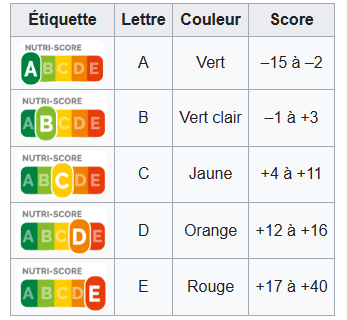

### Éléments défavorables au score

- Apport calorique pour cent grammes.
- Teneur en sucre
- Teneur en graisses saturées
- Teneur en sel.

### Éléments favorables au score

- Teneur en fruits, légumes, légumineuses (dont les légumes secs), oléagineux, huiles de colza, de noix et d'olive.
- Teneur en fibres.
- Teneur en protéines.

Pour calculer la teneur en fruits et légumes, les féculents (tels que pomme de terre, patate douce, taro, manioc dont tapioca) ne sont pas pris en compte.

Pour les fromages, la teneur en protéines est toujours prise en compte car celle-ci est liée à celle en calcium.